<a href="https://colab.research.google.com/github/dolmani38/concept_drift/blob/main/230619_DD.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Concept drift tolerant machine learning method

In [1]:
import numpy as np
import pandas as pd
import torch
from torch.autograd import Variable
import torch.nn as nn
import torch.nn.functional as F

In [2]:
import matplotlib.pyplot as plt
import seaborn as sns
sns.set()

In [3]:
import random
import os
def seed_everything(seed: int = 46):
    random.seed(seed)
    np.random.seed(seed)
    os.environ["PYTHONHASHSEED"] = str(seed)
    #tf.random.set_seed(seed)
    torch.manual_seed(seed)
    torch.cuda.manual_seed(seed)

# 실험을 위한 기본적인 function 들...

In [4]:
import sys, os
import math

from torch.autograd import Variable
from argparse import Namespace
#from FRTrain_arch import Generator, DiscriminatorF, DiscriminatorR, weights_init_normal, test_model
#from FRTrain_arch import weights_init_normal, test_model
import warnings
warnings.filterwarnings("ignore")

plt.style.use('bmh')
plt.rcParams['axes.facecolor'] = 'white'

In [5]:
main_figsize=(15,3)

In [6]:
#  I(Z,B) > 0의 관계에 대해 z0를 전처리
class Sensitivity_Adapter(nn.Module):

    def __init__(self,input_dim):
        """Initializes DiscriminatorF with torch components."""

        super(Sensitivity_Adapter, self).__init__()

        self.input_dim = input_dim
        self.fc1 = nn.ModuleList()
        self.fc2 = nn.ModuleList()
        #self.fc3 = nn.ModuleList()

        for i in range(self.input_dim):
            self.fc1.append(nn.Linear(2, 50))
            self.fc2.append(nn.Linear(50, 1))
            #self.fc3.append(nn.Linear(5, 1))

    def forward(self,x,b):
        pxy = []
        for i in range(self.input_dim):
            h0 = F.relu(self.fc1[i](torch.cat((x[:,i].reshape(-1,1),b), 1)))
            #h1 = F.relu(self.fc2[i](h0))
            #h0 = self.fc1[i](torch.cat((x[:,i].reshape(-1,1),b), 1))
            #h1 = self.fc2[i](h0)
            h2 = self.fc2[i](h0)
            pxy.append(h2)

        return torch.cat(pxy, dim=1)


In [7]:
# Define the Generator
class Generator(nn.Module):
    """FR-Train generator (classifier).

    This class is for defining the structure of FR-Train generator (classifier).
    (ref: FR-Train paper, Section 3)

    Attributes:
        model: A model consisting of torch components.
    """

    def __init__(self):
        """Initializes Generator with torch components."""
        super(Generator, self).__init__()
        self.model = nn.Sequential(
            nn.Linear(5, 20),
            nn.ReLU(),
            nn.Linear(20, 5),
            nn.ReLU(),
            nn.Linear(5, 1),
            nn.Sigmoid()
        )

    def forward(self, input_data):
        """Defines a forward operation of the model.

        Args:
            input_data: The input data.

        Returns:
            The predicted label (y_hat) for the given input data.
        """

        output = self.model(input_data)
        return output


In [26]:
from sklearn.metrics import r2_score,precision_recall_fscore_support,f1_score

def test_model(model_,model2_, tX, ty, s1):
    model_.eval()

    if model2_ == None:
        ax = tX[:,0:5]
    else:
        model2_.eval()
        ax = model2_(tX[:,0:5],tX[:,5].reshape(-1,1)/avaible_range)

    y_hat = model_(ax)
    y_hat = (y_hat.cpu().data.numpy()> 0.5).astype(float)

    print('ty',ty.shape)
    print('y_hat',y_hat.shape)

    f1 = f1_score(ty.cpu().data.numpy(),y_hat)
    #print('R-squared score',r2)
    mi_scores = make_mi_scores(pd.DataFrame(tX[:,4].cpu().data.numpy(),columns=['z0']), y_hat, discrete_features="auto")
    mi = mi_scores['z0']
    print("Test f1 score: {}".format(f1))
    print("Mutual Information y_hat^,z0 = {:.3f}".format(mi))
#     min_eo = min(Pr_y_hat_1_y_1_z_0, Pr_y_hat_1_y_1_z_1)
#     max_eo = max(Pr_y_hat_1_y_1_z_0, Pr_y_hat_1_y_1_z_1)
#     print("Equal Opportunity ratio = {:.3f}".format(min_eo/max_eo))
    return f1, mi

In [27]:

def test_all_data(generator,adapter,train_x, XT,yT, ShowChart = False,bucket_size_array=[200]):

    #XT = X[train_size:][['x0','x1','x2','x3','z0','b']]
    #yT = y[train_size:]

    device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")

    print('XT.shape',XT.shape)

    for bucket_size in bucket_size_array:
        bucket_count = int(XT.shape[0]/bucket_size)-1
        f1s = []
        MISS = {}
        DRF = {}
        for col in columns:
            MISS[col] = []
            DRF[col] = []

        for bk in tqdm(range(bucket_count)):
            tmp_x = torch.tensor(XT[bk*bucket_size:bk*bucket_size+bucket_size].values, dtype=torch.float32).to(device)
            tmp_y = yT[bk*bucket_size:bk*bucket_size+bucket_size]
            if adapter == None:
                xs = tmp_x[:,0:5]
            else:
                xs = adapter(tmp_x[:,0:5],tmp_x[:,5].reshape(-1,1)/avaible_range)
            predicted_y = generator(xs)
            predicted_y = (predicted_y.cpu().data.numpy()> 0.5).astype(float)
            f1 = f1_score(tmp_y,predicted_y)
            #r2 = r2_score(yT[bk*bucket_count:bk*bucket_count+bucket_count],predicted_y.detach().numpy())
            f1s.append(f1)

            cpu_xs = xs.cpu().data.numpy()
            mi_scores = make_mi_scores(pd.DataFrame(cpu_xs,columns=columns), tmp_y, discrete_features="auto")
            ks = __ks_drift(train_x.values,cpu_xs)
            for ix,col in enumerate(columns):
                MISS[col].append(mi_scores[col])
                DRF[col].append(ks[:,0][ix])

        df_mis = pd.DataFrame(MISS)
        df_drf = pd.DataFrame(DRF)

        if ShowChart:
            plt.figure(figsize=main_figsize)
            plt.plot(f1s,linewidth=1)
            plt.ylabel('F1 Score')
            plt.xlabel(f'bucket ({bucket_size})')
            plt.show()

            df_mis.plot(figsize=main_figsize,linewidth=1,ylabel='MI',xlabel=f'bucket ({bucket_size})',fontsize=15)
            plt.legend(loc=1,ncol=5)
            plt.show()

            df_drf.plot(figsize=main_figsize,linewidth=1,ylabel='Drift (KS-test)',xlabel=f'bucket ({bucket_size})',fontsize=15)
            plt.legend(loc=1,ncol=5)
            plt.show()

        print(f'mean of drift:\n{df_drf.mean()}')

    print('Mean F1 for all data:',np.mean(f1s))
    return f1s, df_mis, df_drf

In [10]:
# 본래의 FR-Train에서, Robustness Discriminator를 삭제 하였으므로,  val_tensors, lambda_r 를 삭제 한다.

def train_model(train_tensors, test_tensors, train_opt, lambda_f, seed, alpha, ShowChart = False):
    seed_everything()

    device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
    print(device)

    XS_train = train_tensors.XS_train.to(device)
    y_train = train_tensors.y_train.to(device)
    s1_train = train_tensors.s1_train.to(device)

    XS_test = test_tensors.XS_test.to(device)
    y_test = test_tensors.y_test.to(device)
    s1_test = test_tensors.s1_test.to(device)

    # Saves return values here
    #test_result = []

    val = train_opt.val # Number of data points in validation set
    k = train_opt.k     # Update ratio of generator and discriminator (1:k training).
    n_epochs = train_opt.n_epochs  # Number of training epoch


    # The loss values of each component will be saved in the following lists.
    # We can draw epoch-loss graph by the following lists, if necessary.
    g_losses =[]
    a_losses = []

    bce_loss = nn.BCELoss()
    mse_loss = nn.MSELoss()  # mean square error

    # Initializes generator and discriminator
    generator = Generator().to(device)

    optimizer_G = torch.optim.Adam(generator.parameters(), lr=train_opt.lr_g)

    train_len = XS_train.shape[0]

    adapter = Sensitivity_Adapter(5).to(device)
    optimizer_A = torch.optim.Adam(adapter.parameters(), lr=0.001)

    #mine = Net()
    #optimizer_M = torch.optim.Adam(mine.parameters(), lr=0.001)

    minibatch = 1000

    for epoch in range(n_epochs):


        # -------------------------------
        #  b에 대한 x의 전처리
        # -------------------------------

        if lambda_f >= 0.0:
            xs = adapter(XS_train[:,0:5],XS_train[:,5].reshape(-1,1)/avaible_range) # z0, b
            a_loss = torch.sum(mse_loss(xs, XS_train[:,0:5]))
        else:
            xs = XS_train[:,0:5]
            a_loss = torch.tensor(0)

        a_losses.append(a_loss.cpu().data.numpy())
        # -------------------
        #  Forwards Generator
        # -------------------
        #xs = torch.cat((XS_train[:,0:4], a_z.reshape(-1,1)), 1)
        #print(xs.shape)
        gen_y = generator(xs).reshape(-1,1)
        g_loss = bce_loss(gen_y, y_train.reshape(-1,1))
        g_losses.append(g_loss.cpu().data.numpy())

        optimizer_A.zero_grad()
        #optimizer_M.zero_grad()
        optimizer_G.zero_grad()

        if lambda_f >= 0.0:
            loss = (1-lambda_f) * g_loss +  lambda_f * a_loss * alpha #* 0.05
        else:
            loss = g_loss

        loss.backward()
        optimizer_G.step()
        #optimizer_M.step()
        optimizer_A.step()

        if epoch % 200 == 0:
            print(
                    "[Lambda: %1f] [Epoch %d/%d] [a loss: %f] [G loss: %f]"
                    % (lambda_f, epoch, n_epochs, a_losses[-1], g_losses[-1])
                )

        if lambda_f < 0.0:
            adapter = None

#     torch.save(generator.state_dict(), './FR-Train_on_poi_synthetic.pth')
    f1,mi = test_model(generator,adapter, XS_test, y_test, s1_test)
    #test_result.append([lambda_f, tmp[0].item(), tmp[1]])

    df_loss = pd.DataFrame({'Adapter loss':a_losses,'Classifier loss':g_losses})
    if ShowChart:
        df_loss.plot(figsize=main_figsize,linewidth=1,ylabel='loss',xlabel=f'bucket ({bucket_size})',fontsize=15)
        plt.legend(loc=1)
        plt.show()
    '''
    plt.figure(figsize=main_figsize)
    plt.plot(a_losses,linewidth=1,label='Adapter loss')
    plt.plot(g_losses,linewidth=1,label='classifier loss')
    plt.ylabel('loss')
    plt.xlabel(f'bucket ({bucket_size})')
    plt.legend(loc=1,ncol=2)
    plt.show()
    '''
    return f1,mi,generator,adapter,df_loss

In [11]:
plt.style.use('bmh')

def __ks_2samp2(sample1, sample2):
    # Gets all observations
    sample1 = np.sort(sample1)
    sample2 = np.sort(sample2)
    n1 = sample1.shape[0]
    n2 = sample2.shape[0]
    data_all = np.concatenate([sample1, sample2])
    cdf1 = np.searchsorted(sample1, data_all, side='right') / n1
    cdf2 = np.searchsorted(sample2, data_all, side='right') / n2
    # Evaluates the KS statistic
    cddiffs = cdf1 - cdf2
    minS = -np.min(cddiffs)
    maxS = np.max(cddiffs)
    ks_stat =  max(minS, maxS)

    #if ks_stat == minS:
    #    ks_stat = -ks_stat

    # Calculates the P-Value based on the two-sided test
    # The P-Value comes from the KS Distribution Survival Function (SF = 1-CDF)
    m, n = float(n1), float(n2)
    en = m * n / (m + n)
    p_value = 0.0 #stats.kstwobign.sf(math.sqrt(en) * abs(ks_stat))
    #p_value = stats.kstwobign.sf(en * abs(ks_stat))
    return ks_stat,p_value

def __ks_drift(ref_x,inf_x):
    x_drift = np.zeros((ref_x.shape[1],2))
    for i in range(ref_x.shape[1]):
        #s, p = ks_2samp(ref_x[:,i],inf_x[:,i],mode='asymp')
        s, p = __ks_2samp2(ref_x[:,i],inf_x[:,i])
        x_drift[i,0] = s
        x_drift[i,1] = p
    return x_drift

In [12]:
from sklearn.feature_selection import mutual_info_regression, mutual_info_classif

def make_mi_scores(X, y, discrete_features):
    mi_scores = mutual_info_classif(X, y, discrete_features=discrete_features)
    mi_scores = pd.Series(mi_scores, name="MI Scores", index=X.columns)
    mi_scores = mi_scores.sort_values(ascending=False)
    return mi_scores

# 실험
+ synthetic data를 만든다.
+ 해당 data는 data drift가 시간에 따라 변화 된다.
+ 이때, 성능의 감소를 정량적으로 측정하고
+ Bucket을 고려한 몇개의 모델을 적용한다.

## synthetic data의 생성 (Case #1 MI의 감소, Drift의 증가 )



+ 5개의 feature
+ 각각 importance를 부여
+ 그 중, 1개의 feature는 가변 data drift

In [ ]:
data_size = 40000
cor = [1.5, 1.2, 0.9 , 0.7, 0.5]

In [ ]:
seed_everything()

y= (np.random.normal(0.5,0.5,100) > 0.5).astype(int)
sum(y)

40

In [ ]:
seed_everything()
#y= np.random.normal(1,2,data_size)
y= (np.random.normal(0.5,0.5,data_size) > 0.5).astype(int)
x = np.zeros((data_size,5))
for ix,cor_ in enumerate(cor):
    x[:,ix] = y + np.random.normal(1,cor_,data_size)
    #sns.scatterplot(x=x[:,ix],y=y)

In [ ]:
seed_everything(100)

for i in range(400):
    s = i*100
    #x[s:s+100,3] = y[s:s+100] + np.random.normal(1,5-(i/100),100)
    x[s:s+100,4] = y[s:s+100] + np.random.normal(1,0.5+(i/100),100)
    #x[s:s+100,5] = i
#sns.scatterplot(x=x[0:200,4],y=y[0:200])
#sns.scatterplot(x=x[39800:40000,4],y=y[39800:40000])

### KS-test 통계량의 측정

In [ ]:
columns=['x0','x1','x2','x3','z0']
X = pd.DataFrame(x,columns=columns)
mi_scores = make_mi_scores(X, y, discrete_features="auto")
print(mi_scores)

x3    0.202783
x2    0.134082
x1    0.079411
x0    0.050887
z0    0.027068
Name: MI Scores, dtype: float64


Bucket size 200 step_size 190


100%|██████████| 190/190 [00:03<00:00, 56.99it/s]


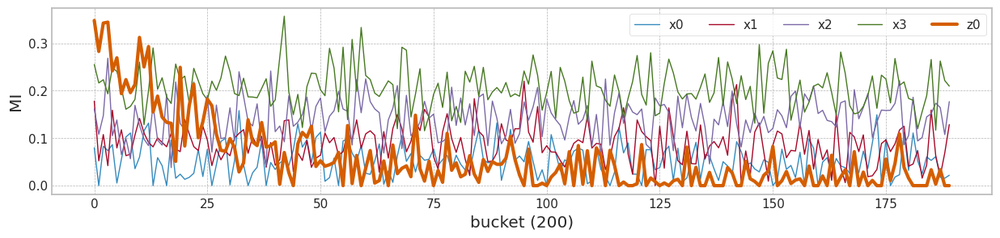

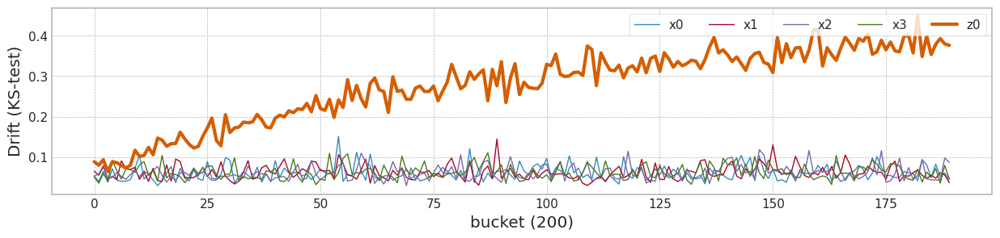

In [ ]:
from tqdm import tqdm

plt.style.use('bmh')
plt.rcParams['axes.facecolor'] = 'white'

bucket_size_array=[200]#[10,50,100,200]

######################## Normalization ############################
from sklearn.preprocessing import MinMaxScaler, StandardScaler
scaler_c1 = MinMaxScaler()
# trainset을 가지고 Scaler를 fit하고, testset을 포함한 그 이후의 Data를 모두 transform 한다.
X = pd.DataFrame(np.concatenate((scaler_c1.fit_transform(X[0:1800]), scaler_c1.transform(X[1800:])),axis=0), columns=columns)


for bucket_size in bucket_size_array:
    MIS = {}
    DRF = {}
    for col in columns:
        MIS[col] = []
        DRF[col] = []

    #step_size = int(x.shape[0]/bucket_size)
    step_size = int((x.shape[0]-2000)/bucket_size)

    print('Bucket size',bucket_size,'step_size',step_size)

    for bk in tqdm(range(step_size)):
        #print(bk,step_size)
        mi_scores = make_mi_scores(X[bk*bucket_size:bk*bucket_size+bucket_size], y[bk*bucket_size:bk*bucket_size+bucket_size], discrete_features="auto")
        ks = __ks_drift(X[0:1800].values,X[bk*bucket_size+2000:bk*bucket_size+bucket_size+2000].values)
        for ix,col in enumerate(columns):
            MIS[col].append(mi_scores[col])
            DRF[col].append(ks[:,0][ix])

    df_mis = pd.DataFrame(MIS)
    df_drf = pd.DataFrame(DRF)
    '''
    df_mis['x0'].plot(figsize=main_figsize,linewidth=1,ylabel='MI',xlabel=f'bucket ({bucket_size})',fontsize=10)
    plt.show()
    df_mis['x1'].plot(figsize=main_figsize,linewidth=1,ylabel='MI',xlabel=f'bucket ({bucket_size})',fontsize=10)
    plt.show()
    df_mis['x2'].plot(figsize=main_figsize,linewidth=1,ylabel='MI',xlabel=f'bucket ({bucket_size})',fontsize=10)
    plt.show()
    df_mis['x3'].plot(figsize=main_figsize,linewidth=1,ylabel='MI',xlabel=f'bucket ({bucket_size})',fontsize=10)
    plt.show()
    df_mis['z0'].plot(figsize=main_figsize,linewidth=1,ylabel='MI',xlabel=f'bucket ({bucket_size})',fontsize=10)
    plt.show()
    '''
    plt.figure(figsize=main_figsize)
    plt.plot(df_mis[['x0','x1','x2','x3']].values,linewidth=1,label=['x0','x1','x2','x3'])
    plt.plot(df_mis['z0'].values,linewidth=3,label='z0')
    plt.ylabel('MI')
    plt.xlabel(f'bucket ({bucket_size})')
    #df_mis.plot(figsize=main_figsize,linewidth=1,ylabel='MI',xlabel=f'bucket ({bucket_size})',fontsize=15)
    plt.legend(loc=1,ncol=5)
    plt.show()

    plt.figure(figsize=main_figsize)
    plt.plot(df_drf[['x0','x1','x2','x3']].values,linewidth=1,label=['x0','x1','x2','x3'])
    plt.plot(df_drf['z0'].values,linewidth=3,label='z0')
    plt.ylabel('Drift (KS-test)')
    plt.xlabel(f'bucket ({bucket_size})')
    #df_mis.plot(figsize=main_figsize,linewidth=1,ylabel='MI',xlabel=f'bucket ({bucket_size})',fontsize=15)
    plt.legend(loc=1,ncol=5)
    plt.show()

### 학습 및 전체 예측

+ 2000개를 학습하고, 이후 38000개를 추정한다.

cuda:0


100%|██████████| 1000/1000 [00:26<00:00, 38.03it/s]


MSE: 0.25
RMSE: 0.50


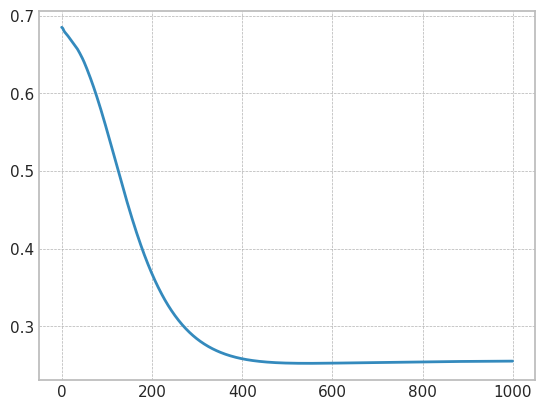

feature 5, test_f1 0.8636363636363636


In [ ]:
import copy
import torch.optim as optim

seed_everything()

device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
print(device)
# Convert to 2D PyTorch tensors
X_train = torch.tensor(X[0:1800][['x0','x1','x2','x3','z0']].values, dtype=torch.float32).to(device)
y_train = torch.tensor(y[0:1800], dtype=torch.float32).reshape(-1, 1).to(device)

X_test = torch.tensor(X[1800:2000][['x0','x1','x2','x3','z0']].values, dtype=torch.float32).to(device)
y_test = torch.tensor(y[1800:2000], dtype=torch.float32).reshape(-1, 1).to(device)

# Define the model
model = nn.Sequential(
    nn.Linear(5, 20),
    nn.ReLU(),
    nn.Linear(20, 5),
    nn.ReLU(),
    nn.Linear(5, 1),
    nn.Sigmoid()
).to(device)

# loss function and optimizer
loss_fn = nn.BCELoss()  # mean square error
optimizer = optim.Adam(model.parameters(), lr=0.0001)

n_epochs = 1000   # number of epochs to run
batch_size = 100  # size of each batch
batch_start = torch.arange(0, len(X_train), batch_size)

# Hold the best model
best_mse = np.inf   # init to infinity
best_weights = None
history = []

for epoch in tqdm(range(n_epochs)):
    model.train()
    with tqdm(batch_start, unit="batch", mininterval=0, disable=True) as bar:
        bar.set_description(f"Epoch {epoch}")
        for start in bar:
            # take a batch
            X_batch = X_train[start:start+batch_size]
            y_batch = y_train[start:start+batch_size]
            # forward pass
            y_pred = model(X_batch)
            loss = loss_fn(y_pred, y_batch)
            # backward pass
            optimizer.zero_grad()
            loss.backward()
            # update weights
            optimizer.step()
            # print progress
            bar.set_postfix(mse=float(loss))
    # evaluate accuracy at end of each epoch
    model.eval()
    y_pred = model(X_test)
    mse = loss_fn(y_pred, y_test)
    mse = float(mse)
    history.append(mse)
    if mse < best_mse:
        best_mse = mse
        best_weights = copy.deepcopy(model.state_dict())

# restore model and return best accuracy
model.load_state_dict(best_weights)
print("MSE: %.2f" % best_mse)
print("RMSE: %.2f" % np.sqrt(best_mse))
plt.plot(history)
plt.show()

from sklearn.metrics import r2_score,precision_recall_fscore_support,f1_score
predicted_y = model(X_test)
f1 = f1_score(y_test.cpu().data.numpy(),(predicted_y.cpu().data.numpy()> 0.5).astype(float))
print('feature 5, test_f1',f1)

100%|██████████| 189/189 [00:00<00:00, 561.24it/s]


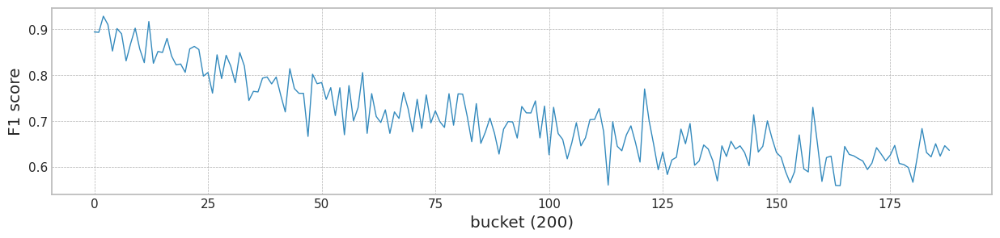

,lambda,test_f1,init_f1,mean_f1,last_f1,"MI(y^,z)"
0,Case #1 Feature 5,0.863636,0.894009,0.70725,0.636364,0.0


In [ ]:

XT = X[2000:][['x0','x1','x2','x3','z0']]
yT = y[2000:]

bucket_size_array=[200]

for bucket_size in bucket_size_array:
    bucket_count = int(XT.shape[0]/bucket_size)-1
    f1s = []
    for bk in tqdm(range(bucket_count)):
        tmp_x = torch.tensor(XT[bk*bucket_size:bk*bucket_size+bucket_size].values, dtype=torch.float32).to(device)
        predicted_y = model(tmp_x)
        predicted_y = (predicted_y.cpu().data.numpy()> 0.5).astype(float)
        f1_ = f1_score(yT[bk*bucket_size:bk*bucket_size+bucket_size],predicted_y)
        f1s.append(f1_)
    plt.figure(figsize=main_figsize)
    plt.plot(f1s,linewidth=1)
    plt.ylabel('F1 score')
    plt.xlabel(f'bucket ({bucket_size})')
    #plt.title('Changes of F1 score according to bucket')
    plt.show()

result_table3 = {}
result_table3['lambda']=[]
result_table3['test_f1']=[]
result_table3['init_f1']=[]
result_table3['mean_f1']=[]
result_table3['last_f1']=[]
result_table3['MI(y^,z)']=[]

result_table3['lambda'].append('Case #1 Feature 5')
result_table3['test_f1'].append(f1)
result_table3['init_f1'].append(f1s[0])
result_table3['mean_f1'].append(np.mean(f1s))
result_table3['last_f1'].append(f1s[-1])
result_table3['MI(y^,z)'].append(mi_scores['z0'])

pd.DataFrame(result_table3)

### 내성 학습의 적용

In [ ]:

# bucket 하나의 크기는 100
# 2000개의 학습데이터에는 20개의 bucket이 있음.
# 학습데이터 100개당 +1의 bucket count를 증가 시킴
X['b'] = [int(b) for b in X.index.values/100]
X

,x0,x1,x2,x3,z0,b
0,0.511187,0.348595,0.564807,0.482506,0.395084,0
1,0.435937,0.524656,0.595436,0.762536,0.606272,0
2,0.479071,0.682932,0.738867,0.596141,0.688060,0
3,0.572894,0.251745,0.392850,0.522275,0.344350,0
4,0.562890,0.613393,0.481594,0.596584,0.670729,0
...,...,...,...,...,...,...
39995,0.332800,0.214564,0.468946,0.614324,-0.069684,399
39996,0.414601,0.252607,0.438192,0.601093,0.984518,399
39997,0.361400,0.558191,0.590386,0.612855,0.528420,399
39998,0.459619,0.212723,0.148134,0.664097,2.043499,399


lambda_f2 2.0
cuda:0
[Lambda: -0.100000] [Epoch 0/4000] [a loss: 0.000000] [G loss: 0.696380]
[Lambda: -0.100000] [Epoch 200/4000] [a loss: 0.000000] [G loss: 0.681345]
[Lambda: -0.100000] [Epoch 400/4000] [a loss: 0.000000] [G loss: 0.668415]
[Lambda: -0.100000] [Epoch 600/4000] [a loss: 0.000000] [G loss: 0.654487]
[Lambda: -0.100000] [Epoch 800/4000] [a loss: 0.000000] [G loss: 0.638451]
[Lambda: -0.100000] [Epoch 1000/4000] [a loss: 0.000000] [G loss: 0.618187]
[Lambda: -0.100000] [Epoch 1200/4000] [a loss: 0.000000] [G loss: 0.594688]
[Lambda: -0.100000] [Epoch 1400/4000] [a loss: 0.000000] [G loss: 0.568330]
[Lambda: -0.100000] [Epoch 1600/4000] [a loss: 0.000000] [G loss: 0.539704]
[Lambda: -0.100000] [Epoch 1800/4000] [a loss: 0.000000] [G loss: 0.509774]
[Lambda: -0.100000] [Epoch 2000/4000] [a loss: 0.000000] [G loss: 0.479563]
[Lambda: -0.100000] [Epoch 2200/4000] [a loss: 0.000000] [G loss: 0.450001]
[Lambda: -0.100000] [Epoch 2400/4000] [a loss: 0.000000] [G loss: 0.421808

100%|██████████| 189/189 [00:03<00:00, 60.24it/s]


mean of drift:
x0    0.061049
x1    0.062651
x2    0.061975
x3    0.063260
z0    0.276490
dtype: float64
Mean F1 for all data: 0.7043884044703137
cuda:0
[Lambda: 0.000000] [Epoch 0/4000] [a loss: 0.531513] [G loss: 0.695597]
[Lambda: 0.000000] [Epoch 200/4000] [a loss: 2.436126] [G loss: 0.635592]
[Lambda: 0.000000] [Epoch 400/4000] [a loss: 28.395292] [G loss: 0.426569]
[Lambda: 0.000000] [Epoch 600/4000] [a loss: 107.542900] [G loss: 0.269865]
[Lambda: 0.000000] [Epoch 800/4000] [a loss: 180.970139] [G loss: 0.231923]
[Lambda: 0.000000] [Epoch 1000/4000] [a loss: 228.348465] [G loss: 0.226037]
[Lambda: 0.000000] [Epoch 1200/4000] [a loss: 256.693268] [G loss: 0.225071]
[Lambda: 0.000000] [Epoch 1400/4000] [a loss: 276.360718] [G loss: 0.224795]
[Lambda: 0.000000] [Epoch 1600/4000] [a loss: 290.089508] [G loss: 0.224625]
[Lambda: 0.000000] [Epoch 1800/4000] [a loss: 300.561676] [G loss: 0.224464]
[Lambda: 0.000000] [Epoch 2000/4000] [a loss: 308.678833] [G loss: 0.224354]
[Lambda: 0.0

100%|██████████| 189/189 [00:03<00:00, 58.86it/s]


mean of drift:
x0    1.000000
x1    0.999971
x2    1.000000
x3    0.999941
z0    0.997252
dtype: float64
Mean F1 for all data: 0.7509869523519865
cuda:0
[Lambda: 0.100000] [Epoch 0/4000] [a loss: 0.531513] [G loss: 0.695597]
[Lambda: 0.100000] [Epoch 200/4000] [a loss: 0.007793] [G loss: 0.686135]
[Lambda: 0.100000] [Epoch 400/4000] [a loss: 0.034474] [G loss: 0.651072]
[Lambda: 0.100000] [Epoch 600/4000] [a loss: 0.085113] [G loss: 0.590910]
[Lambda: 0.100000] [Epoch 800/4000] [a loss: 0.134468] [G loss: 0.524515]
[Lambda: 0.100000] [Epoch 1000/4000] [a loss: 0.176427] [G loss: 0.457771]
[Lambda: 0.100000] [Epoch 1200/4000] [a loss: 0.212584] [G loss: 0.391838]
[Lambda: 0.100000] [Epoch 1400/4000] [a loss: 0.224993] [G loss: 0.339562]
[Lambda: 0.100000] [Epoch 1600/4000] [a loss: 0.209099] [G loss: 0.306827]
[Lambda: 0.100000] [Epoch 1800/4000] [a loss: 0.188442] [G loss: 0.285047]
[Lambda: 0.100000] [Epoch 2000/4000] [a loss: 0.167438] [G loss: 0.269890]
[Lambda: 0.100000] [Epoch 220

100%|██████████| 189/189 [00:03<00:00, 59.14it/s]


mean of drift:
x0    0.459383
x1    0.921017
x2    0.928927
x3    0.383028
z0    0.639750
dtype: float64
Mean F1 for all data: 0.6855476833745997
cuda:0
[Lambda: 0.200000] [Epoch 0/4000] [a loss: 0.531513] [G loss: 0.695597]
[Lambda: 0.200000] [Epoch 200/4000] [a loss: 0.004653] [G loss: 0.687646]
[Lambda: 0.200000] [Epoch 400/4000] [a loss: 0.009114] [G loss: 0.663602]
[Lambda: 0.200000] [Epoch 600/4000] [a loss: 0.027109] [G loss: 0.617237]
[Lambda: 0.200000] [Epoch 800/4000] [a loss: 0.047299] [G loss: 0.558732]
[Lambda: 0.200000] [Epoch 1000/4000] [a loss: 0.062517] [G loss: 0.500942]
[Lambda: 0.200000] [Epoch 1200/4000] [a loss: 0.075863] [G loss: 0.442147]
[Lambda: 0.200000] [Epoch 1400/4000] [a loss: 0.088084] [G loss: 0.385627]
[Lambda: 0.200000] [Epoch 1600/4000] [a loss: 0.089936] [G loss: 0.343789]
[Lambda: 0.200000] [Epoch 1800/4000] [a loss: 0.085189] [G loss: 0.314966]
[Lambda: 0.200000] [Epoch 2000/4000] [a loss: 0.078933] [G loss: 0.293767]
[Lambda: 0.200000] [Epoch 220

100%|██████████| 189/189 [00:03<00:00, 59.02it/s]


mean of drift:
x0    0.895729
x1    0.892554
x2    0.846961
x3    0.520979
z0    0.503145
dtype: float64
Mean F1 for all data: 0.40844453696112765
cuda:0
[Lambda: 0.300000] [Epoch 0/4000] [a loss: 0.531513] [G loss: 0.695597]
[Lambda: 0.300000] [Epoch 200/4000] [a loss: 0.003879] [G loss: 0.688479]
[Lambda: 0.300000] [Epoch 400/4000] [a loss: 0.003729] [G loss: 0.669026]
[Lambda: 0.300000] [Epoch 600/4000] [a loss: 0.011546] [G loss: 0.632377]
[Lambda: 0.300000] [Epoch 800/4000] [a loss: 0.022029] [G loss: 0.579792]
[Lambda: 0.300000] [Epoch 1000/4000] [a loss: 0.031418] [G loss: 0.524096]
[Lambda: 0.300000] [Epoch 1200/4000] [a loss: 0.038506] [G loss: 0.469879]
[Lambda: 0.300000] [Epoch 1400/4000] [a loss: 0.044820] [G loss: 0.415893]
[Lambda: 0.300000] [Epoch 1600/4000] [a loss: 0.048169] [G loss: 0.370113]
[Lambda: 0.300000] [Epoch 1800/4000] [a loss: 0.047672] [G loss: 0.335949]
[Lambda: 0.300000] [Epoch 2000/4000] [a loss: 0.045334] [G loss: 0.311365]
[Lambda: 0.300000] [Epoch 22

100%|██████████| 189/189 [00:03<00:00, 58.48it/s]


mean of drift:
x0    0.499509
x1    0.425735
x2    0.796940
x3    0.388283
z0    0.477816
dtype: float64
Mean F1 for all data: 0.6884768962223582
cuda:0
[Lambda: 0.400000] [Epoch 0/4000] [a loss: 0.531513] [G loss: 0.695597]
[Lambda: 0.400000] [Epoch 200/4000] [a loss: 0.003582] [G loss: 0.689003]
[Lambda: 0.400000] [Epoch 400/4000] [a loss: 0.001899] [G loss: 0.672065]
[Lambda: 0.400000] [Epoch 600/4000] [a loss: 0.005217] [G loss: 0.643224]
[Lambda: 0.400000] [Epoch 800/4000] [a loss: 0.010900] [G loss: 0.595787]
[Lambda: 0.400000] [Epoch 1000/4000] [a loss: 0.017069] [G loss: 0.542611]
[Lambda: 0.400000] [Epoch 1200/4000] [a loss: 0.022161] [G loss: 0.488820]
[Lambda: 0.400000] [Epoch 1400/4000] [a loss: 0.025913] [G loss: 0.437535]
[Lambda: 0.400000] [Epoch 1600/4000] [a loss: 0.028181] [G loss: 0.390738]
[Lambda: 0.400000] [Epoch 1800/4000] [a loss: 0.028814] [G loss: 0.353624]
[Lambda: 0.400000] [Epoch 2000/4000] [a loss: 0.027791] [G loss: 0.326075]
[Lambda: 0.400000] [Epoch 220

100%|██████████| 189/189 [00:03<00:00, 58.08it/s]


mean of drift:
x0    0.541820
x1    0.478372
x2    0.708598
x3    0.241784
z0    0.470206
dtype: float64
Mean F1 for all data: 0.7388480679166414
cuda:0
[Lambda: 0.500000] [Epoch 0/4000] [a loss: 0.531513] [G loss: 0.695597]
[Lambda: 0.500000] [Epoch 200/4000] [a loss: 0.003473] [G loss: 0.689420]
[Lambda: 0.500000] [Epoch 400/4000] [a loss: 0.001152] [G loss: 0.674020]
[Lambda: 0.500000] [Epoch 600/4000] [a loss: 0.002199] [G loss: 0.652520]
[Lambda: 0.500000] [Epoch 800/4000] [a loss: 0.005432] [G loss: 0.610397]
[Lambda: 0.500000] [Epoch 1000/4000] [a loss: 0.009120] [G loss: 0.560392]
[Lambda: 0.500000] [Epoch 1200/4000] [a loss: 0.012795] [G loss: 0.507420]
[Lambda: 0.500000] [Epoch 1400/4000] [a loss: 0.015645] [G loss: 0.456500]
[Lambda: 0.500000] [Epoch 1600/4000] [a loss: 0.017346] [G loss: 0.409784]
[Lambda: 0.500000] [Epoch 1800/4000] [a loss: 0.017767] [G loss: 0.371553]
[Lambda: 0.500000] [Epoch 2000/4000] [a loss: 0.017436] [G loss: 0.341822]
[Lambda: 0.500000] [Epoch 220

100%|██████████| 189/189 [00:03<00:00, 57.72it/s]


mean of drift:
x0    0.476708
x1    0.408248
x2    0.231573
x3    0.222672
z0    0.429671
dtype: float64
Mean F1 for all data: 0.734954435377652
cuda:0
[Lambda: 0.600000] [Epoch 0/4000] [a loss: 0.531513] [G loss: 0.695597]
[Lambda: 0.600000] [Epoch 200/4000] [a loss: 0.003437] [G loss: 0.689674]
[Lambda: 0.600000] [Epoch 400/4000] [a loss: 0.000837] [G loss: 0.675270]
[Lambda: 0.600000] [Epoch 600/4000] [a loss: 0.000945] [G loss: 0.657524]
[Lambda: 0.600000] [Epoch 800/4000] [a loss: 0.002304] [G loss: 0.629783]
[Lambda: 0.600000] [Epoch 1000/4000] [a loss: 0.004281] [G loss: 0.593023]
[Lambda: 0.600000] [Epoch 1200/4000] [a loss: 0.006587] [G loss: 0.548829]
[Lambda: 0.600000] [Epoch 1400/4000] [a loss: 0.008714] [G loss: 0.501142]
[Lambda: 0.600000] [Epoch 1600/4000] [a loss: 0.010441] [G loss: 0.454097]
[Lambda: 0.600000] [Epoch 1800/4000] [a loss: 0.011294] [G loss: 0.410697]
[Lambda: 0.600000] [Epoch 2000/4000] [a loss: 0.011537] [G loss: 0.374774]
[Lambda: 0.600000] [Epoch 2200

100%|██████████| 189/189 [00:03<00:00, 58.62it/s]


mean of drift:
x0    0.648777
x1    0.331114
x2    0.216899
x3    0.199033
z0    0.295406
dtype: float64
Mean F1 for all data: 0.7479259823918673
cuda:0
[Lambda: 0.700000] [Epoch 0/4000] [a loss: 0.531513] [G loss: 0.695597]
[Lambda: 0.700000] [Epoch 200/4000] [a loss: 0.003433] [G loss: 0.689861]
[Lambda: 0.700000] [Epoch 400/4000] [a loss: 0.000701] [G loss: 0.676147]
[Lambda: 0.700000] [Epoch 600/4000] [a loss: 0.000380] [G loss: 0.660812]
[Lambda: 0.700000] [Epoch 800/4000] [a loss: 0.000849] [G loss: 0.638533]
[Lambda: 0.700000] [Epoch 1000/4000] [a loss: 0.001699] [G loss: 0.608940]
[Lambda: 0.700000] [Epoch 1200/4000] [a loss: 0.002800] [G loss: 0.571959]
[Lambda: 0.700000] [Epoch 1400/4000] [a loss: 0.004095] [G loss: 0.529148]
[Lambda: 0.700000] [Epoch 1600/4000] [a loss: 0.005314] [G loss: 0.484426]
[Lambda: 0.700000] [Epoch 1800/4000] [a loss: 0.006170] [G loss: 0.442145]
[Lambda: 0.700000] [Epoch 2000/4000] [a loss: 0.006660] [G loss: 0.404550]
[Lambda: 0.700000] [Epoch 220

100%|██████████| 189/189 [00:03<00:00, 58.15it/s]


mean of drift:
x0    0.167275
x1    0.323301
x2    0.259483
x3    0.175141
z0    0.394392
dtype: float64
Mean F1 for all data: 0.7864578856761586
cuda:0
[Lambda: 0.800000] [Epoch 0/4000] [a loss: 0.531513] [G loss: 0.695597]
[Lambda: 0.800000] [Epoch 200/4000] [a loss: 0.003440] [G loss: 0.690003]
[Lambda: 0.800000] [Epoch 400/4000] [a loss: 0.000650] [G loss: 0.676782]
[Lambda: 0.800000] [Epoch 600/4000] [a loss: 0.000169] [G loss: 0.662777]
[Lambda: 0.800000] [Epoch 800/4000] [a loss: 0.000305] [G loss: 0.643003]
[Lambda: 0.800000] [Epoch 1000/4000] [a loss: 0.000585] [G loss: 0.617827]
[Lambda: 0.800000] [Epoch 1200/4000] [a loss: 0.001026] [G loss: 0.585905]
[Lambda: 0.800000] [Epoch 1400/4000] [a loss: 0.001559] [G loss: 0.548504]
[Lambda: 0.800000] [Epoch 1600/4000] [a loss: 0.002120] [G loss: 0.507956]
[Lambda: 0.800000] [Epoch 1800/4000] [a loss: 0.002641] [G loss: 0.467193]
[Lambda: 0.800000] [Epoch 2000/4000] [a loss: 0.002972] [G loss: 0.429585]
[Lambda: 0.800000] [Epoch 220

100%|██████████| 189/189 [00:03<00:00, 58.96it/s]


mean of drift:
x0    0.100003
x1    0.234497
x2    0.131461
x3    0.152516
z0    0.326029
dtype: float64
Mean F1 for all data: 0.8019739235205774
cuda:0
[Lambda: 0.900000] [Epoch 0/4000] [a loss: 0.531513] [G loss: 0.695597]
[Lambda: 0.900000] [Epoch 200/4000] [a loss: 0.003454] [G loss: 0.690122]
[Lambda: 0.900000] [Epoch 400/4000] [a loss: 0.000639] [G loss: 0.677280]
[Lambda: 0.900000] [Epoch 600/4000] [a loss: 0.000088] [G loss: 0.664426]
[Lambda: 0.900000] [Epoch 800/4000] [a loss: 0.000084] [G loss: 0.642631]
[Lambda: 0.900000] [Epoch 1000/4000] [a loss: 0.000144] [G loss: 0.616725]
[Lambda: 0.900000] [Epoch 1200/4000] [a loss: 0.000245] [G loss: 0.587206]
[Lambda: 0.900000] [Epoch 1400/4000] [a loss: 0.000378] [G loss: 0.553511]
[Lambda: 0.900000] [Epoch 1600/4000] [a loss: 0.000533] [G loss: 0.516781]
[Lambda: 0.900000] [Epoch 1800/4000] [a loss: 0.000671] [G loss: 0.479559]
[Lambda: 0.900000] [Epoch 2000/4000] [a loss: 0.000788] [G loss: 0.443658]
[Lambda: 0.900000] [Epoch 220

100%|██████████| 189/189 [00:03<00:00, 56.07it/s]


mean of drift:
x0    0.084541
x1    0.179086
x2    0.137778
x3    0.093060
z0    0.159847
dtype: float64
Mean F1 for all data: 0.8022681609620766


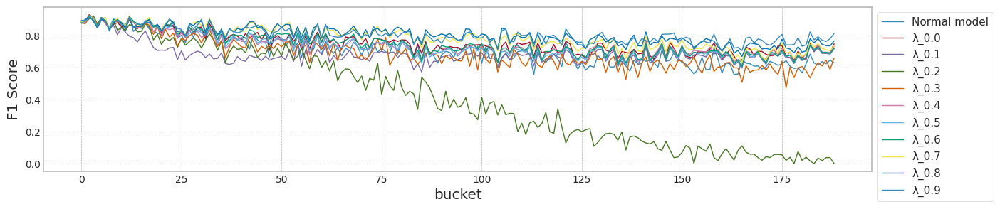

                   lambda   test_f1   init_f1   mean_f1   last_f1  MI(y^,z)
0   Case #1, Normal model  0.866667  0.889908  0.704388  0.630137  0.258548
1                     0.0  0.865169  0.889908  0.750987  0.748252  0.263942
2                     0.1  0.861878  0.882883  0.685548  0.717949  0.228900
3                     0.2  0.877778  0.877828  0.408445  0.000000  0.240773
4                     0.3  0.866667  0.885845  0.688477  0.660287  0.236441
5                     0.4  0.879121  0.885845  0.738848  0.732026  0.260430
6                     0.5  0.877778  0.881818  0.734954  0.722581  0.266995
7                     0.6  0.877778  0.881818  0.747926  0.720257  0.266995
8                     0.7  0.879121  0.885845  0.786458  0.736842  0.238932
9                     0.8  0.879121  0.890909  0.801974  0.767123  0.238932
10                    0.9  0.882682  0.894977  0.802268  0.813433  0.267588
max_mean_lambda= 0.9


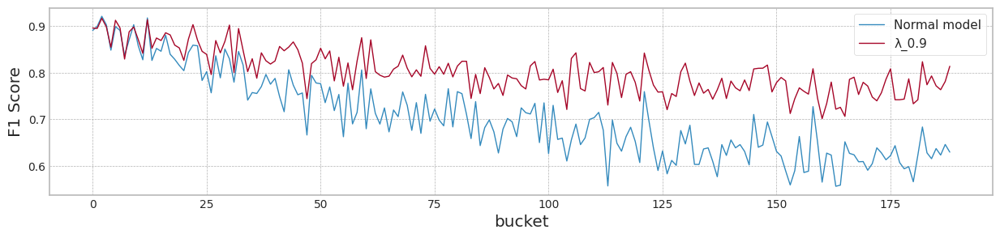

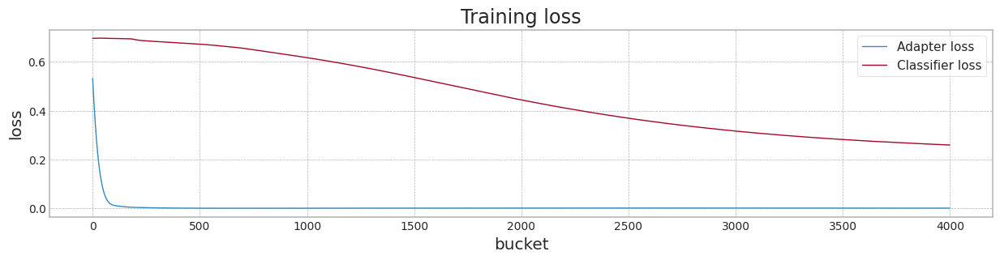

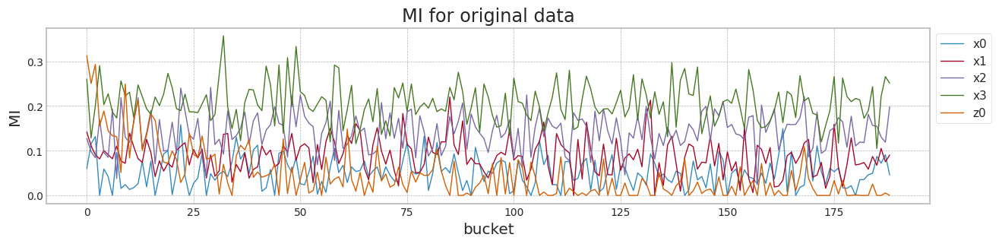

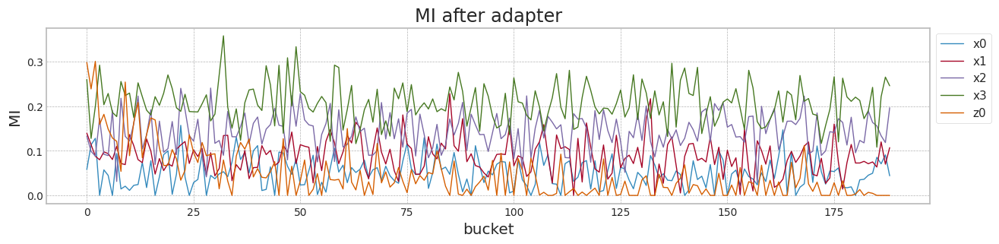

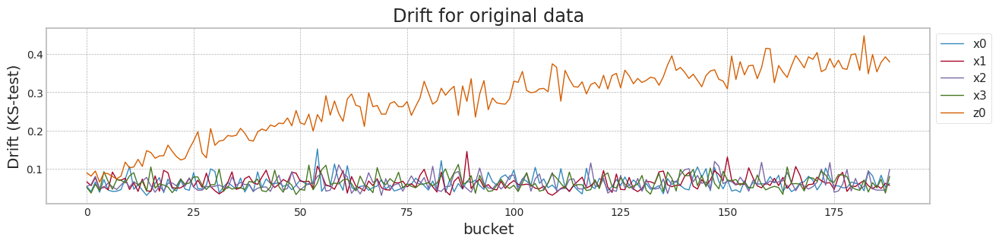

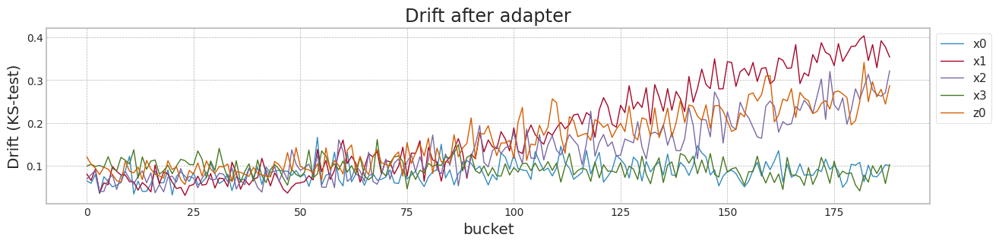

In [ ]:
avaible_range = 400
seed = 1
train_tensors = Namespace(XS_train = torch.tensor(X[0:1800][['x0','x1','x2','x3','z0']].values, dtype=torch.float32),
                          y_train = torch.tensor(y[0:1800], dtype=torch.float32),
                          s1_train = torch.tensor(X[0:1800][['z0']].values, dtype=torch.float32))
test_tensors = Namespace(XS_test = torch.tensor(X[1800:2000][['x0','x1','x2','x3','z0']].values, dtype=torch.float32),
                         y_test = torch.tensor(y[1800:2000], dtype=torch.float32),
                         s1_test = torch.tensor(X[1800:2000][['z0']].values, dtype=torch.float32))

train_tensors1 = Namespace(XS_train = torch.tensor(X[0:1800][['x0','x1','x2','x3','z0','b']].values, dtype=torch.float32),
                          y_train = torch.tensor(y[0:1800], dtype=torch.float32),
                          s1_train = torch.tensor(X[0:1800][['z0']].values, dtype=torch.float32))
test_tensors1 = Namespace(XS_test = torch.tensor(X[1800:2000][['x0','x1','x2','x3','z0','b']].values, dtype=torch.float32),
                         y_test = torch.tensor(y[1800:2000], dtype=torch.float32),
                         s1_test = torch.tensor(X[1800:2000][['z0']].values, dtype=torch.float32))

train_opt = Namespace(val=0, n_epochs=4000, k=5, lr_g=0.0001, lr_f=0.001, lr_r=0.001)
lambda_f_set = [-0.1,0.0,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9] #[-0.1,0.0,0.5] #
lambda_f_set2 = [2.0]
lambda_a2 = 0.0

for lambda_f2 in lambda_f_set2:
    #lambda_a2 = lambda_f2
    print('lambda_f2',lambda_f2)
    result_table = {}
    result_table2 = {}
    result_table2['lambda']=[]
    result_table2['test_f1']=[]
    result_table2['init_f1']=[]
    result_table2['mean_f1']=[]
    result_table2['last_f1']=[]
    result_table2['MI(y^,z)']=[]
    infos = {}
    for lambda_f in lambda_f_set:
        '''
        if lambda_f == 0.0:
            f1,mi,last_generator= train_model(train_tensors, test_tensors, train_opt, lambda_f = lambda_f, seed = seed)
            result_table[f'lambda_{lambda_f}'] = test_all_data(last_generator)
        else:
        '''
        f1,mi,last_generator, last_adapter, df_loss = train_model(train_tensors1, test_tensors1, train_opt, lambda_f = lambda_f, seed = seed, alpha= lambda_f2 )# 0.00057)
        tad,df_mis,df_drf = test_all_data(last_generator,last_adapter,X[0:1800][['x0','x1','x2','x3','z0']],X[2000:][['x0','x1','x2','x3','z0','b']],y[2000:])
        if lambda_f < 0.0:
            result_table2['lambda'].append("Case #1, Normal model")
            result_table['Normal model'] = tad
        else:
            result_table2['lambda'].append(lambda_f)
            result_table[f'λ_{lambda_f}'] = tad

        infos[f'λ_{lambda_f}'] = (df_loss,df_mis,df_drf)
        result_table2['test_f1'].append(f1)
        result_table2['init_f1'].append(tad[0])
        result_table2['mean_f1'].append(np.mean(tad))
        result_table2['last_f1'].append(tad[-1])
        result_table2['MI(y^,z)'].append(mi)

    result_df = pd.DataFrame(result_table)
    result_df.plot(figsize=main_figsize,linewidth=1,ylabel='F1 Score',xlabel='bucket',fontsize=10)
    plt.legend(bbox_to_anchor=(1.0, 1.0))
    plt.show()

    result4_df = pd.DataFrame(result_table2)

    print(result4_df)

    max_mean_lambda = result4_df[result4_df['mean_f1']==np.max(result4_df['mean_f1'])]['lambda']

    print('max_mean_lambda=',max_mean_lambda.values[0])

    result_df[['Normal model',f'λ_{max_mean_lambda.values[0]}']].plot(figsize=main_figsize,linewidth=1,ylabel='F1 Score',xlabel='bucket',fontsize=10)
    plt.legend(bbox_to_anchor=(1.0, 1.0))
    plt.show()

    og_loss,og_mis,og_drf = infos['λ_-0.1']
    df_loss,df_mis,df_drf = infos[f'λ_{max_mean_lambda.values[0]}']

    df_loss.astype(np.float32).plot(figsize=main_figsize,linewidth=1,ylabel='loss',xlabel='bucket',title='Training loss',fontsize=10)
    plt.legend(bbox_to_anchor=(1.0, 1.0))
    plt.show()

    og_mis.astype(np.float32).plot(figsize=main_figsize,linewidth=1,ylabel='MI',xlabel='bucket',title='MI for original data',fontsize=10)
    plt.legend(bbox_to_anchor=(1.0, 1.0))
    plt.show()

    df_mis.astype(np.float32).plot(figsize=main_figsize,linewidth=1,ylabel='MI',xlabel='bucket',title='MI after adapter',fontsize=10)
    plt.legend(bbox_to_anchor=(1.0, 1.0))
    plt.show()

    og_drf.astype(np.float32).plot(figsize=main_figsize,linewidth=1,ylabel='Drift (KS-test)',xlabel='bucket',title='Drift for original data',fontsize=10)
    plt.legend(bbox_to_anchor=(1.0, 1.0))
    plt.show()

    df_drf.astype(np.float32).plot(figsize=main_figsize,linewidth=1,ylabel='Drift (KS-test)',xlabel='bucket',title='Drift after adapter',fontsize=10)
    plt.legend(bbox_to_anchor=(1.0, 1.0))
    plt.show()


## synthetic data의 생성 (Case #2 MI의 증감(상대적), Drift의 고정)

+ 5개의 feature
+ 각각 importance를 부여
+ 그 중, 1개의 feature에 대해 y의 비중이 시간에 따라 감소하도록 생성

In [ ]:
data_size = 40000
cor = np.asarray([1.5, 1.2, 0.9 , 0.7, 2.5])

In [ ]:
seed_everything()

x1 = np.zeros((data_size,5))
for ix,cor_ in enumerate(cor):
    x1[:,ix] = np.random.normal(1,cor_,data_size)

In [ ]:
x1.shape

(40000, 5)

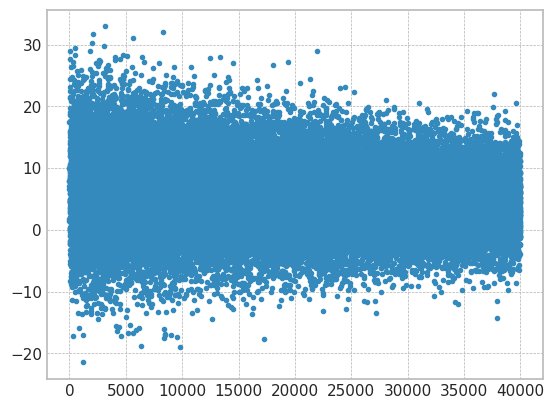

In [ ]:
import matplotlib.pyplot as plt

seed_everything()

y1_array = []
cor_const = cor[4]
for ii in range(x1.shape[0]):
    cor[4] = cor[4] - cor_const / x1.shape[0]
    e = np.random.normal(0.0, 2.0)
    y1_array.append(np.sum(cor * x1[ii])+e)

plt.plot(y1_array,'.')

In [ ]:
m = 5 #np.mean(y1_array[0:2000])
print(m)
y1 = [1 if y_ > m else 0 for y_ in y1_array]
print(sum(y1))

5
21325


In [ ]:
columns=['x0','x1','x2','x3','z0']
X1 = pd.DataFrame(x1,columns=columns)
mi_scores = make_mi_scores(X1, y1, discrete_features="auto")
print(mi_scores)

x0    0.227465
z0    0.088169
x1    0.018550
x3    0.008429
x2    0.006772
Name: MI Scores, dtype: float64


Bucket size 200 step_size 190


100%|██████████| 190/190 [00:02<00:00, 72.74it/s]


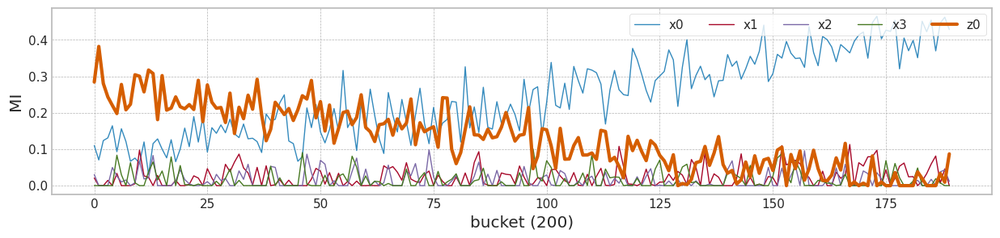

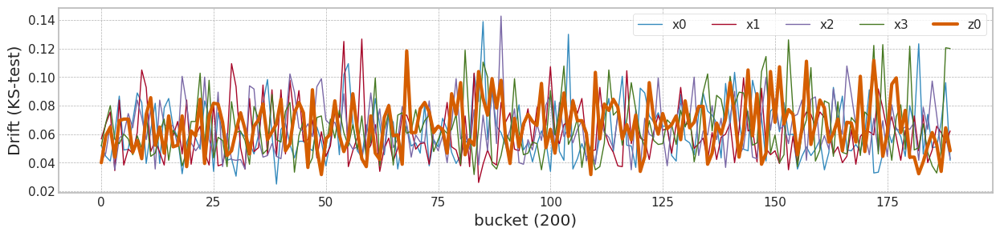

In [ ]:
from tqdm import tqdm

bucket_size_array=[200]#[10,50,100,200]

######################## Normalization ############################
from sklearn.preprocessing import MinMaxScaler, StandardScaler
scaler_c2 = MinMaxScaler()
# trainset을 가지고 Scaler를 fit하고, testset을 포함한 그 이후의 Data를 모두 transform 한다.
X1 = pd.DataFrame(np.concatenate((scaler_c2.fit_transform(X1[0:1800]), scaler_c2.transform(X1[1800:])),axis=0), columns=columns)

for bucket_size in bucket_size_array:
    #bucket_size = 10
    MIS = {}
    DRF = {}
    for col in columns:
        MIS[col] = []
        DRF[col] = []

    #step_size = int(x.shape[0]/bucket_size)
    step_size = int((x.shape[0]-2000)/bucket_size)
    print('Bucket size',bucket_size,'step_size',step_size)

    for bk in tqdm(range(step_size)):
        #print(bk,step_size)
        mi_scores = make_mi_scores(X1[bk*bucket_size:bk*bucket_size+bucket_size], y1[bk*bucket_size:bk*bucket_size+bucket_size], discrete_features="auto")
        ks = __ks_drift(X1[0:1800].values,X1[bk*bucket_size+2000:bk*bucket_size+bucket_size+2000].values)
        for ix,col in enumerate(columns):
            MIS[col].append(mi_scores[col])
            DRF[col].append(ks[:,0][ix])

    df_mis = pd.DataFrame(MIS)
    df_drf = pd.DataFrame(DRF)
    plt.figure(figsize=main_figsize)
    plt.plot(df_mis[['x0','x1','x2','x3']].values,linewidth=1,label=['x0','x1','x2','x3'])
    plt.plot(df_mis['z0'].values,linewidth=3,label='z0')
    plt.ylabel('MI')
    plt.xlabel(f'bucket ({bucket_size})')
    #df_mis.plot(figsize=(20,5),linewidth=1,ylabel='MI',xlabel=f'bucket ({bucket_size})',fontsize=15)
    plt.legend(loc=1,ncol=5)
    plt.show()

    plt.figure(figsize=main_figsize)
    plt.plot(df_drf[['x0','x1','x2','x3']].values,linewidth=1,label=['x0','x1','x2','x3'])
    plt.plot(df_drf['z0'].values,linewidth=3,label='z0')
    plt.ylabel('Drift (KS-test)')
    plt.xlabel(f'bucket ({bucket_size})')
    #df_mis.plot(figsize=(20,5),linewidth=1,ylabel='MI',xlabel=f'bucket ({bucket_size})',fontsize=15)
    plt.legend(loc=1,ncol=5)
    plt.show()

### 학습 및 전체 예측

cuda:0


100%|██████████| 1000/1000 [00:25<00:00, 39.41it/s]


MSE: 0.07
RMSE: 0.26


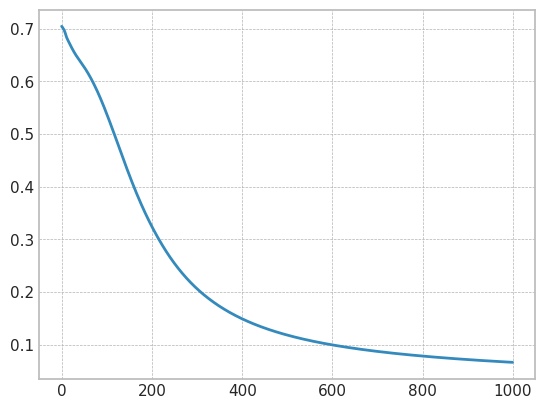

feature 5, test_f1 0.9867841409691629


In [ ]:
import copy
import torch.optim as optim

seed_everything()
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
print(device)
# Convert to 2D PyTorch tensors
X_train = torch.tensor(X1[0:1800][['x0','x1','x2','x3','z0']].values, dtype=torch.float32).to(device)
y_train = torch.tensor(y1[0:1800], dtype=torch.float32).reshape(-1, 1).to(device)

X_test = torch.tensor(X1[1800:2000][['x0','x1','x2','x3','z0']].values, dtype=torch.float32).to(device)
y_test = torch.tensor(y1[1800:2000], dtype=torch.float32).reshape(-1, 1).to(device)

# Define the model
model = nn.Sequential(
    nn.Linear(5, 20),
    nn.ReLU(),
    nn.Linear(20, 5),
    nn.ReLU(),
    nn.Linear(5, 1),
    nn.Sigmoid()
).to(device)

# loss function and optimizer
loss_fn = nn.BCELoss()  # mean square error
optimizer = optim.Adam(model.parameters(), lr=0.0001)

n_epochs = 1000   # number of epochs to run
batch_size = 100  # size of each batch
batch_start = torch.arange(0, len(X_train), batch_size)

# Hold the best model
best_mse = np.inf   # init to infinity
best_weights = None
history = []

for epoch in tqdm(range(n_epochs)):
    model.train()
    with tqdm(batch_start, unit="batch", mininterval=0, disable=True) as bar:
        bar.set_description(f"Epoch {epoch}")
        for start in bar:
            # take a batch
            X_batch = X_train[start:start+batch_size]
            y_batch = y_train[start:start+batch_size]
            # forward pass
            y_pred = model(X_batch)
            loss = loss_fn(y_pred, y_batch)
            # backward pass
            optimizer.zero_grad()
            loss.backward()
            # update weights
            optimizer.step()
            # print progress
            bar.set_postfix(mse=float(loss))
    # evaluate accuracy at end of each epoch
    model.eval()
    y_pred = model(X_test)
    mse = loss_fn(y_pred, y_test)
    mse = float(mse)
    history.append(mse)
    if mse < best_mse:
        best_mse = mse
        best_weights = copy.deepcopy(model.state_dict())

# restore model and return best accuracy
model.load_state_dict(best_weights)
print("MSE: %.2f" % best_mse)
print("RMSE: %.2f" % np.sqrt(best_mse))
plt.plot(history)
plt.show()

from sklearn.metrics import r2_score,precision_recall_fscore_support,f1_score
predicted_y = model(X_test)
f1 = f1_score(y_test.cpu().data.numpy(),(predicted_y.cpu().data.numpy()> 0.5).astype(float))
print('feature 5, test_f1',f1)

100%|██████████| 189/189 [00:00<00:00, 500.85it/s]


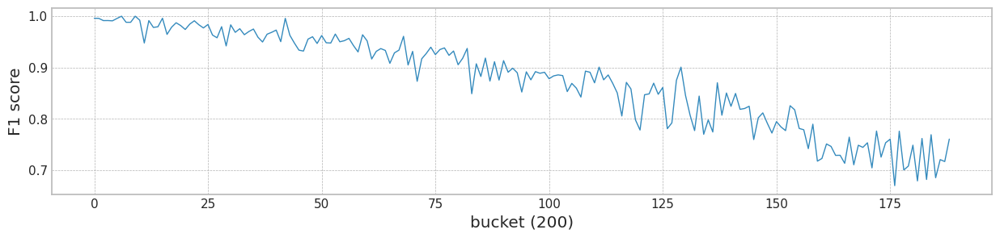

,lambda,test_f1,init_f1,mean_f1,last_f1,"MI(y^,z)"
0,Case #2 Feature 5,0.986784,0.996016,0.87628,0.760684,0.087066


In [ ]:
XT = X1[2000:][['x0','x1','x2','x3','z0']]
yT = y1[2000:]

bucket_size_array=[200]

for bucket_size in bucket_size_array:
    bucket_count = int(XT.shape[0]/bucket_size)-1
    f1s = []
    for bk in tqdm(range(bucket_count)):
        tmp_x = torch.tensor(XT[bk*bucket_size:bk*bucket_size+bucket_size].values, dtype=torch.float32).to(device)
        predicted_y = model(tmp_x)
        predicted_y = (predicted_y.cpu().data.numpy()> 0.5).astype(float)
        f1_ = f1_score(yT[bk*bucket_size:bk*bucket_size+bucket_size],predicted_y)
        f1s.append(f1_)
    plt.figure(figsize=main_figsize)
    plt.plot(f1s,linewidth=1)
    plt.ylabel('F1 score')
    plt.xlabel(f'bucket ({bucket_size})')
    #plt.title('Changes of F1 score according to bucket')
    plt.show()

result_table3 = {}
result_table3['lambda']=[]
result_table3['test_f1']=[]
result_table3['init_f1']=[]
result_table3['mean_f1']=[]
result_table3['last_f1']=[]
result_table3['MI(y^,z)']=[]

result_table3['lambda'].append('Case #2 Feature 5')
result_table3['test_f1'].append(f1)
result_table3['init_f1'].append(f1s[0])
result_table3['mean_f1'].append(np.mean(f1s))
result_table3['last_f1'].append(f1s[-1])
result_table3['MI(y^,z)'].append(mi_scores['z0'])

pd.DataFrame(result_table3)

In [ ]:
X1['b'] = [int(b) for b in X1.index.values]
X1

,x0,x1,x2,x3,z0,b
0,0.519751,0.468030,0.270011,0.516605,0.339159,0
1,0.605565,0.386136,0.467312,0.549700,0.666164,1
2,0.551222,0.433079,0.644682,0.704678,0.471856,2
3,0.335978,0.625620,0.283118,0.494381,0.609888,3
4,0.496805,0.524298,0.566753,0.426693,0.472373,4
...,...,...,...,...,...,...
39995,0.325122,0.364328,0.241452,0.576603,0.717378,39995
39996,0.350268,0.453351,0.284085,0.543373,0.701927,39996
39997,0.553850,0.305018,0.504892,0.544244,0.491374,39997
39998,0.426469,0.502344,0.239389,0.229965,0.775500,39998


cuda:0
[Lambda: -0.100000] [Epoch 0/4000] [a loss: 0.000000] [G loss: 0.707444]
[Lambda: -0.100000] [Epoch 200/4000] [a loss: 0.000000] [G loss: 0.684251]
[Lambda: -0.100000] [Epoch 400/4000] [a loss: 0.000000] [G loss: 0.660318]
[Lambda: -0.100000] [Epoch 600/4000] [a loss: 0.000000] [G loss: 0.642272]
[Lambda: -0.100000] [Epoch 800/4000] [a loss: 0.000000] [G loss: 0.626087]
[Lambda: -0.100000] [Epoch 1000/4000] [a loss: 0.000000] [G loss: 0.607096]
[Lambda: -0.100000] [Epoch 1200/4000] [a loss: 0.000000] [G loss: 0.584608]
[Lambda: -0.100000] [Epoch 1400/4000] [a loss: 0.000000] [G loss: 0.558883]
[Lambda: -0.100000] [Epoch 1600/4000] [a loss: 0.000000] [G loss: 0.530579]
[Lambda: -0.100000] [Epoch 1800/4000] [a loss: 0.000000] [G loss: 0.500473]
[Lambda: -0.100000] [Epoch 2000/4000] [a loss: 0.000000] [G loss: 0.469480]
[Lambda: -0.100000] [Epoch 2200/4000] [a loss: 0.000000] [G loss: 0.438538]
[Lambda: -0.100000] [Epoch 2400/4000] [a loss: 0.000000] [G loss: 0.408405]
[Lambda: -0.

100%|██████████| 189/189 [00:03<00:00, 59.54it/s]


mean of drift:
x0    0.061681
x1    0.060982
x2    0.064253
x3    0.064427
z0    0.065844
dtype: float64
Mean F1 for all data: 0.8586993294097212
cuda:0
[Lambda: 0.000000] [Epoch 0/4000] [a loss: 0.514395] [G loss: 0.705025]
[Lambda: 0.000000] [Epoch 200/4000] [a loss: 5.857027] [G loss: 0.662867]
[Lambda: 0.000000] [Epoch 400/4000] [a loss: 13.991311] [G loss: 0.548151]
[Lambda: 0.000000] [Epoch 600/4000] [a loss: 96.814278] [G loss: 0.255541]
[Lambda: 0.000000] [Epoch 800/4000] [a loss: 211.281494] [G loss: 0.133210]
[Lambda: 0.000000] [Epoch 1000/4000] [a loss: 321.871490] [G loss: 0.090425]
[Lambda: 0.000000] [Epoch 1200/4000] [a loss: 436.654510] [G loss: 0.068351]
[Lambda: 0.000000] [Epoch 1400/4000] [a loss: 563.570923] [G loss: 0.054164]
[Lambda: 0.000000] [Epoch 1600/4000] [a loss: 681.875854] [G loss: 0.044472]
[Lambda: 0.000000] [Epoch 1800/4000] [a loss: 777.553650] [G loss: 0.037624]
[Lambda: 0.000000] [Epoch 2000/4000] [a loss: 869.304688] [G loss: 0.032393]
[Lambda: 0.00

100%|██████████| 189/189 [00:03<00:00, 56.10it/s]


mean of drift:
x0    0.999365
x1    0.920535
x2    1.000000
x3    1.000000
z0    0.920485
dtype: float64
Mean F1 for all data: 0.8817739284682019
cuda:0
[Lambda: 0.100000] [Epoch 0/4000] [a loss: 0.514395] [G loss: 0.705025]
[Lambda: 0.100000] [Epoch 200/4000] [a loss: 0.011384] [G loss: 0.690234]
[Lambda: 0.100000] [Epoch 400/4000] [a loss: 0.035040] [G loss: 0.641614]
[Lambda: 0.100000] [Epoch 600/4000] [a loss: 0.117681] [G loss: 0.561368]
[Lambda: 0.100000] [Epoch 800/4000] [a loss: 0.159936] [G loss: 0.492162]
[Lambda: 0.100000] [Epoch 1000/4000] [a loss: 0.196795] [G loss: 0.424370]
[Lambda: 0.100000] [Epoch 1200/4000] [a loss: 0.218292] [G loss: 0.362948]
[Lambda: 0.100000] [Epoch 1400/4000] [a loss: 0.229340] [G loss: 0.309916]
[Lambda: 0.100000] [Epoch 1600/4000] [a loss: 0.228866] [G loss: 0.266835]
[Lambda: 0.100000] [Epoch 1800/4000] [a loss: 0.224606] [G loss: 0.231660]
[Lambda: 0.100000] [Epoch 2000/4000] [a loss: 0.217987] [G loss: 0.202603]
[Lambda: 0.100000] [Epoch 220

100%|██████████| 189/189 [00:03<00:00, 58.78it/s]


mean of drift:
x0    0.924994
x1    0.928028
x2    0.737378
x3    0.745591
z0    0.822778
dtype: float64
Mean F1 for all data: 0.19542648267694734
cuda:0
[Lambda: 0.200000] [Epoch 0/4000] [a loss: 0.514395] [G loss: 0.705025]
[Lambda: 0.200000] [Epoch 200/4000] [a loss: 0.004540] [G loss: 0.693101]
[Lambda: 0.200000] [Epoch 400/4000] [a loss: 0.010364] [G loss: 0.652940]
[Lambda: 0.200000] [Epoch 600/4000] [a loss: 0.039158] [G loss: 0.590960]
[Lambda: 0.200000] [Epoch 800/4000] [a loss: 0.058595] [G loss: 0.533178]
[Lambda: 0.200000] [Epoch 1000/4000] [a loss: 0.070649] [G loss: 0.472742]
[Lambda: 0.200000] [Epoch 1200/4000] [a loss: 0.083889] [G loss: 0.412104]
[Lambda: 0.200000] [Epoch 1400/4000] [a loss: 0.092333] [G loss: 0.355145]
[Lambda: 0.200000] [Epoch 1600/4000] [a loss: 0.096057] [G loss: 0.307015]
[Lambda: 0.200000] [Epoch 1800/4000] [a loss: 0.096697] [G loss: 0.267641]
[Lambda: 0.200000] [Epoch 2000/4000] [a loss: 0.097148] [G loss: 0.234710]
[Lambda: 0.200000] [Epoch 22

100%|██████████| 189/189 [00:03<00:00, 54.74it/s]


mean of drift:
x0    0.962857
x1    0.762116
x2    0.587554
x3    0.359647
z0    0.621799
dtype: float64
Mean F1 for all data: 0.1145607231781211
cuda:0
[Lambda: 0.300000] [Epoch 0/4000] [a loss: 0.514395] [G loss: 0.705025]
[Lambda: 0.300000] [Epoch 200/4000] [a loss: 0.003530] [G loss: 0.694047]
[Lambda: 0.300000] [Epoch 400/4000] [a loss: 0.004377] [G loss: 0.658998]
[Lambda: 0.300000] [Epoch 600/4000] [a loss: 0.017240] [G loss: 0.611155]
[Lambda: 0.300000] [Epoch 800/4000] [a loss: 0.029600] [G loss: 0.558427]
[Lambda: 0.300000] [Epoch 1000/4000] [a loss: 0.034290] [G loss: 0.515848]
[Lambda: 0.300000] [Epoch 1200/4000] [a loss: 0.038046] [G loss: 0.476386]
[Lambda: 0.300000] [Epoch 1400/4000] [a loss: 0.041888] [G loss: 0.437069]
[Lambda: 0.300000] [Epoch 1600/4000] [a loss: 0.045398] [G loss: 0.397610]
[Lambda: 0.300000] [Epoch 1800/4000] [a loss: 0.048461] [G loss: 0.359174]
[Lambda: 0.300000] [Epoch 2000/4000] [a loss: 0.050811] [G loss: 0.323352]
[Lambda: 0.300000] [Epoch 220

100%|██████████| 189/189 [00:03<00:00, 54.75it/s]


mean of drift:
x0    0.949918
x1    0.640050
x2    0.340944
x3    0.084283
z0    0.518677
dtype: float64
Mean F1 for all data: 0.13256599693470641
cuda:0
[Lambda: 0.400000] [Epoch 0/4000] [a loss: 0.514395] [G loss: 0.705025]
[Lambda: 0.400000] [Epoch 200/4000] [a loss: 0.003251] [G loss: 0.694483]
[Lambda: 0.400000] [Epoch 400/4000] [a loss: 0.002200] [G loss: 0.662695]
[Lambda: 0.400000] [Epoch 600/4000] [a loss: 0.007953] [G loss: 0.625467]
[Lambda: 0.400000] [Epoch 800/4000] [a loss: 0.015770] [G loss: 0.582398]
[Lambda: 0.400000] [Epoch 1000/4000] [a loss: 0.020562] [G loss: 0.536279]
[Lambda: 0.400000] [Epoch 1200/4000] [a loss: 0.022960] [G loss: 0.496396]
[Lambda: 0.400000] [Epoch 1400/4000] [a loss: 0.025043] [G loss: 0.458340]
[Lambda: 0.400000] [Epoch 1600/4000] [a loss: 0.027417] [G loss: 0.419889]
[Lambda: 0.400000] [Epoch 1800/4000] [a loss: 0.029464] [G loss: 0.381874]
[Lambda: 0.400000] [Epoch 2000/4000] [a loss: 0.030660] [G loss: 0.346415]
[Lambda: 0.400000] [Epoch 22

100%|██████████| 189/189 [00:03<00:00, 55.51it/s]


mean of drift:
x0    0.948016
x1    0.548466
x2    0.247563
x3    0.079683
z0    0.587701
dtype: float64
Mean F1 for all data: 0.12659367252605538
cuda:0
[Lambda: 0.500000] [Epoch 0/4000] [a loss: 0.514395] [G loss: 0.705025]
[Lambda: 0.500000] [Epoch 200/4000] [a loss: 0.003189] [G loss: 0.694711]
[Lambda: 0.500000] [Epoch 400/4000] [a loss: 0.001308] [G loss: 0.665019]
[Lambda: 0.500000] [Epoch 600/4000] [a loss: 0.003822] [G loss: 0.634414]
[Lambda: 0.500000] [Epoch 800/4000] [a loss: 0.007991] [G loss: 0.600443]
[Lambda: 0.500000] [Epoch 1000/4000] [a loss: 0.011912] [G loss: 0.560192]
[Lambda: 0.500000] [Epoch 1200/4000] [a loss: 0.014134] [G loss: 0.520361]
[Lambda: 0.500000] [Epoch 1400/4000] [a loss: 0.015857] [G loss: 0.483008]
[Lambda: 0.500000] [Epoch 1600/4000] [a loss: 0.017521] [G loss: 0.445647]
[Lambda: 0.500000] [Epoch 1800/4000] [a loss: 0.018917] [G loss: 0.408595]
[Lambda: 0.500000] [Epoch 2000/4000] [a loss: 0.019986] [G loss: 0.372911]
[Lambda: 0.500000] [Epoch 22

100%|██████████| 189/189 [00:03<00:00, 58.69it/s]


mean of drift:
x0    0.927102
x1    0.319703
x2    0.101126
x3    0.079780
z0    0.619700
dtype: float64
Mean F1 for all data: 0.14536132337447594
cuda:0
[Lambda: 0.600000] [Epoch 0/4000] [a loss: 0.514395] [G loss: 0.705025]
[Lambda: 0.600000] [Epoch 200/4000] [a loss: 0.003181] [G loss: 0.694888]
[Lambda: 0.600000] [Epoch 400/4000] [a loss: 0.000914] [G loss: 0.666632]
[Lambda: 0.600000] [Epoch 600/4000] [a loss: 0.001807] [G loss: 0.640820]
[Lambda: 0.600000] [Epoch 800/4000] [a loss: 0.003934] [G loss: 0.613525]
[Lambda: 0.600000] [Epoch 1000/4000] [a loss: 0.006275] [G loss: 0.580042]
[Lambda: 0.600000] [Epoch 1200/4000] [a loss: 0.007989] [G loss: 0.545409]
[Lambda: 0.600000] [Epoch 1400/4000] [a loss: 0.009340] [G loss: 0.505555]
[Lambda: 0.600000] [Epoch 1600/4000] [a loss: 0.010374] [G loss: 0.467583]
[Lambda: 0.600000] [Epoch 1800/4000] [a loss: 0.011358] [G loss: 0.430729]
[Lambda: 0.600000] [Epoch 2000/4000] [a loss: 0.012202] [G loss: 0.394842]
[Lambda: 0.600000] [Epoch 22

100%|██████████| 189/189 [00:03<00:00, 57.74it/s]


mean of drift:
x0    0.909053
x1    0.193207
x2    0.091396
x3    0.081382
z0    0.554753
dtype: float64
Mean F1 for all data: 0.16537619982215176
cuda:0
[Lambda: 0.700000] [Epoch 0/4000] [a loss: 0.514395] [G loss: 0.705025]
[Lambda: 0.700000] [Epoch 200/4000] [a loss: 0.003189] [G loss: 0.695004]
[Lambda: 0.700000] [Epoch 400/4000] [a loss: 0.000734] [G loss: 0.667911]
[Lambda: 0.700000] [Epoch 600/4000] [a loss: 0.000766] [G loss: 0.645910]
[Lambda: 0.700000] [Epoch 800/4000] [a loss: 0.001703] [G loss: 0.624467]
[Lambda: 0.700000] [Epoch 1000/4000] [a loss: 0.002968] [G loss: 0.596010]
[Lambda: 0.700000] [Epoch 1200/4000] [a loss: 0.004117] [G loss: 0.563391]
[Lambda: 0.700000] [Epoch 1400/4000] [a loss: 0.005021] [G loss: 0.529464]
[Lambda: 0.700000] [Epoch 1600/4000] [a loss: 0.005712] [G loss: 0.495018]
[Lambda: 0.700000] [Epoch 1800/4000] [a loss: 0.006344] [G loss: 0.460029]
[Lambda: 0.700000] [Epoch 2000/4000] [a loss: 0.006914] [G loss: 0.425084]
[Lambda: 0.700000] [Epoch 22

100%|██████████| 189/189 [00:03<00:00, 55.56it/s]


mean of drift:
x0    0.895888
x1    0.110362
x2    0.075994
x3    0.080323
z0    0.394888
dtype: float64
Mean F1 for all data: 0.1770140130167101
cuda:0
[Lambda: 0.800000] [Epoch 0/4000] [a loss: 0.514395] [G loss: 0.705025]
[Lambda: 0.800000] [Epoch 200/4000] [a loss: 0.003204] [G loss: 0.695087]
[Lambda: 0.800000] [Epoch 400/4000] [a loss: 0.000664] [G loss: 0.668896]
[Lambda: 0.800000] [Epoch 600/4000] [a loss: 0.000301] [G loss: 0.649690]
[Lambda: 0.800000] [Epoch 800/4000] [a loss: 0.000611] [G loss: 0.633161]
[Lambda: 0.800000] [Epoch 1000/4000] [a loss: 0.001082] [G loss: 0.611147]
[Lambda: 0.800000] [Epoch 1200/4000] [a loss: 0.001631] [G loss: 0.582851]
[Lambda: 0.800000] [Epoch 1400/4000] [a loss: 0.002183] [G loss: 0.550768]
[Lambda: 0.800000] [Epoch 1600/4000] [a loss: 0.002642] [G loss: 0.517253]
[Lambda: 0.800000] [Epoch 1800/4000] [a loss: 0.002987] [G loss: 0.483464]
[Lambda: 0.800000] [Epoch 2000/4000] [a loss: 0.003316] [G loss: 0.449418]
[Lambda: 0.800000] [Epoch 220

100%|██████████| 189/189 [00:03<00:00, 58.38it/s]


mean of drift:
x0    0.384665
x1    0.083504
x2    0.081220
x3    0.079659
z0    0.359153
dtype: float64
Mean F1 for all data: 0.8988803567829007
cuda:0
[Lambda: 0.900000] [Epoch 0/4000] [a loss: 0.514395] [G loss: 0.705025]
[Lambda: 0.900000] [Epoch 200/4000] [a loss: 0.003219] [G loss: 0.695158]
[Lambda: 0.900000] [Epoch 400/4000] [a loss: 0.000650] [G loss: 0.669728]
[Lambda: 0.900000] [Epoch 600/4000] [a loss: 0.000121] [G loss: 0.652548]
[Lambda: 0.900000] [Epoch 800/4000] [a loss: 0.000139] [G loss: 0.640192]
[Lambda: 0.900000] [Epoch 1000/4000] [a loss: 0.000233] [G loss: 0.623807]
[Lambda: 0.900000] [Epoch 1200/4000] [a loss: 0.000363] [G loss: 0.601941]
[Lambda: 0.900000] [Epoch 1400/4000] [a loss: 0.000515] [G loss: 0.575462]
[Lambda: 0.900000] [Epoch 1600/4000] [a loss: 0.000681] [G loss: 0.545505]
[Lambda: 0.900000] [Epoch 1800/4000] [a loss: 0.000853] [G loss: 0.513246]
[Lambda: 0.900000] [Epoch 2000/4000] [a loss: 0.000991] [G loss: 0.480541]
[Lambda: 0.900000] [Epoch 220

100%|██████████| 189/189 [00:03<00:00, 56.30it/s]


mean of drift:
x0    0.228166
x1    0.104065
x2    0.104982
x3    0.078674
z0    0.151687
dtype: float64
Mean F1 for all data: 0.9154821941512099


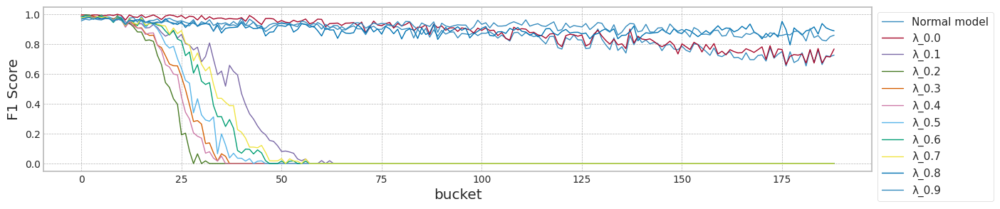

                   lambda   test_f1   init_f1   mean_f1   last_f1  MI(y^,z)
0   Case #1, Normal model  0.961702  0.984127  0.858699  0.726496  0.327060
1                     0.0  0.991150  0.996016  0.881774  0.767773  0.313484
2                     0.1  0.986784  0.987952  0.195426  0.000000  0.303948
3                     0.2  0.978166  0.987952  0.114561  0.000000  0.297797
4                     0.3  0.978355  0.992000  0.132566  0.000000  0.330123
5                     0.4  0.969957  0.987952  0.126594  0.000000  0.343429
6                     0.5  0.961702  0.984000  0.145361  0.000000  0.326908
7                     0.6  0.961702  0.980080  0.165376  0.000000  0.331575
8                     0.7  0.961702  0.976000  0.177014  0.000000  0.331575
9                     0.8  0.961702  0.968254  0.898880  0.888889  0.331575
10                    0.9  0.961702  0.956522  0.915482  0.859813  0.331575
max_mean_lambda= 0.9


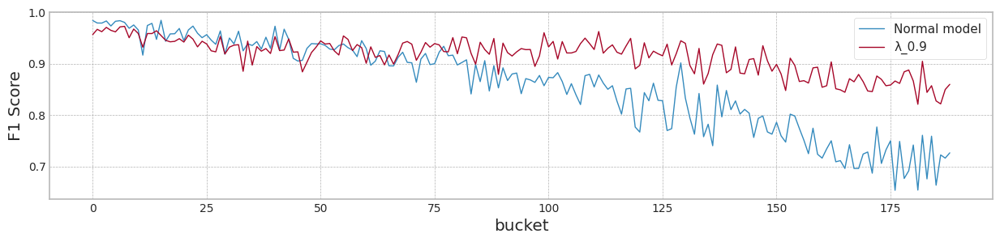

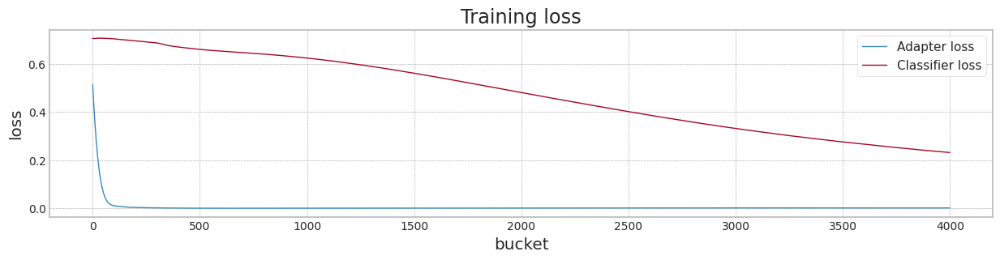

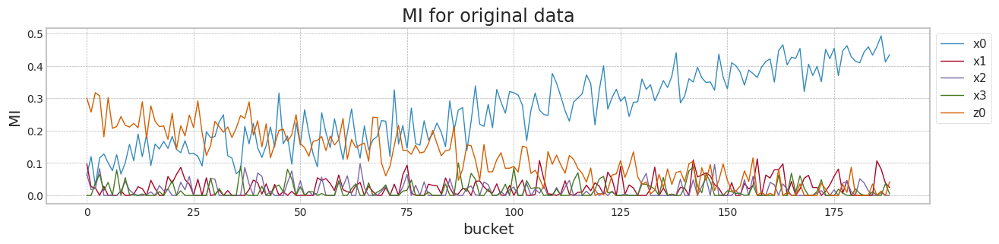

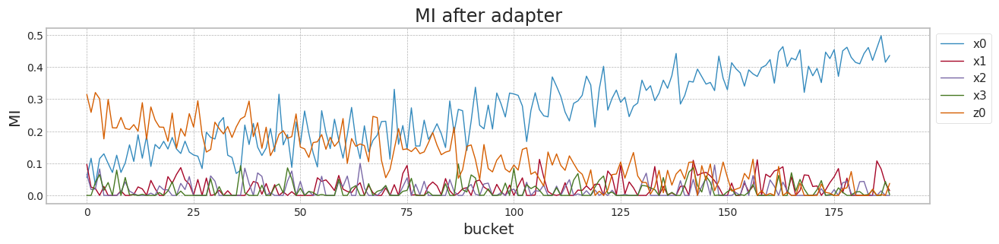

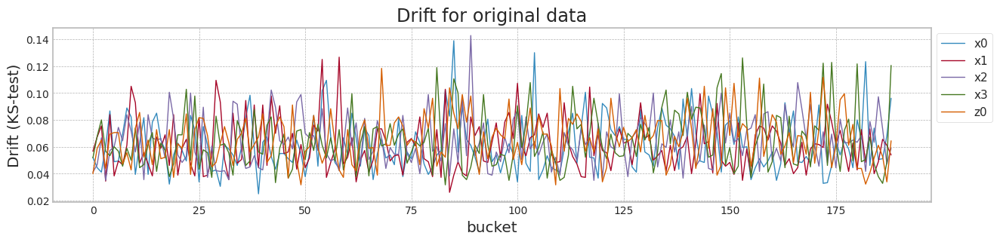

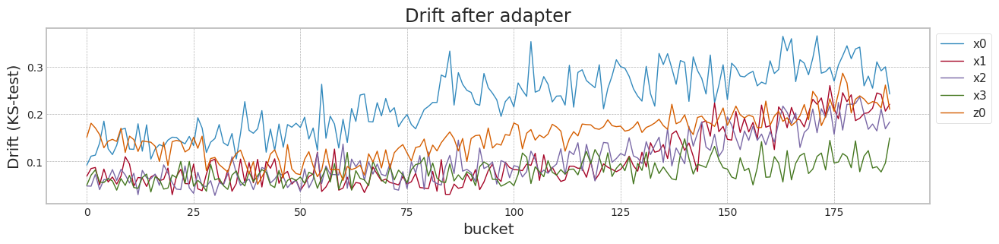

In [ ]:
seed_everything()

train_result = []

avaible_range = 40000

train_tensors = Namespace(XS_train = torch.tensor(X1[0:1800][['x0','x1','x2','x3','z0']].values, dtype=torch.float32),
                          y_train = torch.tensor(y1[0:1800], dtype=torch.float32),
                          s1_train = torch.tensor(X1[0:1800][['z0']].values, dtype=torch.float32))
test_tensors = Namespace(XS_test = torch.tensor(X1[1800:2000][['x0','x1','x2','x3','z0']].values, dtype=torch.float32),
                         y_test = torch.tensor(y1[1800:2000], dtype=torch.float32),
                         s1_test = torch.tensor(X1[1800:2000][['z0']].values, dtype=torch.float32))

train_tensors1 = Namespace(XS_train = torch.tensor(X1[0:1800][['x0','x1','x2','x3','z0','b']].values, dtype=torch.float32),
                          y_train = torch.tensor(y1[0:1800], dtype=torch.float32),
                          s1_train = torch.tensor(X1[0:1800][['z0']].values, dtype=torch.float32))
test_tensors1 = Namespace(XS_test = torch.tensor(X1[1800:2000][['x0','x1','x2','x3','z0','b']].values, dtype=torch.float32),
                         y_test = torch.tensor(y1[1800:2000], dtype=torch.float32),
                         s1_test = torch.tensor(X1[1800:2000][['z0']].values, dtype=torch.float32))

train_opt = Namespace(val=0, n_epochs=4000, k=5, lr_g=0.0001, lr_f=0.001, lr_r=0.001)
seed = 1

lambda_f_set = [-0.1, 0.0,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9]
#lambda_f_set = [0.4,0.5]
#lambda_r = 0.4 # Lambda value for the robustness discriminator of FR-Train.



#lambda_f_set2 = [0.0000089,0.0000090,0.0000091]
lambda_f_set2 = [2.0]
lambda_a2 = 0.0

for lambda_f2 in lambda_f_set2:
    #lambda_a2 = lambda_f2

    result_table = {}
    result_table2 = {}
    result_table2['lambda']=[]
    result_table2['test_f1']=[]
    result_table2['init_f1']=[]
    result_table2['mean_f1']=[]
    result_table2['last_f1']=[]
    result_table2['MI(y^,z)']=[]
    infos = {}
    for lambda_f in lambda_f_set:
        '''
        if lambda_f == 0.0:
            f1,mi,last_generator= train_model(train_tensors, test_tensors, train_opt, lambda_f = lambda_f, seed = seed)
            result_table[f'lambda_{lambda_f}'] = test_all_data(last_generator)
        else:
        '''
        f1,mi,last_generator, last_adapter, df_loss = train_model(train_tensors1, test_tensors1, train_opt, lambda_f = lambda_f, seed = seed, alpha= lambda_f2 )# 0.00057)
        tad,df_mis,df_drf  = test_all_data(last_generator,last_adapter,X1[0:1800][['x0','x1','x2','x3','z0']],X1[2000:][['x0','x1','x2','x3','z0','b']],y1[2000:])

        if lambda_f < 0.0:
            result_table2['lambda'].append("Case #1, Normal model")
            result_table['Normal model'] = tad
        else:
            result_table2['lambda'].append(lambda_f)
            result_table[f'λ_{lambda_f}'] = tad

        infos[f'λ_{lambda_f}'] = (df_loss,df_mis,df_drf)
        result_table2['test_f1'].append(f1)
        result_table2['init_f1'].append(tad[0])
        result_table2['mean_f1'].append(np.mean(tad))
        result_table2['last_f1'].append(tad[-1])
        result_table2['MI(y^,z)'].append(mi)

    result_df = pd.DataFrame(result_table)
    result_df.plot(figsize=main_figsize,linewidth=1,ylabel='F1 Score',xlabel='bucket',fontsize=10)
    plt.legend(bbox_to_anchor=(1.0, 1.0))
    plt.show()

    result4_df = pd.DataFrame(result_table2)

    print(result4_df)

    max_mean_lambda = result4_df[result4_df['mean_f1']==np.max(result4_df['mean_f1'])]['lambda']

    print('max_mean_lambda=',max_mean_lambda.values[0])

    result_df[['Normal model',f'λ_{max_mean_lambda.values[0]}']].plot(figsize=main_figsize,linewidth=1,ylabel='F1 Score',xlabel='bucket',fontsize=10)
    plt.legend(bbox_to_anchor=(1.0, 1.0))
    plt.show()

    og_loss,og_mis,og_drf = infos['λ_-0.1']
    df_loss,df_mis,df_drf = infos[f'λ_{max_mean_lambda.values[0]}']

    df_loss.astype(np.float32).plot(figsize=main_figsize,linewidth=1,ylabel='loss',xlabel='bucket',title='Training loss',fontsize=10)
    plt.legend(bbox_to_anchor=(1.0, 1.0))
    plt.show()

    og_mis.astype(np.float32).plot(figsize=main_figsize,linewidth=1,ylabel='MI',xlabel='bucket',title='MI for original data',fontsize=10)
    plt.legend(bbox_to_anchor=(1.0, 1.0))
    plt.show()

    df_mis.astype(np.float32).plot(figsize=main_figsize,linewidth=1,ylabel='MI',xlabel='bucket',title='MI after adapter',fontsize=10)
    plt.legend(bbox_to_anchor=(1.0, 1.0))
    plt.show()

    og_drf.astype(np.float32).plot(figsize=main_figsize,linewidth=1,ylabel='Drift (KS-test)',xlabel='bucket',title='Drift for original data',fontsize=10)
    plt.legend(bbox_to_anchor=(1.0, 1.0))
    plt.show()

    df_drf.astype(np.float32).plot(figsize=main_figsize,linewidth=1,ylabel='Drift (KS-test)',xlabel='bucket',title='Drift after adapter',fontsize=10)
    plt.legend(bbox_to_anchor=(1.0, 1.0))
    plt.show()

## synthetic data의 생성 (Case #3 MI의 증감(상대적), Drift의 증가)

+ 5개의 feature
+ 각각 importance를 부여
+ 그 중, 1개의 feature는 가변 data drift, MI는 고정

### data 생성

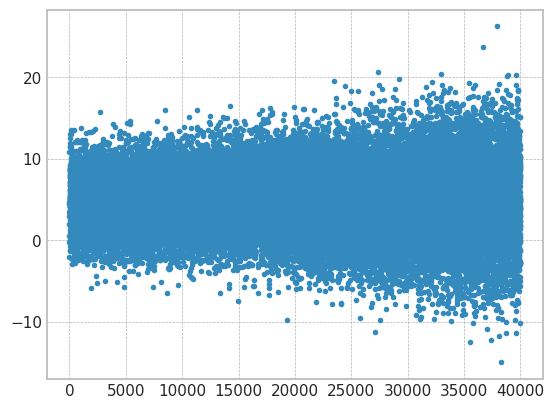

In [52]:
import matplotlib.pyplot as plt

seed_everything(2)

data_size = 40000
cor = np.asarray([1.5, 1.2, 0.9 , 0.7, 0.5])

x2 = np.zeros((data_size,5))
for ix,cor_ in enumerate(cor):
    x2[:,ix] = np.random.normal(1,cor_,data_size)

y2_array = []
cor_const = 3/x2.shape[0]
for ii in range(x2.shape[0]):
    e = np.random.normal(0.0, 3*cor_const * ii)
    e1 = 0.0 #np.random.normal(0.0, cor_const * ii)
    x2[ii,4] = x2[ii,4] + e
    y2_array.append(np.sum(cor * x2[ii])+e1)

plt.plot(y2_array,'.')

In [53]:
m = 5 #np.mean(y2_array)
print(m)
y2 = [1 if y_ > m else 0 for y_ in y2_array]
sum(y2)

5


18973

In [54]:
columns=['x0','x1','x2','x3','z0']
X2 = pd.DataFrame(x2,columns=columns)
mi_scores = make_mi_scores(X2, y2, discrete_features="auto")
print(mi_scores)

z0    0.143465
x0    0.139701
x1    0.050595
x2    0.017249
x3    0.000037
Name: MI Scores, dtype: float64


Bucket size 200 step_size 190


100%|██████████| 200/200 [00:02<00:00, 69.49it/s]


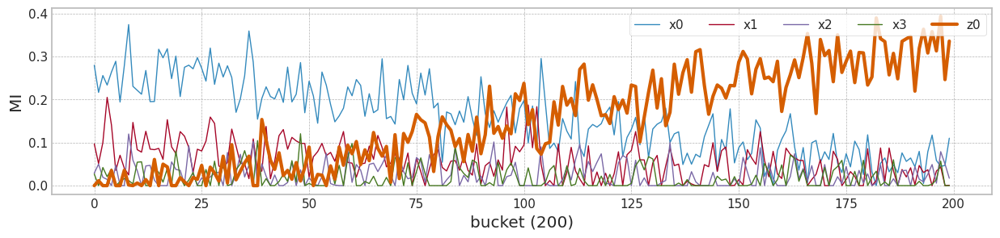

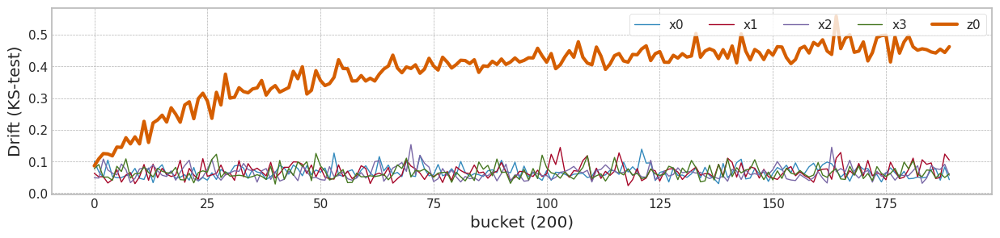

In [55]:
from tqdm import tqdm

bucket_size_array=[200]#[10,50,100,200]

######################## Normalization ############################
from sklearn.preprocessing import MinMaxScaler, StandardScaler
scaler_c3 = StandardScaler()
# trainset을 가지고 Scaler를 fit하고, testset을 포함한 그 이후의 Data를 모두 transform 한다.
X2 = pd.DataFrame(np.concatenate((scaler_c3.fit_transform(X2[0:1800]), scaler_c3.transform(X2[1800:])),axis=0), columns=columns)

for bucket_size in bucket_size_array:
    #bucket_size = 10

    MIS = {}
    DRF = {}
    for col in columns:
        MIS[col] = []
        DRF[col] = []

    #step_size = int(x.shape[0]/bucket_size)
    step_size = int((X2.shape[0]-2000)/bucket_size)
    print('Bucket size',bucket_size,'step_size',step_size)
    for bk in tqdm(range(bucket_size)):
        #print(bk,step_size)
        mi_scores = make_mi_scores(X2[bk*bucket_size:bk*bucket_size+bucket_size], y2[bk*bucket_size:bk*bucket_size+bucket_size], discrete_features="auto")
        ks = __ks_drift(X2[0:1800].values,X2[bk*bucket_size+2000:bk*bucket_size+bucket_size+2000].values)
        for ix,col in enumerate(columns):
            MIS[col].append(mi_scores[col])
            DRF[col].append(ks[:,0][ix])

    df_mis = pd.DataFrame(MIS)
    df_drf = pd.DataFrame(DRF)

    '''
    df_mis['x0'].plot(figsize=main_figsize,linewidth=1,ylabel='MI',xlabel=f'bucket ({bucket_size})',fontsize=10)
    plt.show()
    df_mis['x1'].plot(figsize=main_figsize,linewidth=1,ylabel='MI',xlabel=f'bucket ({bucket_size})',fontsize=10)
    plt.show()
    df_mis['x2'].plot(figsize=main_figsize,linewidth=1,ylabel='MI',xlabel=f'bucket ({bucket_size})',fontsize=10)
    plt.show()
    df_mis['x3'].plot(figsize=main_figsize,linewidth=1,ylabel='MI',xlabel=f'bucket ({bucket_size})',fontsize=10)
    plt.show()
    df_mis['z0'].plot(figsize=main_figsize,linewidth=1,ylabel='MI',xlabel=f'bucket ({bucket_size})',fontsize=10)
    plt.show()
    '''
    plt.figure(figsize=main_figsize)
    plt.plot(df_mis[['x0','x1','x2','x3']].values,linewidth=1,label=['x0','x1','x2','x3'])
    plt.plot(df_mis['z0'].values,linewidth=3,label='z0')
    plt.ylabel('MI')
    plt.xlabel(f'bucket ({bucket_size})')
    #df_mis.plot(figsize=(20,5),linewidth=1,ylabel='MI',xlabel=f'bucket ({bucket_size})',fontsize=15)
    plt.legend(loc=1,ncol=5)
    plt.show()

    plt.figure(figsize=main_figsize)
    plt.plot(df_drf[['x0','x1','x2','x3']].values,linewidth=1,label=['x0','x1','x2','x3'])
    plt.plot(df_drf['z0'].values,linewidth=3,label='z0')
    plt.ylabel('Drift (KS-test)')
    plt.xlabel(f'bucket ({bucket_size})')
    #df_mis.plot(figsize=(20,5),linewidth=1,ylabel='MI',xlabel=f'bucket ({bucket_size})',fontsize=15)
    plt.legend(loc=1,ncol=5)
    plt.show()

### 학습 및 전체 예측

#### concept drift tolerant 학습

In [56]:
X2['b'] = [int(b) for b in X2.index.values]
X2

,x0,x1,x2,x3,z0,b
0,-0.388385,-2.251269,-0.673942,1.496245,-1.450203,0
1,-0.025065,0.330263,-0.203517,-0.192385,-0.784438,1
2,-2.121314,-0.426696,-0.814303,-1.114826,-1.333204,2
3,1.684784,1.138380,0.854071,-0.446355,0.756200,3
4,-1.775864,0.000987,-0.954858,0.149036,-1.188294,4
...,...,...,...,...,...,...
39995,-0.911572,0.613570,-0.753471,0.358113,6.019574,39995
39996,-0.469348,1.145348,-0.422127,-0.976095,-9.484264,39996
39997,-0.546602,0.140305,-2.237145,-0.398031,19.983367,39997
39998,-0.406628,0.766944,2.127510,0.931603,-20.577919,39998


cuda:0
[Lambda: -0.100000] [Epoch 0/4000] [a loss: 0.000000] [G loss: 0.696688]
[Lambda: -0.100000] [Epoch 200/4000] [a loss: 0.000000] [G loss: 0.671295]
[Lambda: -0.100000] [Epoch 400/4000] [a loss: 0.000000] [G loss: 0.619600]
[Lambda: -0.100000] [Epoch 600/4000] [a loss: 0.000000] [G loss: 0.552930]
[Lambda: -0.100000] [Epoch 800/4000] [a loss: 0.000000] [G loss: 0.480211]
[Lambda: -0.100000] [Epoch 1000/4000] [a loss: 0.000000] [G loss: 0.408787]
[Lambda: -0.100000] [Epoch 1200/4000] [a loss: 0.000000] [G loss: 0.344441]
[Lambda: -0.100000] [Epoch 1400/4000] [a loss: 0.000000] [G loss: 0.289852]
[Lambda: -0.100000] [Epoch 1600/4000] [a loss: 0.000000] [G loss: 0.245261]
[Lambda: -0.100000] [Epoch 1800/4000] [a loss: 0.000000] [G loss: 0.209118]
[Lambda: -0.100000] [Epoch 2000/4000] [a loss: 0.000000] [G loss: 0.179695]
[Lambda: -0.100000] [Epoch 2200/4000] [a loss: 0.000000] [G loss: 0.155740]
[Lambda: -0.100000] [Epoch 2400/4000] [a loss: 0.000000] [G loss: 0.136380]
[Lambda: -0.

100%|██████████| 189/189 [00:03<00:00, 57.24it/s]


mean of drift:
x0    0.066817
x1    0.067307
x2    0.063521
x3    0.065220
z0    0.385173
dtype: float64
Mean F1 for all data: 0.9316475726662383
cuda:0
[Lambda: 0.000000] [Epoch 0/4000] [a loss: 1.262027] [G loss: 0.690319]
[Lambda: 0.000000] [Epoch 200/4000] [a loss: 20.177235] [G loss: 0.428852]
[Lambda: 0.000000] [Epoch 400/4000] [a loss: 134.635361] [G loss: 0.153021]
[Lambda: 0.000000] [Epoch 600/4000] [a loss: 277.594788] [G loss: 0.081277]
[Lambda: 0.000000] [Epoch 800/4000] [a loss: 403.468567] [G loss: 0.053956]
[Lambda: 0.000000] [Epoch 1000/4000] [a loss: 523.818909] [G loss: 0.039549]
[Lambda: 0.000000] [Epoch 1200/4000] [a loss: 656.680054] [G loss: 0.030398]
[Lambda: 0.000000] [Epoch 1400/4000] [a loss: 794.620789] [G loss: 0.024022]
[Lambda: 0.000000] [Epoch 1600/4000] [a loss: 948.591919] [G loss: 0.019037]
[Lambda: 0.000000] [Epoch 1800/4000] [a loss: 1117.273560] [G loss: 0.015106]
[Lambda: 0.000000] [Epoch 2000/4000] [a loss: 1292.190063] [G loss: 0.012028]
[Lambda:

100%|██████████| 189/189 [00:03<00:00, 55.09it/s]


mean of drift:
x0    0.585623
x1    0.728016
x2    0.682945
x3    0.983233
z0    0.865750
dtype: float64
Mean F1 for all data: 0.9214484925840488
cuda:0
[Lambda: 0.100000] [Epoch 0/4000] [a loss: 1.262027] [G loss: 0.690319]
[Lambda: 0.100000] [Epoch 200/4000] [a loss: 0.005169] [G loss: 0.664366]
[Lambda: 0.100000] [Epoch 400/4000] [a loss: 0.020529] [G loss: 0.590151]
[Lambda: 0.100000] [Epoch 600/4000] [a loss: 0.040369] [G loss: 0.498503]
[Lambda: 0.100000] [Epoch 800/4000] [a loss: 0.052983] [G loss: 0.410344]
[Lambda: 0.100000] [Epoch 1000/4000] [a loss: 0.056793] [G loss: 0.335969]
[Lambda: 0.100000] [Epoch 1200/4000] [a loss: 0.054300] [G loss: 0.277606]
[Lambda: 0.100000] [Epoch 1400/4000] [a loss: 0.049191] [G loss: 0.232393]
[Lambda: 0.100000] [Epoch 1600/4000] [a loss: 0.043402] [G loss: 0.197133]
[Lambda: 0.100000] [Epoch 1800/4000] [a loss: 0.037563] [G loss: 0.169327]
[Lambda: 0.100000] [Epoch 2000/4000] [a loss: 0.032780] [G loss: 0.146732]
[Lambda: 0.100000] [Epoch 220

100%|██████████| 189/189 [00:03<00:00, 54.60it/s]


mean of drift:
x0    0.351434
x1    0.350776
x2    0.223392
x3    0.108280
z0    0.383633
dtype: float64
Mean F1 for all data: 0.7359722367316227
cuda:0
[Lambda: 0.200000] [Epoch 0/4000] [a loss: 1.262027] [G loss: 0.690319]
[Lambda: 0.200000] [Epoch 200/4000] [a loss: 0.002424] [G loss: 0.666359]
[Lambda: 0.200000] [Epoch 400/4000] [a loss: 0.004265] [G loss: 0.602252]
[Lambda: 0.200000] [Epoch 600/4000] [a loss: 0.009111] [G loss: 0.521045]
[Lambda: 0.200000] [Epoch 800/4000] [a loss: 0.013085] [G loss: 0.437469]
[Lambda: 0.200000] [Epoch 1000/4000] [a loss: 0.015067] [G loss: 0.361932]
[Lambda: 0.200000] [Epoch 1200/4000] [a loss: 0.015258] [G loss: 0.299323]
[Lambda: 0.200000] [Epoch 1400/4000] [a loss: 0.014153] [G loss: 0.249825]
[Lambda: 0.200000] [Epoch 1600/4000] [a loss: 0.012615] [G loss: 0.210928]
[Lambda: 0.200000] [Epoch 1800/4000] [a loss: 0.011078] [G loss: 0.180197]
[Lambda: 0.200000] [Epoch 2000/4000] [a loss: 0.009752] [G loss: 0.155490]
[Lambda: 0.200000] [Epoch 220

100%|██████████| 189/189 [00:03<00:00, 56.79it/s]


mean of drift:
x0    0.124359
x1    0.227557
x2    0.209591
x3    0.073874
z0    0.382416
dtype: float64
Mean F1 for all data: 0.8517157164763294
cuda:0
[Lambda: 0.300000] [Epoch 0/4000] [a loss: 1.262027] [G loss: 0.690319]
[Lambda: 0.300000] [Epoch 200/4000] [a loss: 0.002013] [G loss: 0.666975]
[Lambda: 0.300000] [Epoch 400/4000] [a loss: 0.001688] [G loss: 0.606219]
[Lambda: 0.300000] [Epoch 600/4000] [a loss: 0.003255] [G loss: 0.529733]
[Lambda: 0.300000] [Epoch 800/4000] [a loss: 0.004913] [G loss: 0.449251]
[Lambda: 0.300000] [Epoch 1000/4000] [a loss: 0.005909] [G loss: 0.374237]
[Lambda: 0.300000] [Epoch 1200/4000] [a loss: 0.006216] [G loss: 0.310499]
[Lambda: 0.300000] [Epoch 1400/4000] [a loss: 0.005988] [G loss: 0.259091]
[Lambda: 0.300000] [Epoch 1600/4000] [a loss: 0.005506] [G loss: 0.218233]
[Lambda: 0.300000] [Epoch 1800/4000] [a loss: 0.004902] [G loss: 0.186047]
[Lambda: 0.300000] [Epoch 2000/4000] [a loss: 0.004304] [G loss: 0.160429]
[Lambda: 0.300000] [Epoch 220

100%|██████████| 189/189 [00:03<00:00, 53.79it/s]


mean of drift:
x0    0.153430
x1    0.127937
x2    0.166387
x3    0.071117
z0    0.383166
dtype: float64
Mean F1 for all data: 0.8747481297062141
cuda:0
[Lambda: 0.400000] [Epoch 0/4000] [a loss: 1.262027] [G loss: 0.690319]
[Lambda: 0.400000] [Epoch 200/4000] [a loss: 0.001894] [G loss: 0.667273]
[Lambda: 0.400000] [Epoch 400/4000] [a loss: 0.000918] [G loss: 0.608160]
[Lambda: 0.400000] [Epoch 600/4000] [a loss: 0.001460] [G loss: 0.534161]
[Lambda: 0.400000] [Epoch 800/4000] [a loss: 0.002141] [G loss: 0.455926]
[Lambda: 0.400000] [Epoch 1000/4000] [a loss: 0.002657] [G loss: 0.381710]
[Lambda: 0.400000] [Epoch 1200/4000] [a loss: 0.002879] [G loss: 0.317732]
[Lambda: 0.400000] [Epoch 1400/4000] [a loss: 0.002839] [G loss: 0.265449]
[Lambda: 0.400000] [Epoch 1600/4000] [a loss: 0.002652] [G loss: 0.223606]
[Lambda: 0.400000] [Epoch 1800/4000] [a loss: 0.002429] [G loss: 0.190326]
[Lambda: 0.400000] [Epoch 2000/4000] [a loss: 0.002157] [G loss: 0.163897]
[Lambda: 0.400000] [Epoch 220

100%|██████████| 189/189 [00:03<00:00, 56.73it/s]


mean of drift:
x0    0.098551
x1    0.098095
x2    0.145503
x3    0.070585
z0    0.383145
dtype: float64
Mean F1 for all data: 0.9205174260226973
cuda:0
[Lambda: 0.500000] [Epoch 0/4000] [a loss: 1.262027] [G loss: 0.690319]
[Lambda: 0.500000] [Epoch 200/4000] [a loss: 0.001850] [G loss: 0.667448]
[Lambda: 0.500000] [Epoch 400/4000] [a loss: 0.000617] [G loss: 0.609331]
[Lambda: 0.500000] [Epoch 600/4000] [a loss: 0.000745] [G loss: 0.536887]
[Lambda: 0.500000] [Epoch 800/4000] [a loss: 0.001027] [G loss: 0.460082]
[Lambda: 0.500000] [Epoch 1000/4000] [a loss: 0.001274] [G loss: 0.386675]
[Lambda: 0.500000] [Epoch 1200/4000] [a loss: 0.001395] [G loss: 0.322723]
[Lambda: 0.500000] [Epoch 1400/4000] [a loss: 0.001410] [G loss: 0.269980]
[Lambda: 0.500000] [Epoch 1600/4000] [a loss: 0.001334] [G loss: 0.227620]
[Lambda: 0.500000] [Epoch 1800/4000] [a loss: 0.001232] [G loss: 0.193772]
[Lambda: 0.500000] [Epoch 2000/4000] [a loss: 0.001094] [G loss: 0.166811]
[Lambda: 0.500000] [Epoch 220

100%|██████████| 189/189 [00:03<00:00, 55.43it/s]


mean of drift:
x0    0.114039
x1    0.090121
x2    0.108886
x3    0.072731
z0    0.383904
dtype: float64
Mean F1 for all data: 0.9032859204262813
cuda:0
[Lambda: 0.600000] [Epoch 0/4000] [a loss: 1.262027] [G loss: 0.690319]
[Lambda: 0.600000] [Epoch 200/4000] [a loss: 0.001831] [G loss: 0.667567]
[Lambda: 0.600000] [Epoch 400/4000] [a loss: 0.000483] [G loss: 0.610118]
[Lambda: 0.600000] [Epoch 600/4000] [a loss: 0.000418] [G loss: 0.538766]
[Lambda: 0.600000] [Epoch 800/4000] [a loss: 0.000514] [G loss: 0.462980]
[Lambda: 0.600000] [Epoch 1000/4000] [a loss: 0.000617] [G loss: 0.390231]
[Lambda: 0.600000] [Epoch 1200/4000] [a loss: 0.000674] [G loss: 0.326422]
[Lambda: 0.600000] [Epoch 1400/4000] [a loss: 0.000688] [G loss: 0.273444]
[Lambda: 0.600000] [Epoch 1600/4000] [a loss: 0.000668] [G loss: 0.230653]
[Lambda: 0.600000] [Epoch 1800/4000] [a loss: 0.000616] [G loss: 0.196440]
[Lambda: 0.600000] [Epoch 2000/4000] [a loss: 0.000555] [G loss: 0.168971]
[Lambda: 0.600000] [Epoch 220

100%|██████████| 189/189 [00:03<00:00, 53.66it/s]


mean of drift:
x0    0.111775
x1    0.080341
x2    0.093818
x3    0.073380
z0    0.384659
dtype: float64
Mean F1 for all data: 0.897846020502025
cuda:0
[Lambda: 0.700000] [Epoch 0/4000] [a loss: 1.262027] [G loss: 0.690319]
[Lambda: 0.700000] [Epoch 200/4000] [a loss: 0.001823] [G loss: 0.667649]
[Lambda: 0.700000] [Epoch 400/4000] [a loss: 0.000420] [G loss: 0.610674]
[Lambda: 0.700000] [Epoch 600/4000] [a loss: 0.000265] [G loss: 0.540099]
[Lambda: 0.700000] [Epoch 800/4000] [a loss: 0.000264] [G loss: 0.465149]
[Lambda: 0.700000] [Epoch 1000/4000] [a loss: 0.000292] [G loss: 0.392939]
[Lambda: 0.700000] [Epoch 1200/4000] [a loss: 0.000311] [G loss: 0.329299]
[Lambda: 0.700000] [Epoch 1400/4000] [a loss: 0.000317] [G loss: 0.276227]
[Lambda: 0.700000] [Epoch 1600/4000] [a loss: 0.000310] [G loss: 0.233219]
[Lambda: 0.700000] [Epoch 1800/4000] [a loss: 0.000288] [G loss: 0.198663]
[Lambda: 0.700000] [Epoch 2000/4000] [a loss: 0.000262] [G loss: 0.170885]
[Lambda: 0.700000] [Epoch 2200

100%|██████████| 189/189 [00:03<00:00, 54.47it/s]


mean of drift:
x0    0.085908
x1    0.074089
x2    0.079409
x3    0.073433
z0    0.385021
dtype: float64
Mean F1 for all data: 0.9177515048695728
cuda:0
[Lambda: 0.800000] [Epoch 0/4000] [a loss: 1.262027] [G loss: 0.690319]
[Lambda: 0.800000] [Epoch 200/4000] [a loss: 0.001820] [G loss: 0.667712]
[Lambda: 0.800000] [Epoch 400/4000] [a loss: 0.000390] [G loss: 0.611096]
[Lambda: 0.800000] [Epoch 600/4000] [a loss: 0.000193] [G loss: 0.541107]
[Lambda: 0.800000] [Epoch 800/4000] [a loss: 0.000144] [G loss: 0.466812]
[Lambda: 0.800000] [Epoch 1000/4000] [a loss: 0.000135] [G loss: 0.395066]
[Lambda: 0.800000] [Epoch 1200/4000] [a loss: 0.000132] [G loss: 0.331606]
[Lambda: 0.800000] [Epoch 1400/4000] [a loss: 0.000130] [G loss: 0.278512]
[Lambda: 0.800000] [Epoch 1600/4000] [a loss: 0.000125] [G loss: 0.235393]
[Lambda: 0.800000] [Epoch 1800/4000] [a loss: 0.000117] [G loss: 0.200595]
[Lambda: 0.800000] [Epoch 2000/4000] [a loss: 0.000107] [G loss: 0.172590]
[Lambda: 0.800000] [Epoch 220

100%|██████████| 189/189 [00:03<00:00, 56.35it/s]


mean of drift:
x0    0.076255
x1    0.067557
x2    0.068660
x3    0.073169
z0    0.385267
dtype: float64
Mean F1 for all data: 0.9269838052479304
cuda:0
[Lambda: 0.900000] [Epoch 0/4000] [a loss: 1.262027] [G loss: 0.690319]
[Lambda: 0.900000] [Epoch 200/4000] [a loss: 0.001819] [G loss: 0.667768]
[Lambda: 0.900000] [Epoch 400/4000] [a loss: 0.000377] [G loss: 0.611437]
[Lambda: 0.900000] [Epoch 600/4000] [a loss: 0.000162] [G loss: 0.541908]
[Lambda: 0.900000] [Epoch 800/4000] [a loss: 0.000094] [G loss: 0.468141]
[Lambda: 0.900000] [Epoch 1000/4000] [a loss: 0.000067] [G loss: 0.396800]
[Lambda: 0.900000] [Epoch 1200/4000] [a loss: 0.000054] [G loss: 0.333514]
[Lambda: 0.900000] [Epoch 1400/4000] [a loss: 0.000047] [G loss: 0.280448]
[Lambda: 0.900000] [Epoch 1600/4000] [a loss: 0.000042] [G loss: 0.237246]
[Lambda: 0.900000] [Epoch 1800/4000] [a loss: 0.000038] [G loss: 0.202294]
[Lambda: 0.900000] [Epoch 2000/4000] [a loss: 0.000034] [G loss: 0.174132]
[Lambda: 0.900000] [Epoch 220

100%|██████████| 189/189 [00:03<00:00, 53.79it/s]


mean of drift:
x0    0.072128
x1    0.063639
x2    0.063736
x3    0.072572
z0    0.385450
dtype: float64
Mean F1 for all data: 0.9347349365098224


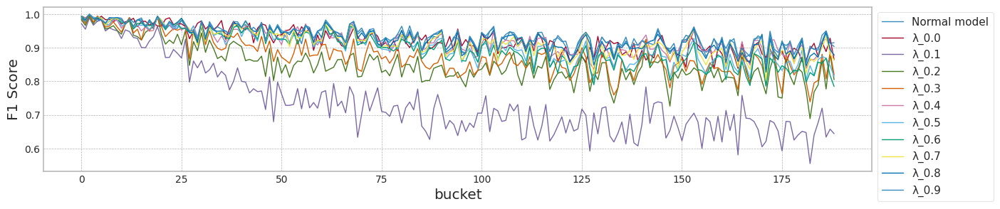

                   lambda   test_f1   init_f1   mean_f1   last_f1  MI(y^,z)
0   Case #3, Normal model  0.994975  0.983784  0.931648  0.915254   0.00000
1                     0.0  0.990000  0.994652  0.921448  0.864322   0.00685
2                     0.1  0.990000  0.972678  0.735972  0.643836   0.00685
3                     0.2  0.990000  0.983784  0.851716  0.804878   0.00685
4                     0.3  0.990000  0.989247  0.874748  0.819277   0.00685
5                     0.4  0.990000  0.994652  0.920517  0.877193   0.00685
6                     0.5  0.990000  0.994652  0.903286  0.814815   0.00685
7                     0.6  0.990000  0.994652  0.897846  0.784810   0.00685
8                     0.7  0.990000  0.989247  0.917752  0.863905   0.00685
9                     0.8  0.990000  0.989247  0.926984  0.878613   0.00685
10                    0.9  0.990000  0.989247  0.934735  0.903955   0.00685
max_mean_lambda= 0.9


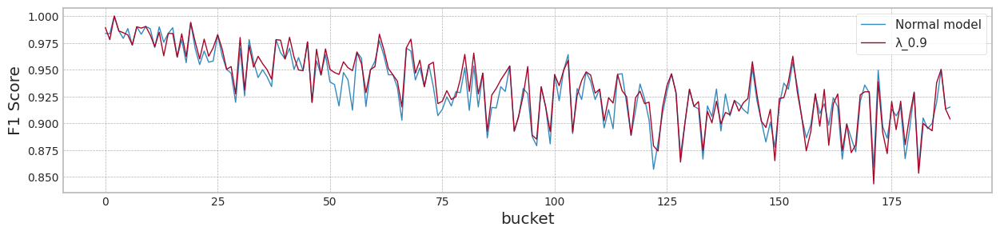

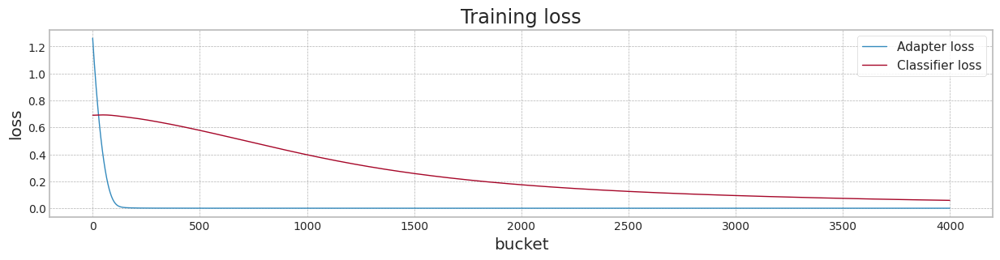

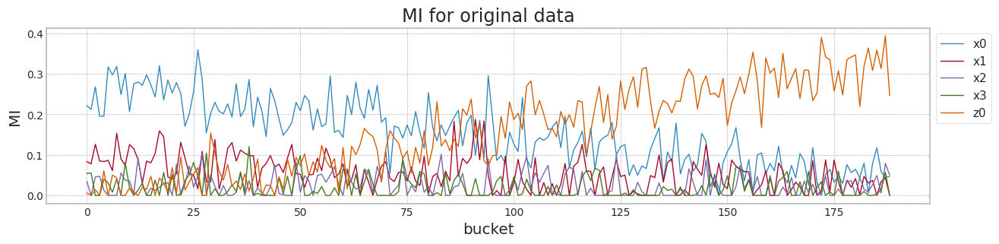

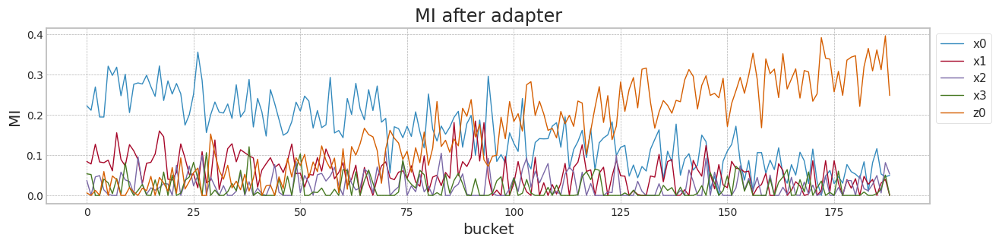

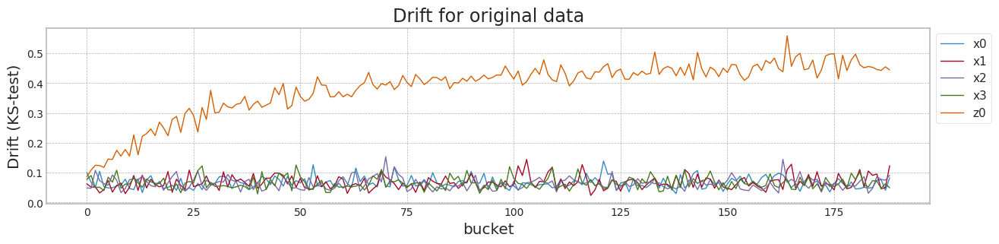

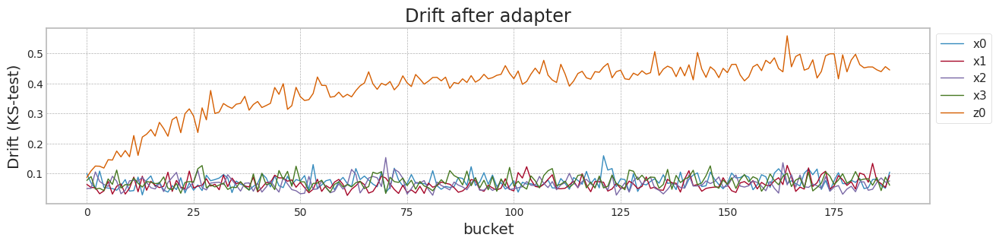

In [60]:

avaible_range = 40000
'''
train_tensors = Namespace(XS_train = torch.tensor(X2[0:1800][['x0','x1','x2','x3','z0']].values, dtype=torch.float32),
                          y_train = torch.tensor(y2[0:1800], dtype=torch.float32),
                          s1_train = torch.tensor(X2[0:1800][['z0']].values, dtype=torch.float32))
test_tensors = Namespace(XS_test = torch.tensor(X2[1800:2000][['x0','x1','x2','x3','z0']].values, dtype=torch.float32),
                         y_test = torch.tensor(y2[1800:2000], dtype=torch.float32),
                         s1_test = torch.tensor(X2[1800:2000][['z0']].values, dtype=torch.float32))
'''
train_tensors1 = Namespace(XS_train = torch.tensor(X2[0:1800][['x0','x1','x2','x3','z0','b']].values, dtype=torch.float32),
                          y_train = torch.tensor(y2[0:1800], dtype=torch.float32),
                          s1_train = torch.tensor(X2[0:1800][['z0']].values, dtype=torch.float32))
test_tensors1 = Namespace(XS_test = torch.tensor(X2[1800:2000][['x0','x1','x2','x3','z0','b']].values, dtype=torch.float32),
                         y_test = torch.tensor(y2[1800:2000], dtype=torch.float32),
                         s1_test = torch.tensor(X2[1800:2000][['z0']].values, dtype=torch.float32))

train_opt = Namespace(val=0, n_epochs=4000, k=5, lr_g=0.0001, lr_f=0.001, lr_r=0.001)
seed = 1

lambda_f_set = [-0.1,0.0,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9]
#lambda_f_set = [0.4,0.5]
#lambda_r = 0.4 # Lambda value for the robustness discriminator of FR-Train.



#lambda_f_set2 = [0.0000089,0.0000090,0.0000091]
lambda_f_set2 = [4.0]
lambda_a2 = 0.0

for lambda_f2 in lambda_f_set2:
    #lambda_a2 = lambda_f2

    result_table = {}
    result_table2 = {}
    result_table2['lambda']=[]
    result_table2['test_f1']=[]
    result_table2['init_f1']=[]
    result_table2['mean_f1']=[]
    result_table2['last_f1']=[]
    result_table2['MI(y^,z)']=[]
    infos = {}
    for lambda_f in lambda_f_set:
        '''
        if lambda_f == 0.0:
            f1,mi,last_generator= train_model(train_tensors, test_tensors, train_opt, lambda_f = lambda_f, seed = seed)
            result_table[f'lambda_{lambda_f}'] = test_all_data(last_generator)
        else:
        '''
        f1,mi,last_generator, last_adapter, df_loss = train_model(train_tensors1, test_tensors1, train_opt, lambda_f = lambda_f, seed = seed, alpha= lambda_f2 )# 0.00057)
        tad,df_mis,df_drf = test_all_data(last_generator,last_adapter,X2[0:1800][['x0','x1','x2','x3','z0']],X2[2000:][['x0','x1','x2','x3','z0','b']],y2[2000:])

        if lambda_f < 0.0:
            result_table2['lambda'].append("Case #3, Normal model")
            result_table['Normal model'] = tad
        else:
            result_table2['lambda'].append(lambda_f)
            result_table[f'λ_{lambda_f}'] = tad

        infos[f'λ_{lambda_f}'] = (df_loss,df_mis,df_drf)
        result_table2['test_f1'].append(f1)
        result_table2['init_f1'].append(tad[0])
        result_table2['mean_f1'].append(np.mean(tad))
        result_table2['last_f1'].append(tad[-1])
        result_table2['MI(y^,z)'].append(mi)


    result_df = pd.DataFrame(result_table)
    result_df.plot(figsize=main_figsize,linewidth=1,ylabel='F1 Score',xlabel='bucket',fontsize=10)
    plt.legend(bbox_to_anchor=(1.0, 1.0))
    plt.show()

    result4_df = pd.DataFrame(result_table2)

    print(result4_df)


    max_mean_lambda = result4_df[result4_df['mean_f1']==np.max(result4_df[1:]['mean_f1'])]['lambda']

    print('max_mean_lambda=',max_mean_lambda.values[0])

    result_df[['Normal model',f'λ_{max_mean_lambda.values[0]}']].plot(figsize=main_figsize,linewidth=1,ylabel='F1 Score',xlabel='bucket',fontsize=10)
    plt.legend(bbox_to_anchor=(1.0, 1.0))
    plt.show()

    og_loss,og_mis,og_drf = infos['λ_-0.1']
    df_loss,df_mis,df_drf = infos[f'λ_{max_mean_lambda.values[0]}']

    df_loss.astype(np.float32).plot(figsize=main_figsize,linewidth=1,ylabel='loss',xlabel='bucket',title='Training loss',fontsize=10)
    plt.legend(bbox_to_anchor=(1.0, 1.0))
    plt.show()

    og_mis.astype(np.float32).plot(figsize=main_figsize,linewidth=1,ylabel='MI',xlabel='bucket',title='MI for original data',fontsize=10)
    plt.legend(bbox_to_anchor=(1.0, 1.0))
    plt.show()

    df_mis.astype(np.float32).plot(figsize=main_figsize,linewidth=1,ylabel='MI',xlabel='bucket',title='MI after adapter',fontsize=10)
    plt.legend(bbox_to_anchor=(1.0, 1.0))
    plt.show()

    og_drf.astype(np.float32).plot(figsize=main_figsize,linewidth=1,ylabel='Drift (KS-test)',xlabel='bucket',title='Drift for original data',fontsize=10)
    plt.legend(bbox_to_anchor=(1.0, 1.0))
    plt.show()

    df_drf.astype(np.float32).plot(figsize=main_figsize,linewidth=1,ylabel='Drift (KS-test)',xlabel='bucket',title='Drift after adapter',fontsize=10)
    plt.legend(bbox_to_anchor=(1.0, 1.0))
    plt.show()

## synthetic data의 생성 (Case #4 MI의 고정, Drift의 증가)

### data 생성 (Test)

In [46]:
seed_everything()

data_size = 40000
cor = np.asarray([1.5, 1.2, 0.9 , 0.7, 0.5])

y3= (np.random.normal(0.5,0.5,data_size) > 0.5).astype(int)
x3 = np.zeros((data_size,5))
for ix,cor_ in enumerate(cor):
    '''
    x3[:,ix] = y3 + np.random.normal(1,cor_,data_size)
    '''
    # z0
    if ix == 4:
        for ii in range(len(y3)):
            x3[ii,ix] = y3[ii] + np.random.normal(0.0 + 4*ii/data_size,cor_)
    else:
        x3[:,ix] = y3 + np.random.normal(1,cor_,data_size)


In [47]:
columns=['x0','x1','x2','x3','z0']
X3 = pd.DataFrame(x3,columns=columns)
mi_scores = make_mi_scores(X3, y3, discrete_features="auto")
print(mi_scores)

x3    0.202783
x2    0.134082
z0    0.091439
x1    0.079411
x0    0.050887
Name: MI Scores, dtype: float64


Bucket size 200 step_size 190


100%|██████████| 190/190 [00:02<00:00, 65.60it/s]


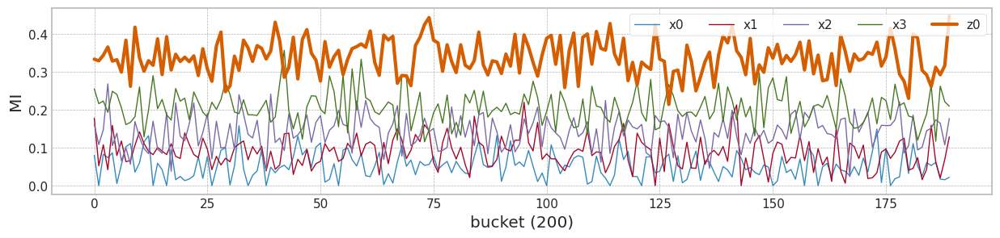

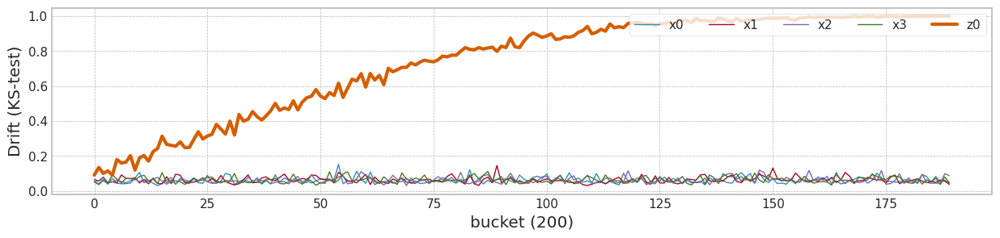

In [48]:
from tqdm import tqdm

plt.style.use('bmh')
plt.rcParams['axes.facecolor'] = 'white'

bucket_size_array=[200]#[10,50,100,200]

######################## Normalization ############################
from sklearn.preprocessing import MinMaxScaler, StandardScaler
scaler_c4 = StandardScaler()
# trainset을 가지고 Scaler를 fit하고, testset을 포함한 그 이후의 Data를 모두 transform 한다.
X3 = pd.DataFrame(np.concatenate((scaler_c4.fit_transform(X3[0:1800]), scaler_c4.transform(X3[1800:])),axis=0), columns=columns)

for bucket_size in bucket_size_array:
    MIS = {}
    DRF = {}
    for col in columns:
        MIS[col] = []
        DRF[col] = []

    #step_size = int(x.shape[0]/bucket_size)
    step_size = int((x3.shape[0]-2000)/bucket_size)

    print('Bucket size',bucket_size,'step_size',step_size)

    for bk in tqdm(range(step_size)):
        #print(bk,step_size)
        mi_scores = make_mi_scores(X3[bk*bucket_size:bk*bucket_size+bucket_size], y3[bk*bucket_size:bk*bucket_size+bucket_size], discrete_features="auto")
        ks = __ks_drift(X3[0:1800].values,X3[bk*bucket_size+2000:bk*bucket_size+bucket_size+2000].values)
        for ix,col in enumerate(columns):
            MIS[col].append(mi_scores[col])
            DRF[col].append(ks[:,0][ix])

    df_mis = pd.DataFrame(MIS)
    df_drf = pd.DataFrame(DRF)

    plt.figure(figsize=main_figsize)
    plt.plot(df_mis[['x0','x1','x2','x3']].values,linewidth=1,label=['x0','x1','x2','x3'])
    plt.plot(df_mis['z0'].values,linewidth=3,label='z0')
    plt.ylabel('MI')
    plt.xlabel(f'bucket ({bucket_size})')
    #df_mis.plot(figsize=main_figsize,linewidth=1,ylabel='MI',xlabel=f'bucket ({bucket_size})',fontsize=15)
    plt.legend(loc=1,ncol=5)
    plt.show()

    plt.figure(figsize=main_figsize)
    plt.plot(df_drf[['x0','x1','x2','x3']].values,linewidth=1,label=['x0','x1','x2','x3'])
    plt.plot(df_drf['z0'].values,linewidth=3,label='z0')
    plt.ylabel('Drift (KS-test)')
    plt.xlabel(f'bucket ({bucket_size})')
    #df_mis.plot(figsize=main_figsize,linewidth=1,ylabel='MI',xlabel=f'bucket ({bucket_size})',fontsize=15)
    plt.legend(loc=1,ncol=5)
    plt.show()

### 내성학습의 적용

In [49]:
X3['b'] = [int(b) for b in X3.index.values]
X3

,x0,x1,x2,x3,z0,b
0,0.470248,-0.657094,0.644936,-0.385024,0.289038,0
1,-0.098493,0.586148,0.837920,1.355031,1.004828,1
2,0.227515,1.703803,1.741631,0.321081,-0.583820,2
3,0.936628,-1.340995,-0.438504,-0.137903,-0.539317,3
4,0.861016,1.212753,0.120639,0.323837,1.138146,4
...,...,...,...,...,...,...
39995,-0.878001,-1.603546,0.040948,0.434072,3.908024,39995
39996,-0.259746,-1.334902,-0.152821,0.351855,4.017011,39996
39997,-0.661842,0.822949,0.806100,0.424942,6.259142,39997
39998,0.080499,-1.616542,-1.980372,0.743351,5.036251,39998


cuda:0
[Lambda: -0.100000] [Epoch 0/4000] [a loss: 0.000000] [G loss: 0.697719]
[Lambda: -0.100000] [Epoch 200/4000] [a loss: 0.000000] [G loss: 0.662210]
[Lambda: -0.100000] [Epoch 400/4000] [a loss: 0.000000] [G loss: 0.593723]
[Lambda: -0.100000] [Epoch 600/4000] [a loss: 0.000000] [G loss: 0.502838]
[Lambda: -0.100000] [Epoch 800/4000] [a loss: 0.000000] [G loss: 0.417379]
[Lambda: -0.100000] [Epoch 1000/4000] [a loss: 0.000000] [G loss: 0.346459]
[Lambda: -0.100000] [Epoch 1200/4000] [a loss: 0.000000] [G loss: 0.293216]
[Lambda: -0.100000] [Epoch 1400/4000] [a loss: 0.000000] [G loss: 0.255307]
[Lambda: -0.100000] [Epoch 1600/4000] [a loss: 0.000000] [G loss: 0.229146]
[Lambda: -0.100000] [Epoch 1800/4000] [a loss: 0.000000] [G loss: 0.211322]
[Lambda: -0.100000] [Epoch 2000/4000] [a loss: 0.000000] [G loss: 0.199097]
[Lambda: -0.100000] [Epoch 2200/4000] [a loss: 0.000000] [G loss: 0.190744]
[Lambda: -0.100000] [Epoch 2400/4000] [a loss: 0.000000] [G loss: 0.185021]
[Lambda: -0.

100%|██████████| 189/189 [00:03<00:00, 60.67it/s]


mean of drift:
x0    0.061049
x1    0.062651
x2    0.061975
x3    0.063260
z0    0.734850
dtype: float64
Mean F1 for all data: 0.7391672404203216
cuda:0
[Lambda: 0.000000] [Epoch 0/4000] [a loss: 1.263117] [G loss: 0.695153]
[Lambda: 0.000000] [Epoch 200/4000] [a loss: 16.052320] [G loss: 0.484190]
[Lambda: 0.000000] [Epoch 400/4000] [a loss: 80.293694] [G loss: 0.225068]
[Lambda: 0.000000] [Epoch 600/4000] [a loss: 128.007751] [G loss: 0.185546]
[Lambda: 0.000000] [Epoch 800/4000] [a loss: 151.844452] [G loss: 0.178750]
[Lambda: 0.000000] [Epoch 1000/4000] [a loss: 164.710052] [G loss: 0.175455]
[Lambda: 0.000000] [Epoch 1200/4000] [a loss: 169.581696] [G loss: 0.173849]
[Lambda: 0.000000] [Epoch 1400/4000] [a loss: 172.718475] [G loss: 0.172790]
[Lambda: 0.000000] [Epoch 1600/4000] [a loss: 175.978424] [G loss: 0.171993]
[Lambda: 0.000000] [Epoch 1800/4000] [a loss: 179.568756] [G loss: 0.171254]
[Lambda: 0.000000] [Epoch 2000/4000] [a loss: 183.786804] [G loss: 0.170509]
[Lambda: 0.

100%|██████████| 189/189 [00:03<00:00, 55.01it/s]


mean of drift:
x0    1.000000
x1    0.999932
x2    0.958277
x3    0.602531
z0    0.872978
dtype: float64
Mean F1 for all data: 0.7574360566210341
cuda:0
[Lambda: 0.100000] [Epoch 0/4000] [a loss: 1.263117] [G loss: 0.695153]
[Lambda: 0.100000] [Epoch 200/4000] [a loss: 0.132565] [G loss: 0.625683]
[Lambda: 0.100000] [Epoch 400/4000] [a loss: 0.252194] [G loss: 0.513852]
[Lambda: 0.100000] [Epoch 600/4000] [a loss: 0.334245] [G loss: 0.392685]
[Lambda: 0.100000] [Epoch 800/4000] [a loss: 0.328138] [G loss: 0.311158]
[Lambda: 0.100000] [Epoch 1000/4000] [a loss: 0.279156] [G loss: 0.261865]
[Lambda: 0.100000] [Epoch 1200/4000] [a loss: 0.223662] [G loss: 0.231685]
[Lambda: 0.100000] [Epoch 1400/4000] [a loss: 0.175686] [G loss: 0.212167]
[Lambda: 0.100000] [Epoch 1600/4000] [a loss: 0.136880] [G loss: 0.199096]
[Lambda: 0.100000] [Epoch 1800/4000] [a loss: 0.106288] [G loss: 0.189977]
[Lambda: 0.100000] [Epoch 2000/4000] [a loss: 0.083999] [G loss: 0.183265]
[Lambda: 0.100000] [Epoch 220

100%|██████████| 189/189 [00:03<00:00, 56.72it/s]


mean of drift:
x0    0.548081
x1    0.500438
x2    0.657695
x3    0.631914
z0    0.655620
dtype: float64
Mean F1 for all data: 0.7689826327110049
cuda:0
[Lambda: 0.200000] [Epoch 0/4000] [a loss: 1.263117] [G loss: 0.695153]
[Lambda: 0.200000] [Epoch 200/4000] [a loss: 0.028361] [G loss: 0.644051]
[Lambda: 0.200000] [Epoch 400/4000] [a loss: 0.069399] [G loss: 0.543704]
[Lambda: 0.200000] [Epoch 600/4000] [a loss: 0.099952] [G loss: 0.429249]
[Lambda: 0.200000] [Epoch 800/4000] [a loss: 0.104915] [G loss: 0.342588]
[Lambda: 0.200000] [Epoch 1000/4000] [a loss: 0.093080] [G loss: 0.284741]
[Lambda: 0.200000] [Epoch 1200/4000] [a loss: 0.076207] [G loss: 0.247211]
[Lambda: 0.200000] [Epoch 1400/4000] [a loss: 0.059692] [G loss: 0.222753]
[Lambda: 0.200000] [Epoch 1600/4000] [a loss: 0.046832] [G loss: 0.206222]
[Lambda: 0.200000] [Epoch 1800/4000] [a loss: 0.036304] [G loss: 0.194953]
[Lambda: 0.200000] [Epoch 2000/4000] [a loss: 0.028357] [G loss: 0.187023]
[Lambda: 0.200000] [Epoch 220

100%|██████████| 189/189 [00:03<00:00, 56.20it/s]


mean of drift:
x0    0.331775
x1    0.298316
x2    0.196590
x3    0.800661
z0    0.685500
dtype: float64
Mean F1 for all data: 0.7201104860324214
cuda:0
[Lambda: 0.300000] [Epoch 0/4000] [a loss: 1.263117] [G loss: 0.695153]
[Lambda: 0.300000] [Epoch 200/4000] [a loss: 0.011569] [G loss: 0.650067]
[Lambda: 0.300000] [Epoch 400/4000] [a loss: 0.026593] [G loss: 0.558850]
[Lambda: 0.300000] [Epoch 600/4000] [a loss: 0.041140] [G loss: 0.449075]
[Lambda: 0.300000] [Epoch 800/4000] [a loss: 0.045664] [G loss: 0.360688]
[Lambda: 0.300000] [Epoch 1000/4000] [a loss: 0.041500] [G loss: 0.298571]
[Lambda: 0.300000] [Epoch 1200/4000] [a loss: 0.034701] [G loss: 0.256850]
[Lambda: 0.300000] [Epoch 1400/4000] [a loss: 0.027871] [G loss: 0.229169]
[Lambda: 0.300000] [Epoch 1600/4000] [a loss: 0.021790] [G loss: 0.210720]
[Lambda: 0.300000] [Epoch 1800/4000] [a loss: 0.016950] [G loss: 0.198140]
[Lambda: 0.300000] [Epoch 2000/4000] [a loss: 0.013069] [G loss: 0.189454]
[Lambda: 0.300000] [Epoch 220

100%|██████████| 189/189 [00:03<00:00, 53.76it/s]


mean of drift:
x0    0.288242
x1    0.291481
x2    0.139809
x3    0.726423
z0    0.734374
dtype: float64
Mean F1 for all data: 0.7214820683619082
cuda:0
[Lambda: 0.400000] [Epoch 0/4000] [a loss: 1.263117] [G loss: 0.695153]
[Lambda: 0.400000] [Epoch 200/4000] [a loss: 0.006460] [G loss: 0.653056]
[Lambda: 0.400000] [Epoch 400/4000] [a loss: 0.011676] [G loss: 0.567777]
[Lambda: 0.400000] [Epoch 600/4000] [a loss: 0.018828] [G loss: 0.461804]
[Lambda: 0.400000] [Epoch 800/4000] [a loss: 0.021821] [G loss: 0.373182]
[Lambda: 0.400000] [Epoch 1000/4000] [a loss: 0.020644] [G loss: 0.308227]
[Lambda: 0.400000] [Epoch 1200/4000] [a loss: 0.017355] [G loss: 0.263918]
[Lambda: 0.400000] [Epoch 1400/4000] [a loss: 0.014011] [G loss: 0.234126]
[Lambda: 0.400000] [Epoch 1600/4000] [a loss: 0.010971] [G loss: 0.214141]
[Lambda: 0.400000] [Epoch 1800/4000] [a loss: 0.008464] [G loss: 0.200562]
[Lambda: 0.400000] [Epoch 2000/4000] [a loss: 0.006456] [G loss: 0.191226]
[Lambda: 0.400000] [Epoch 220

100%|██████████| 189/189 [00:03<00:00, 55.68it/s]


mean of drift:
x0    0.393760
x1    0.225570
x2    0.122093
x3    0.314553
z0    0.720585
dtype: float64
Mean F1 for all data: 0.7434040774778187
cuda:0
[Lambda: 0.500000] [Epoch 0/4000] [a loss: 1.263117] [G loss: 0.695153]
[Lambda: 0.500000] [Epoch 200/4000] [a loss: 0.004423] [G loss: 0.654865]
[Lambda: 0.500000] [Epoch 400/4000] [a loss: 0.005614] [G loss: 0.573448]
[Lambda: 0.500000] [Epoch 600/4000] [a loss: 0.009070] [G loss: 0.470499]
[Lambda: 0.500000] [Epoch 800/4000] [a loss: 0.010689] [G loss: 0.382329]
[Lambda: 0.500000] [Epoch 1000/4000] [a loss: 0.010450] [G loss: 0.315811]
[Lambda: 0.500000] [Epoch 1200/4000] [a loss: 0.009019] [G loss: 0.269369]
[Lambda: 0.500000] [Epoch 1400/4000] [a loss: 0.007214] [G loss: 0.238054]
[Lambda: 0.500000] [Epoch 1600/4000] [a loss: 0.005657] [G loss: 0.216857]
[Lambda: 0.500000] [Epoch 1800/4000] [a loss: 0.004340] [G loss: 0.202490]
[Lambda: 0.500000] [Epoch 2000/4000] [a loss: 0.003363] [G loss: 0.192539]
[Lambda: 0.500000] [Epoch 220

100%|██████████| 189/189 [00:03<00:00, 56.64it/s]


mean of drift:
x0    0.303965
x1    0.150232
x2    0.125400
x3    0.258895
z0    0.707219
dtype: float64
Mean F1 for all data: 0.764372902284583
cuda:0
[Lambda: 0.600000] [Epoch 0/4000] [a loss: 1.263117] [G loss: 0.695153]
[Lambda: 0.600000] [Epoch 200/4000] [a loss: 0.003505] [G loss: 0.656063]
[Lambda: 0.600000] [Epoch 400/4000] [a loss: 0.002795] [G loss: 0.577394]
[Lambda: 0.600000] [Epoch 600/4000] [a loss: 0.004261] [G loss: 0.476974]
[Lambda: 0.600000] [Epoch 800/4000] [a loss: 0.005182] [G loss: 0.389203]
[Lambda: 0.600000] [Epoch 1000/4000] [a loss: 0.005108] [G loss: 0.321890]
[Lambda: 0.600000] [Epoch 1200/4000] [a loss: 0.004488] [G loss: 0.273984]
[Lambda: 0.600000] [Epoch 1400/4000] [a loss: 0.003684] [G loss: 0.241220]
[Lambda: 0.600000] [Epoch 1600/4000] [a loss: 0.002868] [G loss: 0.219102]
[Lambda: 0.600000] [Epoch 1800/4000] [a loss: 0.002207] [G loss: 0.204026]
[Lambda: 0.600000] [Epoch 2000/4000] [a loss: 0.001683] [G loss: 0.193698]
[Lambda: 0.600000] [Epoch 2200

100%|██████████| 189/189 [00:03<00:00, 53.96it/s]


mean of drift:
x0    0.167654
x1    0.099671
x2    0.096376
x3    0.189409
z0    0.697422
dtype: float64
Mean F1 for all data: 0.7605755188863239
cuda:0
[Lambda: 0.700000] [Epoch 0/4000] [a loss: 1.263117] [G loss: 0.695153]
[Lambda: 0.700000] [Epoch 200/4000] [a loss: 0.003055] [G loss: 0.656915]
[Lambda: 0.700000] [Epoch 400/4000] [a loss: 0.001444] [G loss: 0.580221]
[Lambda: 0.700000] [Epoch 600/4000] [a loss: 0.001903] [G loss: 0.481770]
[Lambda: 0.700000] [Epoch 800/4000] [a loss: 0.002314] [G loss: 0.394713]
[Lambda: 0.700000] [Epoch 1000/4000] [a loss: 0.002297] [G loss: 0.326823]
[Lambda: 0.700000] [Epoch 1200/4000] [a loss: 0.002030] [G loss: 0.277935]
[Lambda: 0.700000] [Epoch 1400/4000] [a loss: 0.001681] [G loss: 0.244132]
[Lambda: 0.700000] [Epoch 1600/4000] [a loss: 0.001328] [G loss: 0.221102]
[Lambda: 0.700000] [Epoch 1800/4000] [a loss: 0.001034] [G loss: 0.205413]
[Lambda: 0.700000] [Epoch 2000/4000] [a loss: 0.000797] [G loss: 0.194691]
[Lambda: 0.700000] [Epoch 220

100%|██████████| 189/189 [00:03<00:00, 53.44it/s]


mean of drift:
x0    0.148962
x1    0.084653
x2    0.082590
x3    0.159177
z0    0.696099
dtype: float64
Mean F1 for all data: 0.7607889128681303
cuda:0
[Lambda: 0.800000] [Epoch 0/4000] [a loss: 1.263117] [G loss: 0.695153]
[Lambda: 0.800000] [Epoch 200/4000] [a loss: 0.002833] [G loss: 0.657551]
[Lambda: 0.800000] [Epoch 400/4000] [a loss: 0.000799] [G loss: 0.582408]
[Lambda: 0.800000] [Epoch 600/4000] [a loss: 0.000778] [G loss: 0.485489]
[Lambda: 0.800000] [Epoch 800/4000] [a loss: 0.000881] [G loss: 0.399193]
[Lambda: 0.800000] [Epoch 1000/4000] [a loss: 0.000868] [G loss: 0.330936]
[Lambda: 0.800000] [Epoch 1200/4000] [a loss: 0.000773] [G loss: 0.281217]
[Lambda: 0.800000] [Epoch 1400/4000] [a loss: 0.000636] [G loss: 0.246607]
[Lambda: 0.800000] [Epoch 1600/4000] [a loss: 0.000509] [G loss: 0.222910]
[Lambda: 0.800000] [Epoch 1800/4000] [a loss: 0.000400] [G loss: 0.206743]
[Lambda: 0.800000] [Epoch 2000/4000] [a loss: 0.000313] [G loss: 0.195660]
[Lambda: 0.800000] [Epoch 220

100%|██████████| 189/189 [00:03<00:00, 55.78it/s]


mean of drift:
x0    0.121182
x1    0.077175
x2    0.071820
x3    0.131711
z0    0.699224
dtype: float64
Mean F1 for all data: 0.7561778918236388
cuda:0
[Lambda: 0.900000] [Epoch 0/4000] [a loss: 1.263117] [G loss: 0.695153]
[Lambda: 0.900000] [Epoch 200/4000] [a loss: 0.002726] [G loss: 0.658042]
[Lambda: 0.900000] [Epoch 400/4000] [a loss: 0.000522] [G loss: 0.584111]
[Lambda: 0.900000] [Epoch 600/4000] [a loss: 0.000292] [G loss: 0.488500]
[Lambda: 0.900000] [Epoch 800/4000] [a loss: 0.000248] [G loss: 0.402909]
[Lambda: 0.900000] [Epoch 1000/4000] [a loss: 0.000225] [G loss: 0.334428]
[Lambda: 0.900000] [Epoch 1200/4000] [a loss: 0.000193] [G loss: 0.284140]
[Lambda: 0.900000] [Epoch 1400/4000] [a loss: 0.000158] [G loss: 0.248832]
[Lambda: 0.900000] [Epoch 1600/4000] [a loss: 0.000126] [G loss: 0.224602]
[Lambda: 0.900000] [Epoch 1800/4000] [a loss: 0.000102] [G loss: 0.208004]
[Lambda: 0.900000] [Epoch 2000/4000] [a loss: 0.000081] [G loss: 0.196642]
[Lambda: 0.900000] [Epoch 220

100%|██████████| 189/189 [00:03<00:00, 52.69it/s]


mean of drift:
x0    0.078345
x1    0.070894
x2    0.067842
x3    0.092651
z0    0.714403
dtype: float64
Mean F1 for all data: 0.7485116260757901


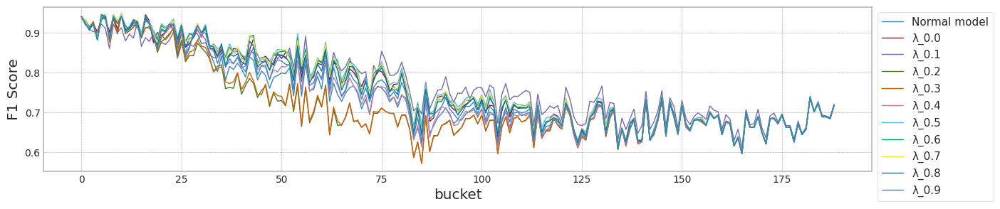

                   lambda   test_f1   init_f1   mean_f1   last_f1  MI(y^,z)
0   Case #4, Normal model  0.895028  0.940639  0.739167  0.717949  0.430042
1                     0.0  0.900000  0.940092  0.757436  0.717949  0.427969
2                     0.1  0.898876  0.940092  0.768983  0.720257  0.431465
3                     0.2  0.910112  0.935780  0.720110  0.717949  0.450809
4                     0.3  0.915254  0.935780  0.721482  0.717949  0.459142
5                     0.4  0.910112  0.935780  0.743404  0.717949  0.440471
6                     0.5  0.910112  0.935780  0.764373  0.717949  0.440471
7                     0.6  0.910112  0.935780  0.760576  0.717949  0.440471
8                     0.7  0.905028  0.935780  0.760789  0.717949  0.425236
9                     0.8  0.905028  0.940639  0.756178  0.717949  0.428639
10                    0.9  0.895028  0.940639  0.748512  0.717949  0.430042
max_mean_lambda= 0.1


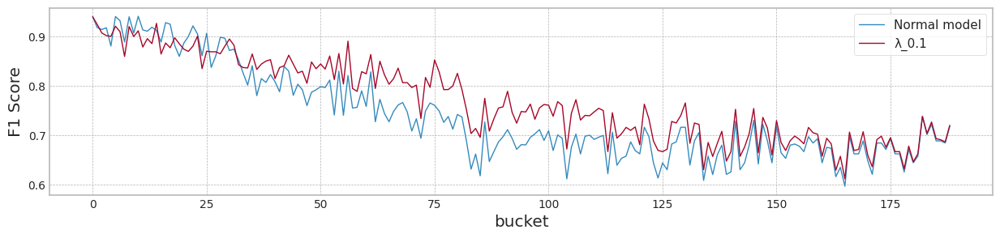

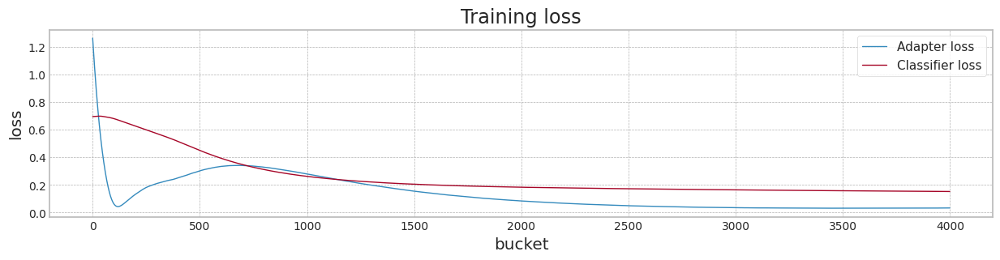

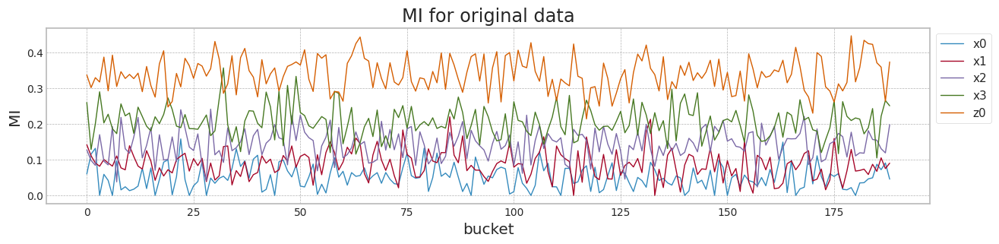

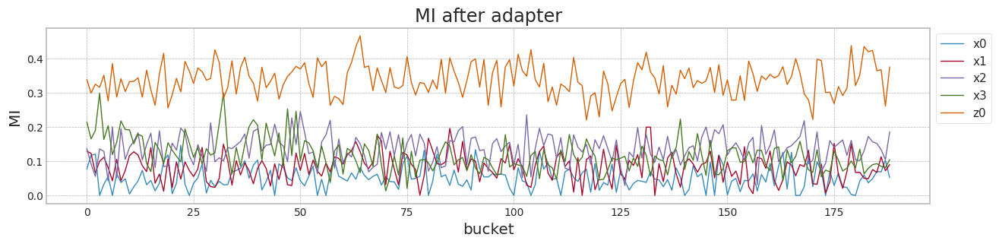

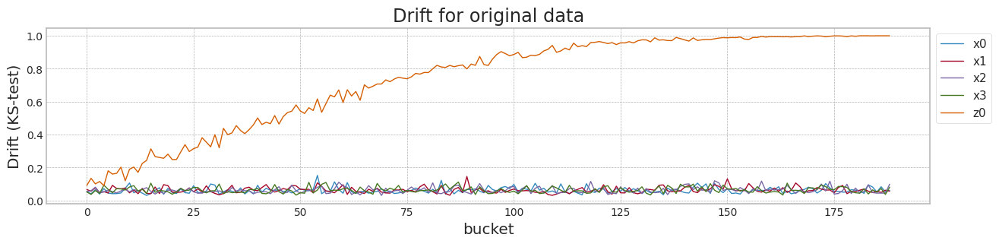

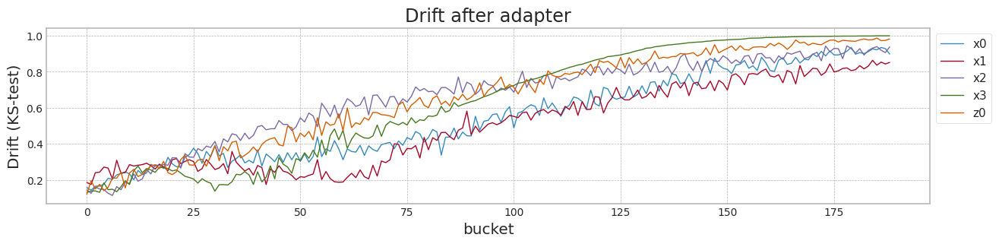

In [51]:
seed_everything()

train_result = []

avaible_range = 40000

train_tensors = Namespace(XS_train = torch.tensor(X3[0:1800][['x0','x1','x2','x3','z0']].values, dtype=torch.float32),
                          y_train = torch.tensor(y3[0:1800], dtype=torch.float32),
                          s1_train = torch.tensor(X3[0:1800][['z0']].values, dtype=torch.float32))
test_tensors = Namespace(XS_test = torch.tensor(X3[1800:2000][['x0','x1','x2','x3','z0']].values, dtype=torch.float32),
                         y_test = torch.tensor(y3[1800:2000], dtype=torch.float32),
                         s1_test = torch.tensor(X3[1800:2000][['z0']].values, dtype=torch.float32))

train_tensors1 = Namespace(XS_train = torch.tensor(X3[0:1800][['x0','x1','x2','x3','z0','b']].values, dtype=torch.float32),
                          y_train = torch.tensor(y3[0:1800], dtype=torch.float32),
                          s1_train = torch.tensor(X3[0:1800][['z0']].values, dtype=torch.float32))
test_tensors1 = Namespace(XS_test = torch.tensor(X3[1800:2000][['x0','x1','x2','x3','z0','b']].values, dtype=torch.float32),
                         y_test = torch.tensor(y3[1800:2000], dtype=torch.float32),
                         s1_test = torch.tensor(X3[1800:2000][['z0']].values, dtype=torch.float32))

train_opt = Namespace(val=0, n_epochs=4000, k=5, lr_g=0.0001, lr_f=0.001, lr_r=0.001)
seed = 1

lambda_f_set = [-0.1, 0.0,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9]
#lambda_f_set = [0.4,0.5]
#lambda_r = 0.4 # Lambda value for the robustness discriminator of FR-Train.



#lambda_f_set2 = [0.0000089,0.0000090,0.0000091]
lambda_f_set2 = [1.0]
lambda_a2 = 0.0

for lambda_f2 in lambda_f_set2:
    #lambda_a2 = lambda_f2

    result_table = {}
    result_table2 = {}
    result_table2['lambda']=[]
    result_table2['test_f1']=[]
    result_table2['init_f1']=[]
    result_table2['mean_f1']=[]
    result_table2['last_f1']=[]
    result_table2['MI(y^,z)']=[]
    infos = {}
    for lambda_f in lambda_f_set:
        '''
        if lambda_f == 0.0:
            f1,mi,last_generator= train_model(train_tensors, test_tensors, train_opt, lambda_f = lambda_f, seed = seed)
            result_table[f'lambda_{lambda_f}'] = test_all_data(last_generator)
        else:
        '''
        f1,mi,last_generator, last_adapter, df_loss = train_model(train_tensors1, test_tensors1, train_opt, lambda_f = lambda_f, seed = seed, alpha= lambda_f2 )# 0.00057)
        tad,df_mis,df_drf  = test_all_data(last_generator,last_adapter,X3[0:1800][['x0','x1','x2','x3','z0']],X3[2000:][['x0','x1','x2','x3','z0','b']],y3[2000:])

        if lambda_f < 0.0:
            result_table2['lambda'].append("Case #4, Normal model")
            result_table['Normal model'] = tad
        else:
            result_table2['lambda'].append(lambda_f)
            result_table[f'λ_{lambda_f}'] = tad

        infos[f'λ_{lambda_f}'] = (df_loss,df_mis,df_drf)
        result_table2['test_f1'].append(f1)
        result_table2['init_f1'].append(tad[0])
        result_table2['mean_f1'].append(np.mean(tad))
        result_table2['last_f1'].append(tad[-1])
        result_table2['MI(y^,z)'].append(mi)

    result_df = pd.DataFrame(result_table)
    result_df.plot(figsize=main_figsize,linewidth=1,ylabel='F1 Score',xlabel='bucket',fontsize=10)
    plt.legend(bbox_to_anchor=(1.0, 1.0))
    plt.show()

    result4_df = pd.DataFrame(result_table2)

    print(result4_df)

    max_mean_lambda = result4_df[result4_df['mean_f1']==np.max(result4_df[1:]['mean_f1'])]['lambda']

    print('max_mean_lambda=',max_mean_lambda.values[0])

    result_df[['Normal model',f'λ_{max_mean_lambda.values[0]}']].plot(figsize=main_figsize,linewidth=1,ylabel='F1 Score',xlabel='bucket',fontsize=10)
    plt.legend(bbox_to_anchor=(1.0, 1.0))
    plt.show()

    og_loss,og_mis,og_drf = infos['λ_-0.1']
    df_loss,df_mis,df_drf = infos[f'λ_{max_mean_lambda.values[0]}']

    df_loss.astype(np.float32).plot(figsize=main_figsize,linewidth=1,ylabel='loss',xlabel='bucket',title='Training loss',fontsize=10)
    plt.legend(bbox_to_anchor=(1.0, 1.0))
    plt.show()

    og_mis.astype(np.float32).plot(figsize=main_figsize,linewidth=1,ylabel='MI',xlabel='bucket',title='MI for original data',fontsize=10)
    plt.legend(bbox_to_anchor=(1.0, 1.0))
    plt.show()

    df_mis.astype(np.float32).plot(figsize=main_figsize,linewidth=1,ylabel='MI',xlabel='bucket',title='MI after adapter',fontsize=10)
    plt.legend(bbox_to_anchor=(1.0, 1.0))
    plt.show()

    og_drf.astype(np.float32).plot(figsize=main_figsize,linewidth=1,ylabel='Drift (KS-test)',xlabel='bucket',title='Drift for original data',fontsize=10)
    plt.legend(bbox_to_anchor=(1.0, 1.0))
    plt.show()

    df_drf.astype(np.float32).plot(figsize=main_figsize,linewidth=1,ylabel='Drift (KS-test)',xlabel='bucket',title='Drift after adapter',fontsize=10)
    plt.legend(bbox_to_anchor=(1.0, 1.0))
    plt.show()

## synthetic data의 생성 (Case #5 - Case #1,2,3,4의 상황이 각 feature에 혼재되어 있는 경우)

In [39]:
seed_everything()

data_size = 40000
cor = np.asarray([1.5, 1.2, 0.5 , 0.7, 2.5])

x4 = np.zeros((data_size,5))
for ix,cor_ in enumerate(cor):
    x4[:,ix] = np.random.normal(1,cor_,data_size)

y4_array = []
cor_const = cor[4]
cor_const2 = 3/x4.shape[0]
for ii in range(x4.shape[0]):
    # Case #2, MI의 증감(상대적), Drift의 고정 - z0
    cor[4] = cor[4] - cor_const / x4.shape[0]
    e = np.random.normal(0.0, 2.0)
    # Case #3 MI의 증감(상대적), Drift의 증가 - x3
    e1 = np.random.normal(0.0, 3*cor_const2 * ii)
    x4[ii,3] = x4[ii,3] + e1
    y4_array.append(np.sum(cor * x4[ii])+e)

y4 = [1 if y_ > 5 else 0 for y_ in y4_array]

for i in range(len(y4)):
    #Case #1 MI의 감소, Drift의 증가 - x2
    x4[i,2] = y4[i] + np.random.normal(1,0.5+(i/data_size))
    #Case #4 MI의 고정, Drift의 증가 - x1
    x4[i,1] = y4[i] + np.random.normal(0.0 + 4*(i/data_size),cor[1])


In [40]:
columns=['x0','x1','x2','x3','z0']
X4 = pd.DataFrame(x4,columns=columns)
mi_scores = make_mi_scores(X4, y4, discrete_features="auto")
print(mi_scores)

x3    0.145527
x2    0.113997
z0    0.092832
x0    0.043090
x1    0.024980
Name: MI Scores, dtype: float64


Bucket size 200 step_size 190


100%|██████████| 190/190 [00:02<00:00, 64.60it/s]


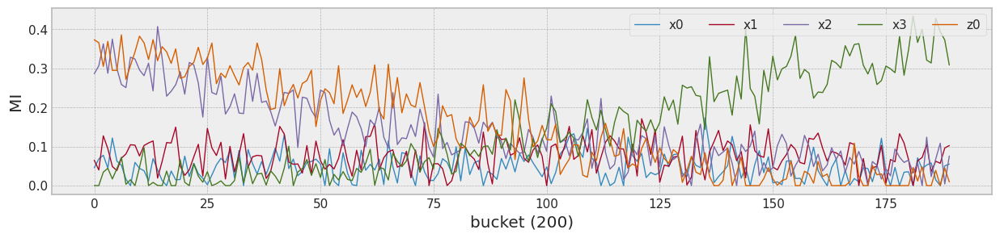

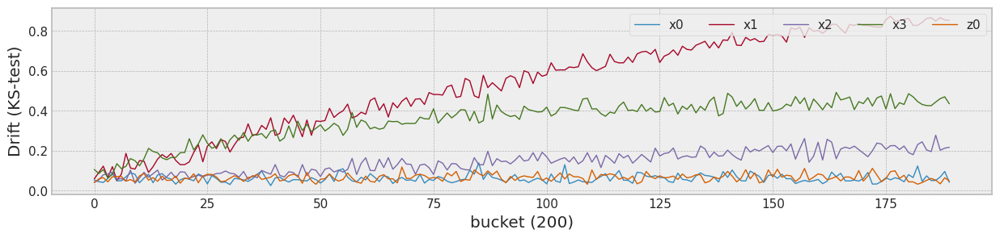

In [41]:
from tqdm import tqdm

bucket_size_array=[200]#[10,50,100,200]

######################## Normalization ############################
from sklearn.preprocessing import MinMaxScaler, StandardScaler
scaler_c5 = StandardScaler()
# trainset을 가지고 Scaler를 fit하고, testset을 포함한 그 이후의 Data를 모두 transform 한다.
X4 = pd.DataFrame(np.concatenate((scaler_c5.fit_transform(X4[0:1800]), scaler_c5.transform(X4[1800:])),axis=0), columns=columns)

for bucket_size in bucket_size_array:
    #bucket_size = 10

    MIS = {}
    DRF = {}
    for col in columns:
        MIS[col] = []
        DRF[col] = []

    #step_size = int(x.shape[0]/bucket_size)
    step_size = int((x4.shape[0]-2000)/bucket_size)
    print('Bucket size',bucket_size,'step_size',step_size)
    for bk in tqdm(range(step_size)):
        #print(bk,step_size)
        mi_scores = make_mi_scores(X4[bk*bucket_size:bk*bucket_size+bucket_size], y4[bk*bucket_size:bk*bucket_size+bucket_size], discrete_features="auto")
        ks = __ks_drift(X4[0:1800].values,X4[bk*bucket_size+2000:bk*bucket_size+bucket_size+2000].values)
        for ix,col in enumerate(columns):
            MIS[col].append(mi_scores[col])
            DRF[col].append(ks[:,0][ix])

    df_mis = pd.DataFrame(MIS)
    df_drf = pd.DataFrame(DRF)
    plt.figure(figsize=main_figsize)
    plt.plot(df_mis[['x0','x1','x2','x3','z0']].values,linewidth=1,label=['x0','x1','x2','x3','z0'])
    #plt.plot(df_mis[['x2','x3','z0']].values,linewidth=3,label=['x2','x3','z0'])
    plt.ylabel('MI')
    plt.xlabel(f'bucket ({bucket_size})')
    #df_mis.plot(figsize=(20,5),linewidth=1,ylabel='MI',xlabel=f'bucket ({bucket_size})',fontsize=15)
    plt.legend(loc=1,ncol=5)
    plt.show()

    plt.figure(figsize=main_figsize)
    plt.plot(df_drf[['x0','x1','x2','x3','z0']].values,linewidth=1,label=['x0','x1','x2','x3','z0'])
    #plt.plot(df_drf[['x2','x3','z0']].values,linewidth=3,label=['x2','x3','z0'])
    plt.ylabel('Drift (KS-test)')
    plt.xlabel(f'bucket ({bucket_size})')
    #df_mis.plot(figsize=(20,5),linewidth=1,ylabel='MI',xlabel=f'bucket ({bucket_size})',fontsize=15)
    plt.legend(loc=1,ncol=5)
    plt.show()

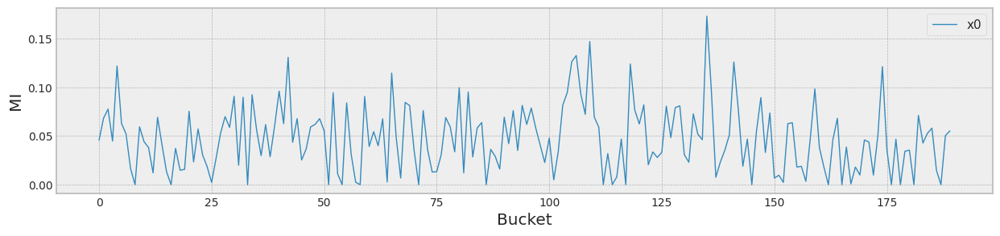

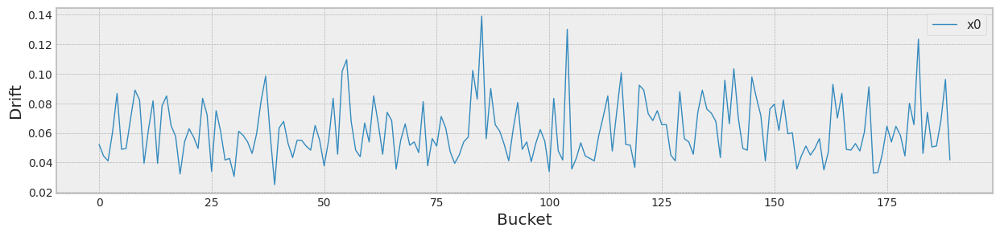

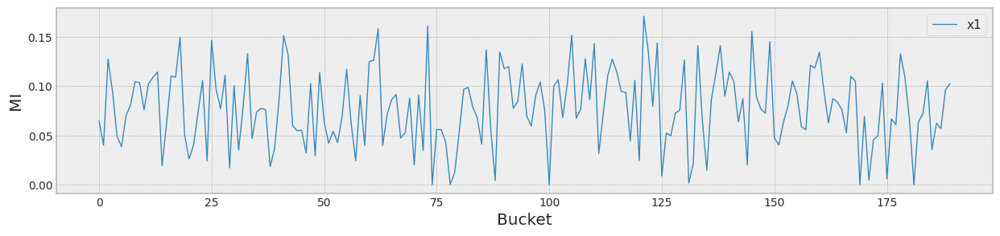

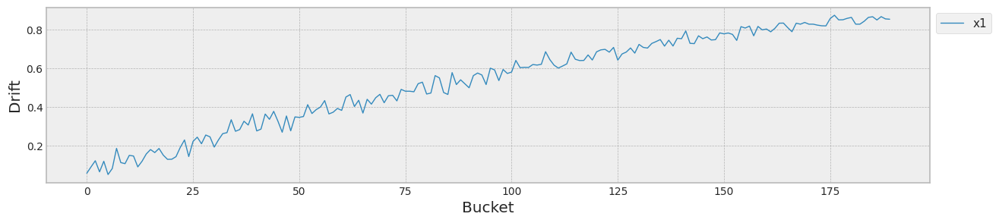

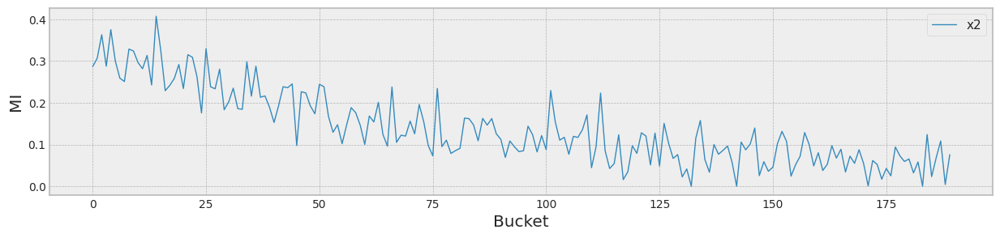

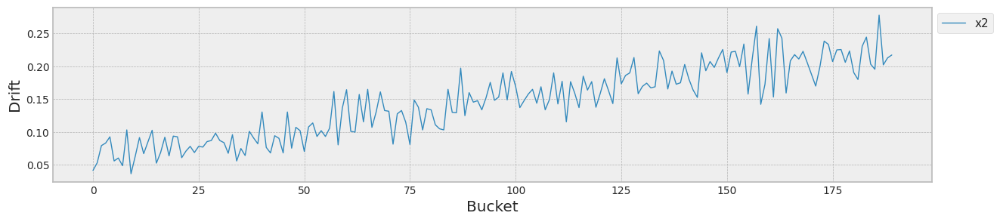

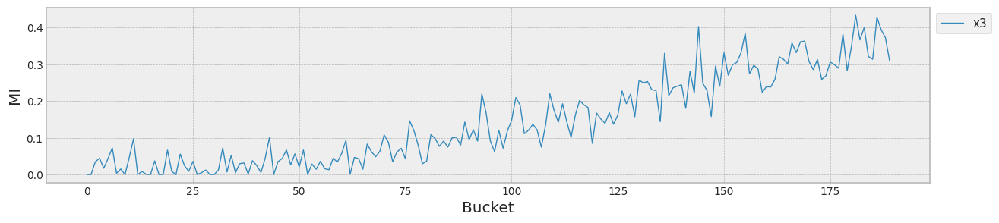

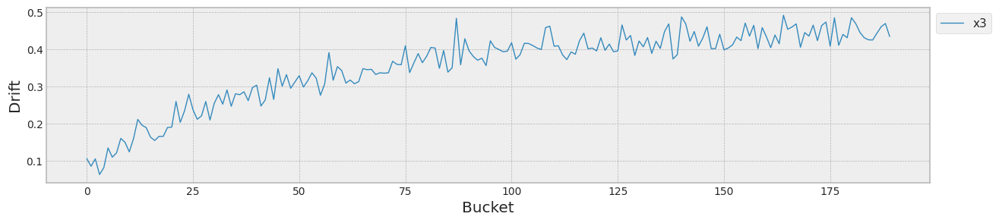

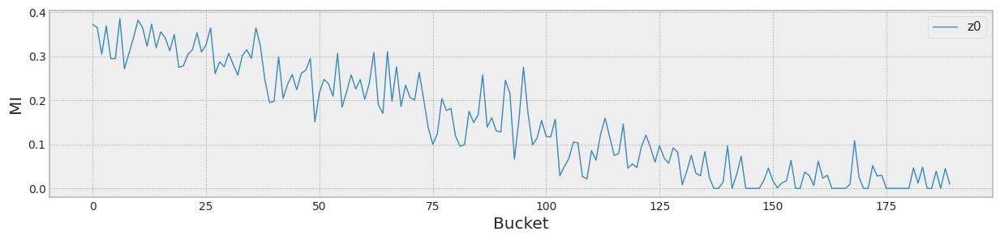

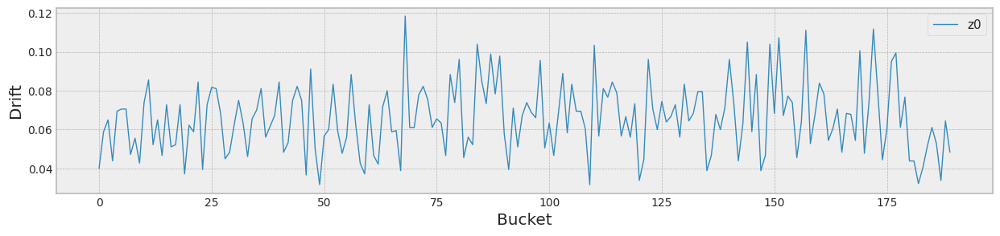

In [42]:
for cn in columns:
    df_mis[cn].plot(figsize=main_figsize,linewidth=1,ylabel='MI',xlabel='Bucket',fontsize=10)
    plt.legend(bbox_to_anchor=(1.0, 1.0))
    plt.show()
    df_drf[cn].plot(figsize=main_figsize,linewidth=1,ylabel='Drift',xlabel='Bucket',fontsize=10)
    plt.legend(bbox_to_anchor=(1.0, 1.0))
    plt.show()

<table>
<tr>
<td>구분</td><td>x0</td><td>x1</td><td>x2</td><td>x3</td><td>z0</td>
</tr>
<tr>
<td>MI 증가</td><td>-</td><td>-</td><td>-</td><td>O</td><td>-</td>
</tr>
<tr>
<td>MI 감소</td><td>-</td><td>-</td><td>O</td><td>-</td><td>O</td>
</tr>
<tr>
<td>MI 고정</td><td>O</td><td>O</td><td>-</td><td>-</td><td>-</td>
</tr>

<tr>
<td>Drift 증가</td><td>-</td><td>O</td><td>O</td><td>O</td><td>-</td>
</tr>
<tr>
<td>Drift 감소</td><td>-</td><td>-</td><td>-</td><td>-</td><td>-</td>
</tr>
<tr>
<td>Drift 고정</td><td>O</td><td>-</td><td>-</td><td>-</td><td>O</td>
</tr>
</table>

### 내성학습의 적용!

In [43]:
X4['b'] = [int(b) for b in X4.index.values]
X4

,x0,x1,x2,x3,z0,b
0,0.557441,-0.817302,-1.425469,0.192742,-1.223276,0
1,1.187568,0.361915,-0.848668,0.402593,0.961059,1
2,0.788527,-0.740149,0.439556,1.384411,-0.336884,2
3,-0.791986,0.181836,1.717422,0.051917,0.585143,3
4,0.388948,0.638406,-1.440773,-0.378224,-0.333425,4
...,...,...,...,...,...,...
39995,-0.871702,1.547741,-2.000360,2.393277,1.303158,39995
39996,-0.687055,4.730407,-1.954463,-3.314622,1.199950,39996
39997,0.807827,4.017663,1.021360,15.497050,-0.206506,39997
39998,-0.127522,4.603937,-0.581545,5.237343,1.691405,39998


cuda:0
[Lambda: -0.100000] [Epoch 0/4000] [a loss: 0.000000] [G loss: 0.702924]
[Lambda: -0.100000] [Epoch 200/4000] [a loss: 0.000000] [G loss: 0.667881]
[Lambda: -0.100000] [Epoch 400/4000] [a loss: 0.000000] [G loss: 0.614163]
[Lambda: -0.100000] [Epoch 600/4000] [a loss: 0.000000] [G loss: 0.542907]
[Lambda: -0.100000] [Epoch 800/4000] [a loss: 0.000000] [G loss: 0.468669]
[Lambda: -0.100000] [Epoch 1000/4000] [a loss: 0.000000] [G loss: 0.399116]
[Lambda: -0.100000] [Epoch 1200/4000] [a loss: 0.000000] [G loss: 0.339553]
[Lambda: -0.100000] [Epoch 1400/4000] [a loss: 0.000000] [G loss: 0.291403]
[Lambda: -0.100000] [Epoch 1600/4000] [a loss: 0.000000] [G loss: 0.251569]
[Lambda: -0.100000] [Epoch 1800/4000] [a loss: 0.000000] [G loss: 0.214823]
[Lambda: -0.100000] [Epoch 2000/4000] [a loss: 0.000000] [G loss: 0.190997]
[Lambda: -0.100000] [Epoch 2200/4000] [a loss: 0.000000] [G loss: 0.174331]
[Lambda: -0.100000] [Epoch 2400/4000] [a loss: 0.000000] [G loss: 0.162350]
[Lambda: -0.

100%|██████████| 189/189 [00:03<00:00, 51.69it/s]


mean of drift:
x0    0.061681
x1    0.532260
x2    0.145024
x3    0.354133
z0    0.065844
dtype: float64
Mean F1 for all data: 0.8300843520774839
cuda:0
[Lambda: 0.000000] [Epoch 0/4000] [a loss: 1.265006] [G loss: 0.706715]
[Lambda: 0.000000] [Epoch 200/4000] [a loss: 18.504827] [G loss: 0.480620]
[Lambda: 0.000000] [Epoch 400/4000] [a loss: 101.989380] [G loss: 0.172875]
[Lambda: 0.000000] [Epoch 600/4000] [a loss: 169.352417] [G loss: 0.132313]
[Lambda: 0.000000] [Epoch 800/4000] [a loss: 205.352280] [G loss: 0.125384]
[Lambda: 0.000000] [Epoch 1000/4000] [a loss: 224.509598] [G loss: 0.122023]
[Lambda: 0.000000] [Epoch 1200/4000] [a loss: 233.284225] [G loss: 0.119484]
[Lambda: 0.000000] [Epoch 1400/4000] [a loss: 238.519440] [G loss: 0.117569]
[Lambda: 0.000000] [Epoch 1600/4000] [a loss: 241.291672] [G loss: 0.116327]
[Lambda: 0.000000] [Epoch 1800/4000] [a loss: 245.479370] [G loss: 0.115307]
[Lambda: 0.000000] [Epoch 2000/4000] [a loss: 247.732285] [G loss: 0.114391]
[Lambda: 0

100%|██████████| 189/189 [00:03<00:00, 52.49it/s]


mean of drift:
x0    0.692125
x1    1.000000
x2    0.609788
x3    0.884785
z0    0.842187
dtype: float64
Mean F1 for all data: 0.5579336403935166
cuda:0
[Lambda: 0.100000] [Epoch 0/4000] [a loss: 1.265006] [G loss: 0.706715]
[Lambda: 0.100000] [Epoch 200/4000] [a loss: 0.224667] [G loss: 0.608192]
[Lambda: 0.100000] [Epoch 400/4000] [a loss: 0.389371] [G loss: 0.495225]
[Lambda: 0.100000] [Epoch 600/4000] [a loss: 0.432383] [G loss: 0.400346]
[Lambda: 0.100000] [Epoch 800/4000] [a loss: 0.421428] [G loss: 0.320668]
[Lambda: 0.100000] [Epoch 1000/4000] [a loss: 0.382327] [G loss: 0.253585]
[Lambda: 0.100000] [Epoch 1200/4000] [a loss: 0.322339] [G loss: 0.214849]
[Lambda: 0.100000] [Epoch 1400/4000] [a loss: 0.264508] [G loss: 0.189733]
[Lambda: 0.100000] [Epoch 1600/4000] [a loss: 0.216864] [G loss: 0.172055]
[Lambda: 0.100000] [Epoch 1800/4000] [a loss: 0.178092] [G loss: 0.159115]
[Lambda: 0.100000] [Epoch 2000/4000] [a loss: 0.146522] [G loss: 0.149292]
[Lambda: 0.100000] [Epoch 220

100%|██████████| 189/189 [00:03<00:00, 51.66it/s]


mean of drift:
x0    0.778330
x1    0.491573
x2    0.837278
x3    0.378001
z0    0.310629
dtype: float64
Mean F1 for all data: 0.7518476261067187
cuda:0
[Lambda: 0.200000] [Epoch 0/4000] [a loss: 1.265006] [G loss: 0.706715]
[Lambda: 0.200000] [Epoch 200/4000] [a loss: 0.046894] [G loss: 0.638206]
[Lambda: 0.200000] [Epoch 400/4000] [a loss: 0.104209] [G loss: 0.541862]
[Lambda: 0.200000] [Epoch 600/4000] [a loss: 0.136556] [G loss: 0.444366]
[Lambda: 0.200000] [Epoch 800/4000] [a loss: 0.141072] [G loss: 0.362669]
[Lambda: 0.200000] [Epoch 1000/4000] [a loss: 0.135504] [G loss: 0.286631]
[Lambda: 0.200000] [Epoch 1200/4000] [a loss: 0.116308] [G loss: 0.237981]
[Lambda: 0.200000] [Epoch 1400/4000] [a loss: 0.096648] [G loss: 0.205935]
[Lambda: 0.200000] [Epoch 1600/4000] [a loss: 0.079283] [G loss: 0.183790]
[Lambda: 0.200000] [Epoch 1800/4000] [a loss: 0.065744] [G loss: 0.167644]
[Lambda: 0.200000] [Epoch 2000/4000] [a loss: 0.054026] [G loss: 0.155717]
[Lambda: 0.200000] [Epoch 220

100%|██████████| 189/189 [00:03<00:00, 55.20it/s]


mean of drift:
x0    0.586614
x1    0.597310
x2    0.783721
x3    0.373216
z0    0.511223
dtype: float64
Mean F1 for all data: 0.7497374255742733
cuda:0
[Lambda: 0.300000] [Epoch 0/4000] [a loss: 1.265006] [G loss: 0.706715]
[Lambda: 0.300000] [Epoch 200/4000] [a loss: 0.017458] [G loss: 0.648354]
[Lambda: 0.300000] [Epoch 400/4000] [a loss: 0.038881] [G loss: 0.564052]
[Lambda: 0.300000] [Epoch 600/4000] [a loss: 0.056774] [G loss: 0.470000]
[Lambda: 0.300000] [Epoch 800/4000] [a loss: 0.062795] [G loss: 0.387022]
[Lambda: 0.300000] [Epoch 1000/4000] [a loss: 0.062647] [G loss: 0.307892]
[Lambda: 0.300000] [Epoch 1200/4000] [a loss: 0.055689] [G loss: 0.252792]
[Lambda: 0.300000] [Epoch 1400/4000] [a loss: 0.046695] [G loss: 0.216450]
[Lambda: 0.300000] [Epoch 1600/4000] [a loss: 0.038564] [G loss: 0.191402]
[Lambda: 0.300000] [Epoch 1800/4000] [a loss: 0.031592] [G loss: 0.173448]
[Lambda: 0.300000] [Epoch 2000/4000] [a loss: 0.026318] [G loss: 0.160059]
[Lambda: 0.300000] [Epoch 220

100%|██████████| 189/189 [00:03<00:00, 53.29it/s]


mean of drift:
x0    0.438272
x1    0.596608
x2    0.661828
x3    0.368971
z0    0.613830
dtype: float64
Mean F1 for all data: 0.8087579063916112
cuda:0
[Lambda: 0.400000] [Epoch 0/4000] [a loss: 1.265006] [G loss: 0.706715]
[Lambda: 0.400000] [Epoch 200/4000] [a loss: 0.008751] [G loss: 0.653288]
[Lambda: 0.400000] [Epoch 400/4000] [a loss: 0.016635] [G loss: 0.576728]
[Lambda: 0.400000] [Epoch 600/4000] [a loss: 0.025984] [G loss: 0.486858]
[Lambda: 0.400000] [Epoch 800/4000] [a loss: 0.030558] [G loss: 0.404007]
[Lambda: 0.400000] [Epoch 1000/4000] [a loss: 0.031251] [G loss: 0.325434]
[Lambda: 0.400000] [Epoch 1200/4000] [a loss: 0.028928] [G loss: 0.265037]
[Lambda: 0.400000] [Epoch 1400/4000] [a loss: 0.024688] [G loss: 0.225193]
[Lambda: 0.400000] [Epoch 1600/4000] [a loss: 0.020699] [G loss: 0.197606]
[Lambda: 0.400000] [Epoch 1800/4000] [a loss: 0.017082] [G loss: 0.178011]
[Lambda: 0.400000] [Epoch 2000/4000] [a loss: 0.014183] [G loss: 0.163650]
[Lambda: 0.400000] [Epoch 220

100%|██████████| 189/189 [00:03<00:00, 54.99it/s]


mean of drift:
x0    0.356170
x1    0.537537
x2    0.589377
x3    0.366337
z0    0.426552
dtype: float64
Mean F1 for all data: 0.7441180037318794
cuda:0
[Lambda: 0.500000] [Epoch 0/4000] [a loss: 1.265006] [G loss: 0.706715]
[Lambda: 0.500000] [Epoch 200/4000] [a loss: 0.005435] [G loss: 0.656162]
[Lambda: 0.500000] [Epoch 400/4000] [a loss: 0.007743] [G loss: 0.584577]
[Lambda: 0.500000] [Epoch 600/4000] [a loss: 0.012297] [G loss: 0.498613]
[Lambda: 0.500000] [Epoch 800/4000] [a loss: 0.015037] [G loss: 0.416679]
[Lambda: 0.500000] [Epoch 1000/4000] [a loss: 0.015783] [G loss: 0.338090]
[Lambda: 0.500000] [Epoch 1200/4000] [a loss: 0.015044] [G loss: 0.274893]
[Lambda: 0.500000] [Epoch 1400/4000] [a loss: 0.013208] [G loss: 0.232358]
[Lambda: 0.500000] [Epoch 1600/4000] [a loss: 0.011136] [G loss: 0.203011]
[Lambda: 0.500000] [Epoch 1800/4000] [a loss: 0.009189] [G loss: 0.182141]
[Lambda: 0.500000] [Epoch 2000/4000] [a loss: 0.007644] [G loss: 0.166897]
[Lambda: 0.500000] [Epoch 220

100%|██████████| 189/189 [00:03<00:00, 55.09it/s]


mean of drift:
x0    0.332340
x1    0.510917
x2    0.398798
x3    0.365238
z0    0.278777
dtype: float64
Mean F1 for all data: 0.8504631041870884
cuda:0
[Lambda: 0.600000] [Epoch 0/4000] [a loss: 1.265006] [G loss: 0.706715]
[Lambda: 0.600000] [Epoch 200/4000] [a loss: 0.003955] [G loss: 0.658022]
[Lambda: 0.600000] [Epoch 400/4000] [a loss: 0.003676] [G loss: 0.589943]
[Lambda: 0.600000] [Epoch 600/4000] [a loss: 0.005710] [G loss: 0.507174]
[Lambda: 0.600000] [Epoch 800/4000] [a loss: 0.007177] [G loss: 0.426473]
[Lambda: 0.600000] [Epoch 1000/4000] [a loss: 0.007810] [G loss: 0.347951]
[Lambda: 0.600000] [Epoch 1200/4000] [a loss: 0.007566] [G loss: 0.283126]
[Lambda: 0.600000] [Epoch 1400/4000] [a loss: 0.006753] [G loss: 0.238770]
[Lambda: 0.600000] [Epoch 1600/4000] [a loss: 0.005732] [G loss: 0.207891]
[Lambda: 0.600000] [Epoch 1800/4000] [a loss: 0.004804] [G loss: 0.185848]
[Lambda: 0.600000] [Epoch 2000/4000] [a loss: 0.003988] [G loss: 0.169862]
[Lambda: 0.600000] [Epoch 220

100%|██████████| 189/189 [00:03<00:00, 54.31it/s]


mean of drift:
x0    0.268707
x1    0.490435
x2    0.378786
x3    0.364165
z0    0.345529
dtype: float64
Mean F1 for all data: 0.8182566041888147
cuda:0
[Lambda: 0.700000] [Epoch 0/4000] [a loss: 1.265006] [G loss: 0.706715]
[Lambda: 0.700000] [Epoch 200/4000] [a loss: 0.003250] [G loss: 0.659326]
[Lambda: 0.700000] [Epoch 400/4000] [a loss: 0.001784] [G loss: 0.593734]
[Lambda: 0.700000] [Epoch 600/4000] [a loss: 0.002507] [G loss: 0.513560]
[Lambda: 0.700000] [Epoch 800/4000] [a loss: 0.003183] [G loss: 0.434191]
[Lambda: 0.700000] [Epoch 1000/4000] [a loss: 0.003494] [G loss: 0.356701]
[Lambda: 0.700000] [Epoch 1200/4000] [a loss: 0.003478] [G loss: 0.290199]
[Lambda: 0.700000] [Epoch 1400/4000] [a loss: 0.003128] [G loss: 0.244358]
[Lambda: 0.700000] [Epoch 1600/4000] [a loss: 0.002696] [G loss: 0.212165]
[Lambda: 0.700000] [Epoch 1800/4000] [a loss: 0.002247] [G loss: 0.189089]
[Lambda: 0.700000] [Epoch 2000/4000] [a loss: 0.001854] [G loss: 0.172370]
[Lambda: 0.700000] [Epoch 220

100%|██████████| 189/189 [00:03<00:00, 55.41it/s]


mean of drift:
x0    0.238880
x1    0.482848
x2    0.349900
x3    0.360888
z0    0.310564
dtype: float64
Mean F1 for all data: 0.8231118426081062
cuda:0
[Lambda: 0.800000] [Epoch 0/4000] [a loss: 1.265006] [G loss: 0.706715]
[Lambda: 0.800000] [Epoch 200/4000] [a loss: 0.002904] [G loss: 0.660307]
[Lambda: 0.800000] [Epoch 400/4000] [a loss: 0.000901] [G loss: 0.596568]
[Lambda: 0.800000] [Epoch 600/4000] [a loss: 0.000982] [G loss: 0.518453]
[Lambda: 0.800000] [Epoch 800/4000] [a loss: 0.001181] [G loss: 0.440419]
[Lambda: 0.800000] [Epoch 1000/4000] [a loss: 0.001297] [G loss: 0.362687]
[Lambda: 0.800000] [Epoch 1200/4000] [a loss: 0.001304] [G loss: 0.295914]
[Lambda: 0.800000] [Epoch 1400/4000] [a loss: 0.001189] [G loss: 0.249145]
[Lambda: 0.800000] [Epoch 1600/4000] [a loss: 0.001026] [G loss: 0.216097]
[Lambda: 0.800000] [Epoch 1800/4000] [a loss: 0.000878] [G loss: 0.192283]
[Lambda: 0.800000] [Epoch 2000/4000] [a loss: 0.000731] [G loss: 0.174946]
[Lambda: 0.800000] [Epoch 220

100%|██████████| 189/189 [00:03<00:00, 55.45it/s]


mean of drift:
x0    0.186373
x1    0.482143
x2    0.284192
x3    0.359350
z0    0.263386
dtype: float64
Mean F1 for all data: 0.8499806243300934
cuda:0
[Lambda: 0.900000] [Epoch 0/4000] [a loss: 1.265006] [G loss: 0.706715]
[Lambda: 0.900000] [Epoch 200/4000] [a loss: 0.002744] [G loss: 0.661067]
[Lambda: 0.900000] [Epoch 400/4000] [a loss: 0.000528] [G loss: 0.598778]
[Lambda: 0.900000] [Epoch 600/4000] [a loss: 0.000334] [G loss: 0.522359]
[Lambda: 0.900000] [Epoch 800/4000] [a loss: 0.000310] [G loss: 0.445523]
[Lambda: 0.900000] [Epoch 1000/4000] [a loss: 0.000312] [G loss: 0.368198]
[Lambda: 0.900000] [Epoch 1200/4000] [a loss: 0.000307] [G loss: 0.301126]
[Lambda: 0.900000] [Epoch 1400/4000] [a loss: 0.000276] [G loss: 0.253628]
[Lambda: 0.900000] [Epoch 1600/4000] [a loss: 0.000239] [G loss: 0.219747]
[Lambda: 0.900000] [Epoch 1800/4000] [a loss: 0.000204] [G loss: 0.195288]
[Lambda: 0.900000] [Epoch 2000/4000] [a loss: 0.000175] [G loss: 0.177498]
[Lambda: 0.900000] [Epoch 220

100%|██████████| 189/189 [00:03<00:00, 53.02it/s]


mean of drift:
x0    0.118836
x1    0.499153
x2    0.214982
x3    0.358060
z0    0.181405
dtype: float64
Mean F1 for all data: 0.8582687709050568


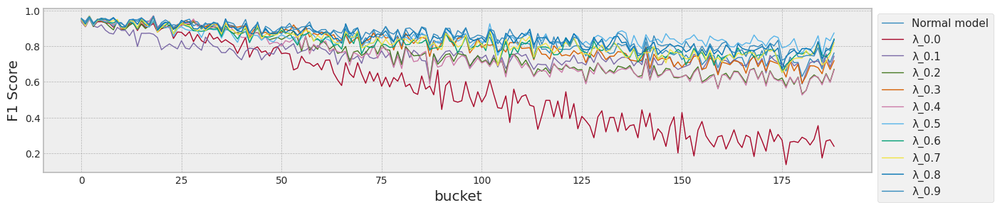

                   lambda   test_f1   init_f1   mean_f1   last_f1  MI(y^,z)
0   Case #5, Normal model  0.957627  0.955752  0.830084  0.762646  0.376756
1                     0.0  0.957627  0.945946  0.557934  0.237288  0.385029
2                     0.1  0.948718  0.937500  0.751848  0.744361  0.370742
3                     0.2  0.953191  0.941704  0.749737  0.671141  0.369157
4                     0.3  0.953191  0.950673  0.808758  0.719424  0.369157
5                     0.4  0.957265  0.941704  0.744118  0.666667  0.373968
6                     0.5  0.961702  0.951111  0.850463  0.875000  0.389943
7                     0.6  0.961702  0.951111  0.818257  0.841530  0.389943
8                     0.7  0.961702  0.951111  0.823112  0.821622  0.389943
9                     0.8  0.961702  0.955752  0.849981  0.837438  0.389943
10                    0.9  0.957627  0.955752  0.858269  0.834081  0.376756
max_mean_lambda= 0.9


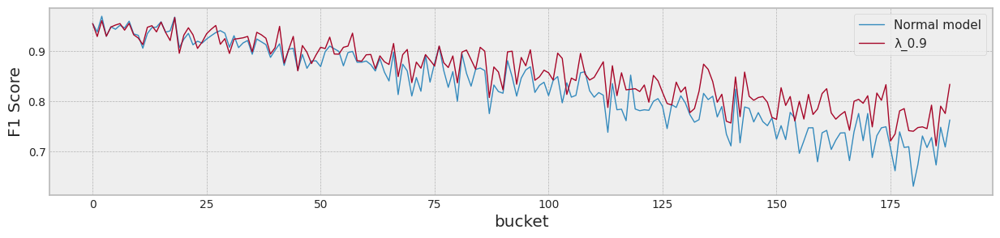

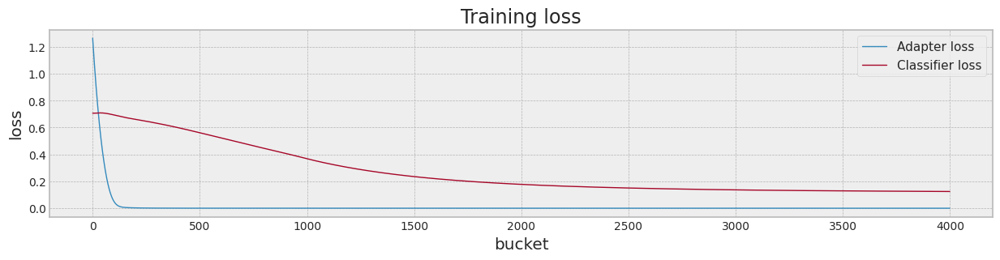

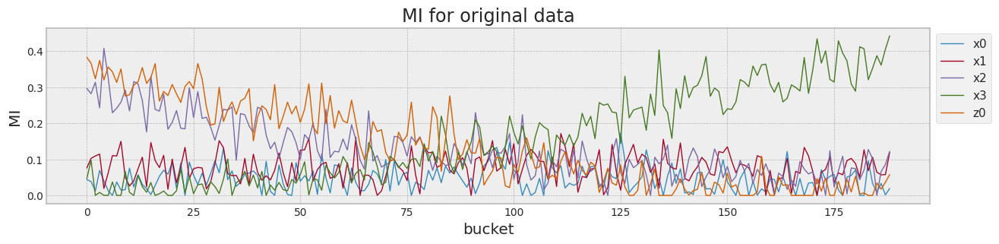

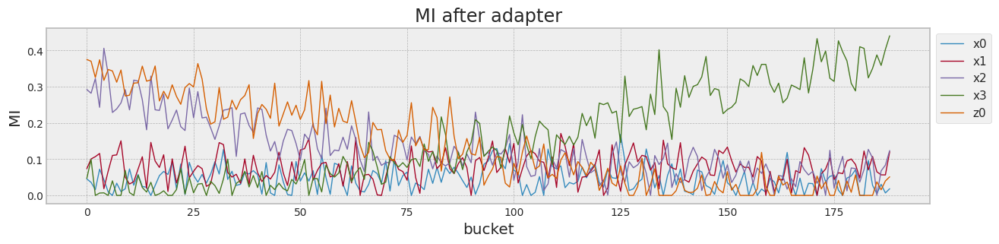

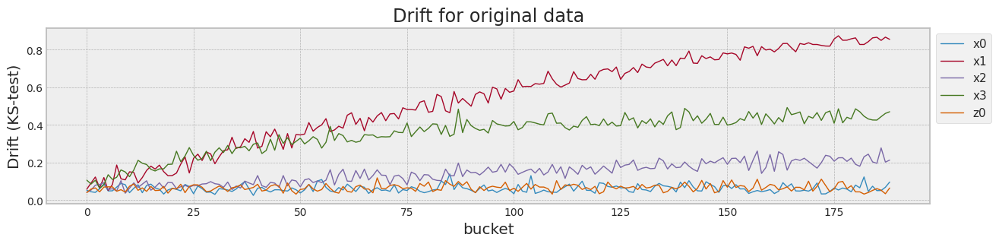

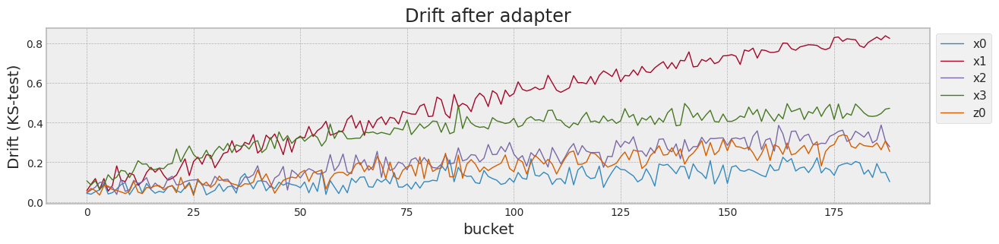

In [45]:
#train_result = []

avaible_range = 40000

train_tensors = Namespace(XS_train = torch.tensor(X4[0:1800][['x0','x1','x2','x3','z0','b']].values, dtype=torch.float32),
                          y_train = torch.tensor(y4[0:1800], dtype=torch.float32),
                          s1_train = torch.tensor(X4[0:1800][['z0']].values, dtype=torch.float32))
test_tensors = Namespace(XS_test = torch.tensor(X4[1800:2000][['x0','x1','x2','x3','z0','b']].values, dtype=torch.float32),
                         y_test = torch.tensor(y4[1800:2000], dtype=torch.float32),
                         s1_test = torch.tensor(X4[1800:2000][['z0']].values, dtype=torch.float32))

train_opt = Namespace(val=0, n_epochs=4000, k=5, lr_g=0.0001, lr_f=0.001, lr_r=0.001)
seed = 1

lambda_f_set = [-0.1, 0.0,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9]
#lambda_f_set = [0.4,0.5]
#lambda_r = 0.4 # Lambda value for the robustness discriminator of FR-Train.



#lambda_f_set2 = [0.0000089,0.0000090,0.0000091]
lambda_f_set2 = [1.0]
lambda_a2 = 0.0

for lambda_f2 in lambda_f_set2:
    #lambda_a2 = lambda_f2

    result_table = {}
    result_table2 = {}
    result_table2['lambda']=[]
    result_table2['test_f1']=[]
    result_table2['init_f1']=[]
    result_table2['mean_f1']=[]
    result_table2['last_f1']=[]
    result_table2['MI(y^,z)']=[]
    infos = {}
    for lambda_f in lambda_f_set:
        '''
        if lambda_f == 0.0:
            f1,mi,last_generator= train_model(train_tensors, test_tensors, train_opt, lambda_f = lambda_f, seed = seed)
            result_table[f'lambda_{lambda_f}'] = test_all_data(last_generator)
        else:
        '''
        f1,mi,last_generator, last_adapter, df_loss = train_model(train_tensors, test_tensors, train_opt, lambda_f = lambda_f, seed = seed, alpha= lambda_f2 )# 0.00057)
        tad,df_mis,df_drf  = test_all_data(last_generator,last_adapter,
                                           X4[0:1800][['x0','x1','x2','x3','z0']],
                                           X4[2000:][['x0','x1','x2','x3','z0','b']],
                                           y4[2000:])

        if lambda_f < 0.0:
            result_table2['lambda'].append("Case #5, Normal model")
            result_table['Normal model'] = tad
        else:
            result_table2['lambda'].append(lambda_f)
            result_table[f'λ_{lambda_f}'] = tad

        infos[f'λ_{lambda_f}'] = (df_loss,df_mis,df_drf)
        result_table2['test_f1'].append(f1)
        result_table2['init_f1'].append(tad[0])
        result_table2['mean_f1'].append(np.mean(tad))
        result_table2['last_f1'].append(tad[-1])
        result_table2['MI(y^,z)'].append(mi)

    result_df = pd.DataFrame(result_table)
    result_df.plot(figsize=main_figsize,linewidth=1,ylabel='F1 Score',xlabel='bucket',fontsize=10)
    plt.legend(bbox_to_anchor=(1.0, 1.0))
    plt.show()

    result4_df = pd.DataFrame(result_table2)

    print(result4_df)

    max_mean_lambda = result4_df[result4_df['mean_f1']==np.max(result4_df[1:]['mean_f1'])]['lambda']

    print('max_mean_lambda=',max_mean_lambda.values[0])

    result_df[['Normal model',f'λ_{max_mean_lambda.values[0]}']].plot(figsize=main_figsize,linewidth=1,ylabel='F1 Score',xlabel='bucket',fontsize=10)
    plt.legend(bbox_to_anchor=(1.0, 1.0))
    plt.show()

    og_loss,og_mis,og_drf = infos['λ_-0.1']
    df_loss,df_mis,df_drf = infos[f'λ_{max_mean_lambda.values[0]}']

    df_loss.astype(np.float32).plot(figsize=main_figsize,linewidth=1,ylabel='loss',xlabel='bucket',title='Training loss',fontsize=10)
    plt.legend(bbox_to_anchor=(1.0, 1.0))
    plt.show()

    og_mis.astype(np.float32).plot(figsize=main_figsize,linewidth=1,ylabel='MI',xlabel='bucket',title='MI for original data',fontsize=10)
    plt.legend(bbox_to_anchor=(1.0, 1.0))
    plt.show()

    df_mis.astype(np.float32).plot(figsize=main_figsize,linewidth=1,ylabel='MI',xlabel='bucket',title='MI after adapter',fontsize=10)
    plt.legend(bbox_to_anchor=(1.0, 1.0))
    plt.show()

    og_drf.astype(np.float32).plot(figsize=main_figsize,linewidth=1,ylabel='Drift (KS-test)',xlabel='bucket',title='Drift for original data',fontsize=10)
    plt.legend(bbox_to_anchor=(1.0, 1.0))
    plt.show()

    df_drf.astype(np.float32).plot(figsize=main_figsize,linewidth=1,ylabel='Drift (KS-test)',xlabel='bucket',title='Drift after adapter',fontsize=10)
    plt.legend(bbox_to_anchor=(1.0, 1.0))
    plt.show()


## real-world data(Loan data)의 실험

In [ ]:

if True:
    from google.colab import drive
    drive.mount('/content/drive')

Mounted at /content/drive


### Data load

In [ ]:

df_accepted = pd.read_csv("/content/drive/MyDrive/Drift/accepted_2007_to_2018Q4.csv")

print(df_accepted.shape)

(2260701, 151)


### Data 정제

In [ ]:
# for the sake of simplicity, let's consider only Fully Paid and Charged Off values:
df_accepted = df_accepted[df_accepted.loan_status.isin(['Fully Paid', 'Charged Off'])]
print(df_accepted.shape)

cols_to_drop = df_accepted.isnull().sum().sort_values(ascending=False).head(50).index
df_accepted = df_accepted.drop(columns=cols_to_drop)
print(df_accepted.shape)

# maybe we can go further, and eliminate columns up to title:
cols_to_drop = df_accepted.isnull().sum().sort_values(ascending=False).head(45).index
df_accepted = df_accepted.drop(columns=cols_to_drop)
print(df_accepted.shape)

# Remaining columns have missing data points, but they account for less than 0.2% of the total data. Let's remove the rows that are missing those values in those columns with dropna():
df_accepted = df_accepted.dropna()
print(df_accepted.shape)

# These are constant columns. We can drop it either.
cols_to_drop = ['out_prncp', 'out_prncp_inv', 'policy_code']
df_accepted = df_accepted.drop(columns=cols_to_drop)
print(df_accepted.shape)

# It seems we have many "duplicated" information. Let's drop some columns, based on visual inspection at corr_pairs dataframe:
cols_to_drop = ['fico_range_low', 'funded_amnt_inv', 'funded_amnt', 'total_pymnt_inv', 'total_pymnt', 'installment', 'collection_recovery_fee', 'total_rec_prncp', 'last_fico_range_low']
df_accepted = df_accepted.drop(columns=cols_to_drop)
print(df_accepted.shape)

values = df_accepted.loan_status.unique()
encode = [1,0]
d = dict(zip(values, encode))
df_accepted['loan_paid'] = df_accepted['loan_status'].map(d)
df_accepted = df_accepted.drop(columns=['loan_status'])

df_accepted

(1345310, 151)
(1345310, 101)
(1345310, 56)
(1341026, 56)
(1341026, 53)
(1341026, 44)


,id,loan_amnt,term,int_rate,grade,sub_grade,home_ownership,annual_inc,verification_status,issue_d,...,application_type,acc_now_delinq,chargeoff_within_12_mths,delinq_amnt,pub_rec_bankruptcies,tax_liens,hardship_flag,disbursement_method,debt_settlement_flag,loan_paid
0,68407277,3600.0,36 months,13.99,C,C4,MORTGAGE,55000.0,Not Verified,Dec-2015,...,Individual,0.0,0.0,0.0,0.0,0.0,N,Cash,N,1
1,68355089,24700.0,36 months,11.99,C,C1,MORTGAGE,65000.0,Not Verified,Dec-2015,...,Individual,0.0,0.0,0.0,0.0,0.0,N,Cash,N,1
2,68341763,20000.0,60 months,10.78,B,B4,MORTGAGE,63000.0,Not Verified,Dec-2015,...,Joint App,0.0,0.0,0.0,0.0,0.0,N,Cash,N,1
4,68476807,10400.0,60 months,22.45,F,F1,MORTGAGE,104433.0,Source Verified,Dec-2015,...,Individual,0.0,0.0,0.0,0.0,0.0,N,Cash,N,1
5,68426831,11950.0,36 months,13.44,C,C3,RENT,34000.0,Source Verified,Dec-2015,...,Individual,0.0,0.0,0.0,0.0,0.0,N,Cash,N,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2260688,89905081,18000.0,60 months,9.49,B,B2,OWN,130000.0,Not Verified,Oct-2016,...,Individual,0.0,0.0,0.0,0.0,0.0,N,Cash,N,1
2260690,88948836,29400.0,60 months,13.99,C,C3,MORTGAGE,180792.0,Not Verified,Oct-2016,...,Individual,0.0,0.0,0.0,0.0,0.0,N,Cash,N,1
2260691,89996426,32000.0,60 months,14.49,C,C4,MORTGAGE,157000.0,Source Verified,Oct-2016,...,Individual,0.0,0.0,0.0,0.0,0.0,N,Cash,N,0
2260692,90006534,16000.0,60 months,12.79,C,C1,RENT,150000.0,Not Verified,Oct-2016,...,Individual,0.0,0.0,0.0,3.0,0.0,N,Cash,N,1


In [ ]:
# droping constant columns
print(df_accepted.pymnt_plan.value_counts())
print(df_accepted.hardship_flag.value_counts())
cols_to_drop = ['id', 'pymnt_plan', 'hardship_flag']
df_accepted = df_accepted.drop(columns=cols_to_drop)
print(df_accepted.shape)
cat_cols = df_accepted.select_dtypes(include=['object']).columns
print(cat_cols)

print(df_accepted.term.value_counts())

# convert term into either a 36 or 60 integer numeric data type

l1 = df_accepted.term.unique()
l2 = [36, 60]
d = dict(zip(l1, l2))

df_accepted['term'] = df_accepted['term'].map(d)

# as grade is part of sub_grade, so let's just drop the grade feature.

df_accepted = df_accepted.drop(columns='grade')

df_accepted = pd.get_dummies(df_accepted, columns = ['sub_grade'], prefix='', prefix_sep='', drop_first=True)

cat_cols = df_accepted.select_dtypes(include=['object']).columns
print(cat_cols)

# for these columns, let's just create dummy variables, concatenate them with the original dataframe and drop original columns.

df_accepted = pd.get_dummies(df_accepted, columns = ['verification_status'], prefix='', prefix_sep='', drop_first=True)
df_accepted = pd.get_dummies(df_accepted, columns = ['application_type'], prefix='', prefix_sep='', drop_first=True)
df_accepted = pd.get_dummies(df_accepted, columns = ['initial_list_status'], prefix='', prefix_sep='', drop_first=True)
df_accepted = pd.get_dummies(df_accepted, columns = ['purpose'], prefix='', prefix_sep='', drop_first=True)
print(df_accepted.shape)

df_accepted['home_ownership'] = df_accepted.home_ownership.replace('NONE', 'ANY')
df_accepted = pd.get_dummies(df_accepted, columns = ['home_ownership'], prefix='', prefix_sep='', drop_first=True)
df_accepted = df_accepted.drop(columns=[ 'url', 'last_pymnt_d', 'last_credit_pull_d'])
df_accepted = df_accepted.drop(columns=['zip_code', 'addr_state'])
df_accepted = pd.get_dummies(df_accepted, columns = ['disbursement_method'], prefix='', prefix_sep='', drop_first=True)
df_accepted = pd.get_dummies(df_accepted, columns = ['debt_settlement_flag'], prefix='', prefix_sep='', drop_first=True)
df_accepted = df_accepted.drop(columns=['earliest_cr_line'])
print(df_accepted.shape)


df_accepted['issue_d'] = df_accepted['issue_d'].str.replace('Jan','01')
df_accepted['issue_d'] = df_accepted['issue_d'].str.replace('Feb','02')
df_accepted['issue_d'] = df_accepted['issue_d'].str.replace('Mar','03')
df_accepted['issue_d'] = df_accepted['issue_d'].str.replace('Apr','04')
df_accepted['issue_d'] = df_accepted['issue_d'].str.replace('May','05')
df_accepted['issue_d'] = df_accepted['issue_d'].str.replace('Jun','06')
df_accepted['issue_d'] = df_accepted['issue_d'].str.replace('Jul','07')
df_accepted['issue_d'] = df_accepted['issue_d'].str.replace('Aug','08')
df_accepted['issue_d'] = df_accepted['issue_d'].str.replace('Sep','09')
df_accepted['issue_d'] = df_accepted['issue_d'].str.replace('Oct','10')
df_accepted['issue_d'] = df_accepted['issue_d'].str.replace('Dec','11')
df_accepted['issue_d'] = df_accepted['issue_d'].str.replace('Nov','12')

def reorder_issue_d(dt):
    a = dt.split('-')
    return a[1]+a[0]

reorder_issue_d('01-2009')

df_accepted['issue_d'] = df_accepted['issue_d'].apply(reorder_issue_d)
df_accepted = df_accepted.sort_values(by='issue_d')
df_accepted.reset_index(drop=True, inplace=True)

df_accepted.info()

n    1341026
Name: pymnt_plan, dtype: int64
N    1341026
Name: hardship_flag, dtype: int64
(1341026, 41)
Index(['term', 'grade', 'sub_grade', 'home_ownership', 'verification_status',
       'issue_d', 'url', 'purpose', 'zip_code', 'addr_state',
       'earliest_cr_line', 'initial_list_status', 'last_pymnt_d',
       'last_credit_pull_d', 'application_type', 'disbursement_method',
       'debt_settlement_flag'],
      dtype='object')
 36 months    1017398
 60 months     323628
Name: term, dtype: int64
Index(['home_ownership', 'verification_status', 'issue_d', 'url', 'purpose',
       'zip_code', 'addr_state', 'earliest_cr_line', 'initial_list_status',
       'last_pymnt_d', 'last_credit_pull_d', 'application_type',
       'disbursement_method', 'debt_settlement_flag'],
      dtype='object')
(1341026, 86)
(1341026, 83)
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1341026 entries, 0 to 1341025
Data columns (total 83 columns):
 #   Column                      Non-Null Count    Dtype  

In [ ]:
df_accepted.drop(['b'], axis=1,inplace=True)

### Dataset 만들기

In [ ]:
X = {}
Y = {}

df = df_accepted[df_accepted['issue_d'].str.startswith('2007') + df_accepted['issue_d'].str.startswith('2008') + df_accepted['issue_d'].str.startswith('2009')].copy()
df = df.drop(columns=['issue_d'])


X[2009] = df.loc[:, df.columns != 'loan_paid'].values
Y[2009] = df.loan_paid.values


for year in range(2010,2019):
    print(year)
    df = df_accepted[df_accepted['issue_d'].str.startswith(str(year))].copy()
    df = df.drop(columns=['issue_d'])
    X[year] = df.loc[:, df.columns != 'loan_paid'].values
    Y[year] = df.loan_paid.values

2010
2011
2012
2013
2014
2015
2016
2017
2018


In [ ]:

X[2010].shape

(11497, 81)

In [ ]:
COLUMNS = df.loc[:, df.columns != 'loan_paid'].columns
COLUMNS

Index(['loan_amnt', 'term', 'int_rate', 'annual_inc', 'dti', 'delinq_2yrs',
       'fico_range_high', 'inq_last_6mths', 'open_acc', 'pub_rec', 'revol_bal',
       'revol_util', 'total_acc', 'total_rec_int', 'total_rec_late_fee',
       'recoveries', 'last_pymnt_amnt', 'last_fico_range_high',
       'collections_12_mths_ex_med', 'acc_now_delinq',
       'chargeoff_within_12_mths', 'delinq_amnt', 'pub_rec_bankruptcies',
       'tax_liens', 'A2', 'A3', 'A4', 'A5', 'B1', 'B2', 'B3', 'B4', 'B5', 'C1',
       'C2', 'C3', 'C4', 'C5', 'D1', 'D2', 'D3', 'D4', 'D5', 'E1', 'E2', 'E3',
       'E4', 'E5', 'F1', 'F2', 'F3', 'F4', 'F5', 'G1', 'G2', 'G3', 'G4', 'G5',
       'Source Verified', 'Verified', 'Joint App', 'w', 'credit_card',
       'debt_consolidation', 'educational', 'home_improvement', 'house',
       'major_purchase', 'medical', 'moving', 'other', 'renewable_energy',
       'small_business', 'vacation', 'wedding', 'MORTGAGE', 'OTHER', 'OWN',
       'RENT', 'DirectPay', 'Y'],
      dtype

### Data의 MI, Drift 특성 파악
+ MI Top 5에 대하여 MI의 변화
+ MI Top 5에 대하여 Drift의 변화

In [ ]:
X_df = pd.DataFrame(X[2010],columns=COLUMNS)
mi_scores = make_mi_scores(X_df, Y[2010], discrete_features="auto")
print(mi_scores)

recoveries              0.375109
last_fico_range_high    0.094658
last_pymnt_amnt         0.085904
total_rec_late_fee      0.037283
int_rate                0.017303
                          ...   
G3                      0.000000
G4                      0.000000
G5                      0.000000
C4                      0.000000
delinq_amnt             0.000000
Name: MI Scores, Length: 81, dtype: float64


In [ ]:
# MI Top 5, columns
top_columns = list(mi_scores[0:5].index)
top_columns

['recoveries',
 'last_fico_range_high',
 'last_pymnt_amnt',
 'total_rec_late_fee',
 'int_rate']

+ 일부러 예측 확률을 떨어뜨리기 위해 (조정), "recoveries" feature를 제외 한다.

In [ ]:
top_columns = list(mi_scores[1:6].index)
top_columns

['last_fico_range_high',
 'last_pymnt_amnt',
 'total_rec_late_fee',
 'int_rate',
 'term']

In [ ]:
top_columns_index = [list(COLUMNS).index(tc) for tc in top_columns]
top_columns_index

[17, 16, 14, 2, 1]

In [ ]:
# 2010년의 data를 기준으로 그 이후의 data 들...
X2 = np.concatenate((X[2011],X[2012],X[2013],X[2014],X[2015],X[2016],X[2017]))
Y2 = np.concatenate((Y[2011],Y[2012],Y[2013],Y[2014],Y[2015],Y[2016],Y[2017]))
X2_df = pd.DataFrame(X2,columns = COLUMNS)
X2_df_t5 = X2_df[top_columns]

Bucket size 5000 step_size 253


100%|██████████| 253/253 [00:24<00:00, 10.14it/s]


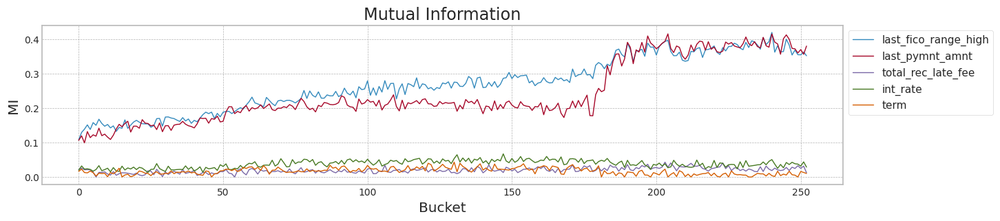

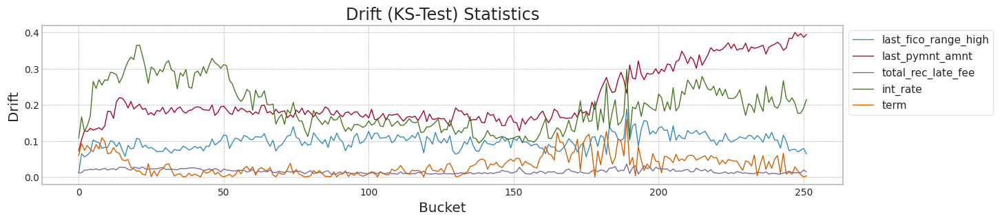

In [ ]:
from tqdm import tqdm

bucket_size_array=[5000]#[10,50,100,200]
tl = X[2010].shape[0]

######################## Normalization ############################
from sklearn.preprocessing import MinMaxScaler, StandardScaler
scaler_c1 = MinMaxScaler()
# trainset을 가지고 Scaler를 fit하고, testset을 포함한 그 이후의 Data를 모두 transform 한다.
X = pd.DataFrame(np.concatenate((scaler_c1.fit_transform(X[0:1800]), scaler_c1.transform(X[1800:])),axis=0), columns=columns)

for bucket_size in bucket_size_array:

    MIS = {}
    DRF = {}
    for col in top_columns:
        MIS[col] = []
        DRF[col] = []

    #step_size = int(x.shape[0]/bucket_size)
    step_size = int((X2.shape[0]-2000)/bucket_size)
    print('Bucket size',bucket_size,'step_size',step_size)

    for bk in tqdm(range(step_size)):
        #print(bk,step_size)
        mi_scores = make_mi_scores(X2_df_t5[bk*bucket_size:bk*bucket_size+bucket_size],
                                   Y2[bk*bucket_size:bk*bucket_size+bucket_size], discrete_features="auto")
        ks = __ks_drift(X_df[top_columns].values,X2_df_t5[bk*bucket_size+tl:bk*bucket_size+bucket_size+tl].values)
        for ix,col in enumerate(top_columns):
            MIS[col].append(mi_scores[col])
            DRF[col].append(ks[:,0][ix])

    df_mis = pd.DataFrame(MIS)
    df_drf = pd.DataFrame(DRF)
    df_mis.plot(figsize=main_figsize,linewidth=1,title='Mutual Information',ylabel='MI',xlabel='Bucket',fontsize=10)
    plt.legend(bbox_to_anchor=(1.0, 1.0))
    df_drf.plot(figsize=main_figsize,linewidth=1,title='Drift (KS-Test) Statistics',ylabel='Drift',xlabel='Bucket',fontsize=10)
    plt.legend(bbox_to_anchor=(1.0, 1.0))
    plt.show()

### Loan data의 학습

cuda:0


100%|██████████| 100/100 [00:02<00:00, 44.06it/s]


F1: 0.94


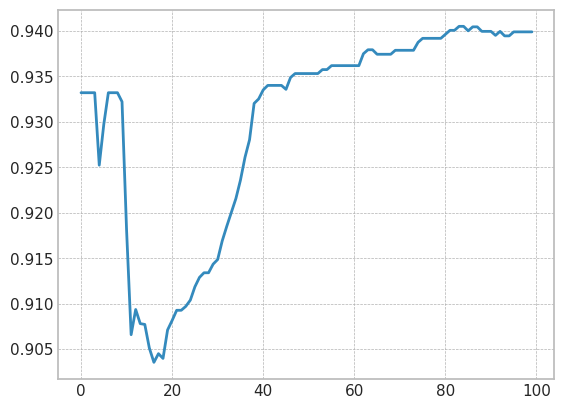

feature 5, test_f1 0.9405152224824355


In [ ]:
import copy
import torch.optim as optim
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import MinMaxScaler, StandardScaler
from sklearn.metrics import r2_score,precision_recall_fscore_support,f1_score

seed_everything()

device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
print(device)

tl,fl = X[2010].shape

#loan_scaler = MinMaxScaler()
#LX = loan_scaler.fit_transform(X[2010][:,top_columns_index])

X_train = torch.tensor(X[2010][:,top_columns_index][0:int(tl*0.9)], dtype=torch.float32).to(device)
y_train = torch.tensor(Y[2010][0:int(tl*0.9)], dtype=torch.float32).reshape(-1, 1).to(device)

X_test = torch.tensor(X[2010][:,top_columns_index][int(tl*0.9):tl], dtype=torch.float32).to(device)
y_test = torch.tensor(Y[2010][int(tl*0.9):tl], dtype=torch.float32).reshape(-1, 1).to(device)

# Define the model
loan_model = Generator().to(device)


# loss function and optimizer
loss_fn = nn.BCELoss()  # mean square error
optimizer = optim.Adam(loan_model.parameters(), lr=0.0001)

n_epochs = 100   # number of epochs to run
batch_size = 1000  # size of each batch
batch_start = torch.arange(0, len(X_train), batch_size)

# Hold the best model
best_mse = -np.inf   # init to infinity
best_weights = None
history = []

for epoch in tqdm(range(n_epochs)):
    loan_model.train()
    with tqdm(batch_start, unit="batch", mininterval=0, disable=True) as bar:
        bar.set_description(f"Epoch {epoch}")
        for start in bar:
            # take a batch
            X_batch = X_train[start:start+batch_size]
            y_batch = y_train[start:start+batch_size]
            # forward pass
            y_pred = loan_model(X_batch)
            loss = loss_fn(y_pred, y_batch)
            # backward pass
            optimizer.zero_grad()
            loss.backward()
            # update weights
            optimizer.step()
            # print progress
            bar.set_postfix(mse=float(loss))
    # evaluate accuracy at end of each epoch
    loan_model.eval()
    y_pred = loan_model(X_test)
    y_pred = (y_pred.cpu().data.numpy()> 0.5).astype(float)
    f1 = f1_score(y_pred, y_test.cpu().data.numpy())
    f1 = float(f1)
    history.append(f1)
    if f1 > best_mse:
        best_mse = f1
        best_weights = copy.deepcopy(loan_model.state_dict())

# restore model and return best accuracy
loan_model.load_state_dict(best_weights)
print("F1: %.2f" % best_mse)
plt.plot(history)
plt.show()

predicted_y = loan_model(X_test)
f1 = f1_score(y_test.cpu().data.numpy(),(predicted_y.cpu().data.numpy()> 0.5).astype(float))
print('feature 5, test_f1',f1)

100%|██████████| 252/252 [00:00<00:00, 280.39it/s]


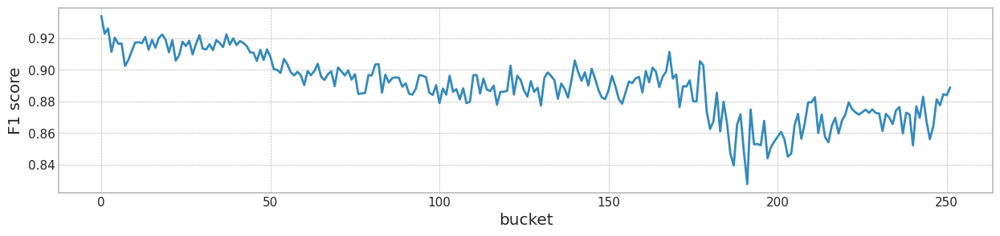

,lambda,test_f1,init_f1,mean_f1,last_f1,"MI(y^,z)"
0,"Loan data, Feature 81",0.940515,0.933882,0.889348,0.888839,0.0


In [ ]:
bucket_size_array=[5000]

for bucket_size in bucket_size_array:
    bucket_count = int(X2.shape[0]/bucket_size)-1
    f1s = []
    for bk in tqdm(range(bucket_count)):
        tmp_x = torch.tensor(X2[bk*bucket_size:bk*bucket_size+bucket_size][:,top_columns_index], dtype=torch.float32).to(device)
        predicted_y = loan_model(tmp_x)
        predicted_y = (predicted_y.cpu().data.numpy()> 0.5).astype(float)
        f1_ = f1_score(Y2[bk*bucket_size:bk*bucket_size+bucket_size],predicted_y)
        f1s.append(f1_)

    plt.figure(figsize=main_figsize)
    plt.plot(f1s)
    plt.ylabel('F1 score')
    plt.xlabel('bucket')
    #plt.title('Changes of F1 score according to bucket')
    plt.show()

result_table3 = {}
result_table3['lambda']=[]
result_table3['test_f1']=[]
result_table3['init_f1']=[]
result_table3['mean_f1']=[]
result_table3['last_f1']=[]
result_table3['MI(y^,z)']=[]

result_table3['lambda'].append('Loan data, Feature 81')
result_table3['test_f1'].append(f1)
result_table3['init_f1'].append(f1s[0])
result_table3['mean_f1'].append(np.mean(f1s))
result_table3['last_f1'].append(f1s[-1])
result_table3['MI(y^,z)'].append(0.0)

pd.DataFrame(result_table3)

### Concept-drift tolerant model 적용.

+ 100개씩 한 bucket으로 만든다.

In [ ]:
df_accepted['b'] = (np.asarray(list(df_accepted.index))/100).astype(int)

In [ ]:
X = {}
Y = {}

df = df_accepted[df_accepted['issue_d'].str.startswith('2007') + df_accepted['issue_d'].str.startswith('2008') + df_accepted['issue_d'].str.startswith('2009')].copy()
df = df.drop(columns=['issue_d'])


X[2009] = df.loc[:, df.columns != 'loan_paid'].values
Y[2009] = df.loan_paid.values


for year in range(2010,2019):
    print(year)
    df = df_accepted[df_accepted['issue_d'].str.startswith(str(year))].copy()
    df = df.drop(columns=['issue_d'])
    X[year] = df.loc[:, df.columns != 'loan_paid'].values
    Y[year] = df.loan_paid.values

2010
2011
2012
2013
2014
2015
2016
2017
2018


In [ ]:
# bucket b의 확인!
X[2010][:,81]

array([ 57.,  57.,  57., ..., 172., 172., 172.])

In [ ]:
sum(X[2010][:,81]==57)

3

In [ ]:
X[2010][0,81] = 58
X[2010][1,81] = 58
X[2010][2,81] = 58

In [ ]:
sum(X[2010][:,81]==57)

0

In [ ]:
sum(X[2010][:,81]==58)

103

In [ ]:
sum(X[2010][:,81]==172)

94

In [ ]:
X[2010].shape

(11497, 82)

In [ ]:
X[2010][103:].shape

(11394, 82)

In [ ]:
X_df_t5 = pd.DataFrame(X[2010],columns=list(COLUMNS) + ['b'])[top_columns]

In [ ]:
print(np.max(X[2010][:,81]))

172.0


+ 학습셋 X[2010]에서, MI와 Drift의 변화

Bucket size 200 step_size 56


100%|██████████| 56/56 [00:00<00:00, 74.41it/s]


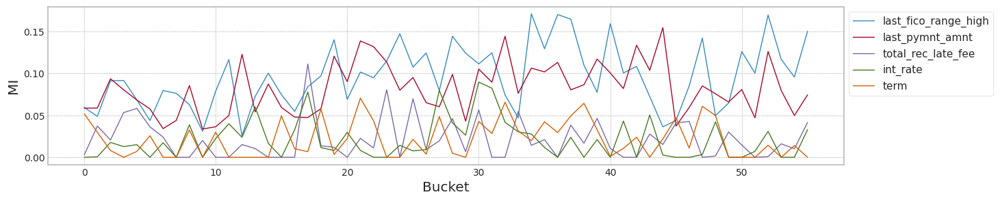

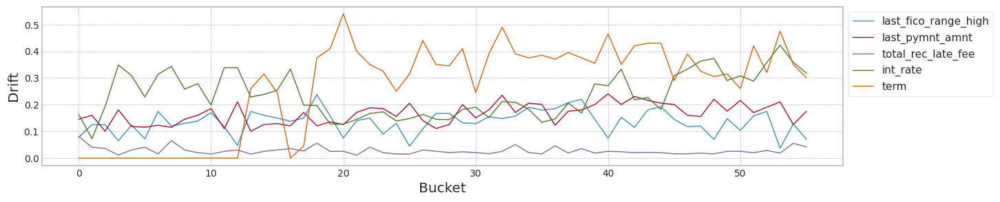

In [ ]:
from tqdm import tqdm

bucket_size_array=[200]#[10,50,100,200]
#bucket 58의 개수
tl = sum(X[2010][:,81]==58)

for bucket_size in bucket_size_array:

    MIS = {}
    DRF = {}
    for col in top_columns:
        MIS[col] = []
        DRF[col] = []

    #step_size = int(x.shape[0]/bucket_size)
    step_size = int(X[2010][tl:].shape[0]/bucket_size)
    print('Bucket size',bucket_size,'step_size',step_size)

    for bk in tqdm(range(step_size)):
        #print(bk,step_size)
        mi_scores = make_mi_scores(X_df_t5[bk*bucket_size:bk*bucket_size+bucket_size],
                                   Y[2010][bk*bucket_size:bk*bucket_size+bucket_size], discrete_features="auto")
        ks = __ks_drift(X_df_t5[0:103].values,X_df_t5[bk*bucket_size+tl:bk*bucket_size+bucket_size+tl].values)
        for ix,col in enumerate(top_columns):
            MIS[col].append(mi_scores[col])
            DRF[col].append(ks[:,0][ix])

    df_mis = pd.DataFrame(MIS)
    df_drf = pd.DataFrame(DRF)
    df_mis.plot(figsize=main_figsize,linewidth=1,ylabel='MI',xlabel='Bucket',fontsize=10)
    plt.legend(bbox_to_anchor=(1.0, 1.0))
    plt.show()
    df_drf.plot(figsize=main_figsize,linewidth=1,ylabel='Drift',xlabel='Bucket',fontsize=10)
    plt.legend(bbox_to_anchor=(1.0, 1.0))
    plt.show()

+ 상태를 보니.... 좋은 결과가 안나올 듯... 싶은데...

### Concept-drift tolerant model 적용

+ 위와 같이, MI Top5의 feature에 대하여 G를 적용하고, 나머지 feature는 그대로 Classification model에 들어가게 한다.

In [ ]:
X2 = np.concatenate((X[2011],X[2012],X[2013],X[2014],X[2015],X[2016],X[2017]))
Y2 = np.concatenate((Y[2011],Y[2012],Y[2013],Y[2014],Y[2015],Y[2016],Y[2017]))
#X2 = np.concatenate((X[2011],X[2012],X[2013]))
#Y2 = np.concatenate((Y[2011],Y[2012],Y[2013]))
max_b = np.max(X2[:,81])
max_b

12854.0

In [ ]:

def loan_train_model(train_tensors, test_tensors, train_opt, lambda_f, seed, alpha, ShowChart = False):
    seed_everything()

    device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
    print(device)

    XS_train = train_tensors.XS_train.to(device)
    y_train = train_tensors.y_train.to(device)

    XS_test = test_tensors.XS_test.to(device)
    y_test = test_tensors.y_test.to(device)

    # Saves return values here
    #test_result = []

    val = train_opt.val # Number of data points in validation set
    k = train_opt.k     # Update ratio of generator and discriminator (1:k training).
    n_epochs = train_opt.n_epochs  # Number of training epoch


    # The loss values of each component will be saved in the following lists.
    # We can draw epoch-loss graph by the following lists, if necessary.
    g_losses =[]
    a_losses = []

    bce_loss = nn.BCELoss()
    mse_loss = nn.MSELoss()  # mean square error

    # Initializes generator and discriminator
    generator = Generator().to(device)

    optimizer_G = torch.optim.Adam(generator.parameters(), lr=train_opt.lr_g)

    train_len = XS_train.shape[0]

    adapter = Sensitivity_Adapter(5).to(device)
    optimizer_A = torch.optim.Adam(adapter.parameters(), lr=0.001)

    #mine = Net()
    #optimizer_M = torch.optim.Adam(mine.parameters(), lr=0.001)

    minibatch = 1000

    for epoch in range(n_epochs):


        # -------------------------------
        #  b에 대한 x의 전처리
        # -------------------------------

        if lambda_f >= 0.0:
            xs = adapter(XS_train[:,0:5],XS_train[:,5].reshape(-1,1)/avaible_range) # z0, b
            a_loss = torch.sum(mse_loss(xs, XS_train[:,0:5]))
        else:
            xs = XS_train[:,0:5]
            a_loss = torch.tensor(0)

        a_losses.append(a_loss.cpu().data.numpy())
        # -------------------
        #  Forwards Generator
        # -------------------
        #xs = torch.cat((XS_train[:,0:4], a_z.reshape(-1,1)), 1)
        #print(xs.shape)
        gen_y = generator(xs).reshape(-1,1)
        g_loss = bce_loss(gen_y, y_train.reshape(-1,1))
        g_losses.append(g_loss.cpu().data.numpy())

        optimizer_A.zero_grad()
        #optimizer_M.zero_grad()
        optimizer_G.zero_grad()

        if lambda_f >= 0.0:
            loss = (1-lambda_f) * g_loss +  lambda_f * a_loss * alpha #* 0.05
        else:
            loss = g_loss

        loss.backward()
        optimizer_G.step()
        #optimizer_M.step()
        optimizer_A.step()

        if epoch % 200 == 0:
            print(
                    "[Lambda: %1f] [Epoch %d/%d] [a loss: %f] [G loss: %f]"
                    % (lambda_f, epoch, n_epochs, a_losses[-1], g_losses[-1])
                )

        if lambda_f < 0.0:
            adapter = None

#     torch.save(generator.state_dict(), './FR-Train_on_poi_synthetic.pth')
    f1,mi = test_model(generator,adapter, XS_test, y_test, None)
    #test_result.append([lambda_f, tmp[0].item(), tmp[1]])

    df_loss = pd.DataFrame({'Adapter loss':a_losses,'Classifier loss':g_losses})
    if ShowChart:
        df_loss.plot(figsize=main_figsize,linewidth=1,ylabel='loss',xlabel=f'bucket ({bucket_size})',fontsize=15)
        plt.legend(loc=1)
        plt.show()
    '''
    plt.figure(figsize=main_figsize)
    plt.plot(a_losses,linewidth=1,label='Adapter loss')
    plt.plot(g_losses,linewidth=1,label='classifier loss')
    plt.ylabel('loss')
    plt.xlabel(f'bucket ({bucket_size})')
    plt.legend(loc=1,ncol=2)
    plt.show()
    '''
    return f1,mi,generator,adapter,df_loss

lambda_f2 1.2
cuda:0
[Lambda: -0.100000] [Epoch 0/4000] [a loss: 0.000000] [G loss: 12.698036]
[Lambda: -0.100000] [Epoch 200/4000] [a loss: 0.000000] [G loss: 0.511513]
[Lambda: -0.100000] [Epoch 400/4000] [a loss: 0.000000] [G loss: 0.368868]
[Lambda: -0.100000] [Epoch 600/4000] [a loss: 0.000000] [G loss: 0.333194]
[Lambda: -0.100000] [Epoch 800/4000] [a loss: 0.000000] [G loss: 0.314646]
[Lambda: -0.100000] [Epoch 1000/4000] [a loss: 0.000000] [G loss: 0.304702]
[Lambda: -0.100000] [Epoch 1200/4000] [a loss: 0.000000] [G loss: 0.298081]
[Lambda: -0.100000] [Epoch 1400/4000] [a loss: 0.000000] [G loss: 0.291490]
[Lambda: -0.100000] [Epoch 1600/4000] [a loss: 0.000000] [G loss: 0.285463]
[Lambda: -0.100000] [Epoch 1800/4000] [a loss: 0.000000] [G loss: 0.282612]
[Lambda: -0.100000] [Epoch 2000/4000] [a loss: 0.000000] [G loss: 0.281082]
[Lambda: -0.100000] [Epoch 2200/4000] [a loss: 0.000000] [G loss: 0.280110]
[Lambda: -0.100000] [Epoch 2400/4000] [a loss: 0.000000] [G loss: 0.27936

100%|██████████| 252/252 [00:26<00:00,  9.50it/s]


mean of drift:
last_fico_range_high    0.097853
last_pymnt_amnt         0.213586
total_rec_late_fee      0.015737
int_rate                0.192546
term                    0.034836
dtype: float64
Mean F1 for all data: 0.9216325107513841
cuda:0
[Lambda: 0.000000] [Epoch 0/4000] [a loss: 3908314.750000] [G loss: 0.477025]
[Lambda: 0.000000] [Epoch 200/4000] [a loss: 4141009.750000] [G loss: 0.275146]
[Lambda: 0.000000] [Epoch 400/4000] [a loss: 4094837.500000] [G loss: 0.266316]
[Lambda: 0.000000] [Epoch 600/4000] [a loss: 4078857.250000] [G loss: 0.261379]
[Lambda: 0.000000] [Epoch 800/4000] [a loss: 4079112.750000] [G loss: 0.231816]
[Lambda: 0.000000] [Epoch 1000/4000] [a loss: 4069449.250000] [G loss: 0.227538]
[Lambda: 0.000000] [Epoch 1200/4000] [a loss: 4057276.500000] [G loss: 0.224912]
[Lambda: 0.000000] [Epoch 1400/4000] [a loss: 4052927.500000] [G loss: 0.223939]
[Lambda: 0.000000] [Epoch 1600/4000] [a loss: 4048661.000000] [G loss: 0.223432]
[Lambda: 0.000000] [Epoch 1800/4000

100%|██████████| 252/252 [00:25<00:00,  9.95it/s]


mean of drift:
last_fico_range_high    0.999892
last_pymnt_amnt         0.998534
total_rec_late_fee      0.988047
int_rate                1.000000
term                    1.000000
dtype: float64
Mean F1 for all data: 0.9250448353412393
cuda:0
[Lambda: 0.100000] [Epoch 0/4000] [a loss: 3908314.750000] [G loss: 0.477025]
[Lambda: 0.100000] [Epoch 200/4000] [a loss: 1.352545] [G loss: 0.525531]
[Lambda: 0.100000] [Epoch 400/4000] [a loss: 0.014880] [G loss: 0.406011]
[Lambda: 0.100000] [Epoch 600/4000] [a loss: 0.013708] [G loss: 0.360679]
[Lambda: 0.100000] [Epoch 800/4000] [a loss: 0.012435] [G loss: 0.332579]
[Lambda: 0.100000] [Epoch 1000/4000] [a loss: 0.011111] [G loss: 0.314231]
[Lambda: 0.100000] [Epoch 1200/4000] [a loss: 0.009751] [G loss: 0.302480]
[Lambda: 0.100000] [Epoch 1400/4000] [a loss: 0.008337] [G loss: 0.294784]
[Lambda: 0.100000] [Epoch 1600/4000] [a loss: 0.006872] [G loss: 0.289556]
[Lambda: 0.100000] [Epoch 1800/4000] [a loss: 0.004654] [G loss: 0.286513]
[Lambda:

100%|██████████| 252/252 [00:25<00:00,  9.76it/s]


mean of drift:
last_fico_range_high    0.124786
last_pymnt_amnt         0.213566
total_rec_late_fee      0.953871
int_rate                0.209886
term                    0.733322
dtype: float64
Mean F1 for all data: 0.9232201419061928
cuda:0
[Lambda: 0.200000] [Epoch 0/4000] [a loss: 3908314.750000] [G loss: 0.477025]
[Lambda: 0.200000] [Epoch 200/4000] [a loss: 1.344602] [G loss: 0.525655]
[Lambda: 0.200000] [Epoch 400/4000] [a loss: 0.014342] [G loss: 0.406055]
[Lambda: 0.200000] [Epoch 600/4000] [a loss: 0.012810] [G loss: 0.360700]
[Lambda: 0.200000] [Epoch 800/4000] [a loss: 0.008084] [G loss: 0.332593]
[Lambda: 0.200000] [Epoch 1000/4000] [a loss: 0.007485] [G loss: 0.314242]
[Lambda: 0.200000] [Epoch 1200/4000] [a loss: 0.000903] [G loss: 0.302488]
[Lambda: 0.200000] [Epoch 1400/4000] [a loss: 0.002481] [G loss: 0.294803]
[Lambda: 0.200000] [Epoch 1600/4000] [a loss: 0.000106] [G loss: 0.289573]
[Lambda: 0.200000] [Epoch 1800/4000] [a loss: 0.000097] [G loss: 0.286522]
[Lambda:

100%|██████████| 252/252 [00:25<00:00,  9.78it/s]


mean of drift:
last_fico_range_high    0.124776
last_pymnt_amnt         0.213566
total_rec_late_fee      0.955084
int_rate                0.209981
term                    0.733322
dtype: float64
Mean F1 for all data: 0.9232324293467361
cuda:0
[Lambda: 0.300000] [Epoch 0/4000] [a loss: 3908314.750000] [G loss: 0.477025]
[Lambda: 0.300000] [Epoch 200/4000] [a loss: 1.342537] [G loss: 0.525752]
[Lambda: 0.300000] [Epoch 400/4000] [a loss: 0.014457] [G loss: 0.406090]
[Lambda: 0.300000] [Epoch 600/4000] [a loss: 0.012568] [G loss: 0.360725]
[Lambda: 0.300000] [Epoch 800/4000] [a loss: 0.004689] [G loss: 0.332610]
[Lambda: 0.300000] [Epoch 1000/4000] [a loss: 0.002555] [G loss: 0.314256]
[Lambda: 0.300000] [Epoch 1200/4000] [a loss: 0.000440] [G loss: 0.302503]
[Lambda: 0.300000] [Epoch 1400/4000] [a loss: 0.000114] [G loss: 0.294813]
[Lambda: 0.300000] [Epoch 1600/4000] [a loss: 0.002045] [G loss: 0.289580]
[Lambda: 0.300000] [Epoch 1800/4000] [a loss: 0.000100] [G loss: 0.286528]
[Lambda:

100%|██████████| 252/252 [00:25<00:00,  9.77it/s]


mean of drift:
last_fico_range_high    0.124780
last_pymnt_amnt         0.213615
total_rec_late_fee      0.955084
int_rate                0.210064
term                    0.733322
dtype: float64
Mean F1 for all data: 0.9233199968030029
cuda:0
[Lambda: 0.400000] [Epoch 0/4000] [a loss: 3908314.750000] [G loss: 0.477025]
[Lambda: 0.400000] [Epoch 200/4000] [a loss: 1.340806] [G loss: 0.525739]
[Lambda: 0.400000] [Epoch 400/4000] [a loss: 0.009718] [G loss: 0.406133]
[Lambda: 0.400000] [Epoch 600/4000] [a loss: 0.012563] [G loss: 0.360719]
[Lambda: 0.400000] [Epoch 800/4000] [a loss: 0.010257] [G loss: 0.332607]
[Lambda: 0.400000] [Epoch 1000/4000] [a loss: 0.008265] [G loss: 0.314256]
[Lambda: 0.400000] [Epoch 1200/4000] [a loss: 0.002231] [G loss: 0.302501]
[Lambda: 0.400000] [Epoch 1400/4000] [a loss: 0.000602] [G loss: 0.294812]
[Lambda: 0.400000] [Epoch 1600/4000] [a loss: 0.002176] [G loss: 0.289584]
[Lambda: 0.400000] [Epoch 1800/4000] [a loss: 0.000094] [G loss: 0.286525]
[Lambda:

100%|██████████| 252/252 [00:25<00:00,  9.85it/s]


mean of drift:
last_fico_range_high    0.124780
last_pymnt_amnt         0.213566
total_rec_late_fee      0.955084
int_rate                0.210063
term                    0.733322
dtype: float64
Mean F1 for all data: 0.9234729313961751
cuda:0
[Lambda: 0.500000] [Epoch 0/4000] [a loss: 3908314.750000] [G loss: 0.477025]
[Lambda: 0.500000] [Epoch 200/4000] [a loss: 1.340410] [G loss: 0.525752]
[Lambda: 0.500000] [Epoch 400/4000] [a loss: 0.013778] [G loss: 0.406091]
[Lambda: 0.500000] [Epoch 600/4000] [a loss: 0.012618] [G loss: 0.360717]
[Lambda: 0.500000] [Epoch 800/4000] [a loss: 0.011332] [G loss: 0.332597]
[Lambda: 0.500000] [Epoch 1000/4000] [a loss: 0.009908] [G loss: 0.314253]
[Lambda: 0.500000] [Epoch 1200/4000] [a loss: 0.008214] [G loss: 0.302510]
[Lambda: 0.500000] [Epoch 1400/4000] [a loss: 0.002236] [G loss: 0.294816]
[Lambda: 0.500000] [Epoch 1600/4000] [a loss: 0.000751] [G loss: 0.289584]
[Lambda: 0.500000] [Epoch 1800/4000] [a loss: 0.000100] [G loss: 0.286523]
[Lambda:

100%|██████████| 252/252 [00:25<00:00,  9.76it/s]


mean of drift:
last_fico_range_high    0.124780
last_pymnt_amnt         0.213565
total_rec_late_fee      0.955084
int_rate                0.210093
term                    0.733322
dtype: float64
Mean F1 for all data: 0.923392806495482
cuda:0
[Lambda: 0.600000] [Epoch 0/4000] [a loss: 3908314.750000] [G loss: 0.477025]
[Lambda: 0.600000] [Epoch 200/4000] [a loss: 1.341711] [G loss: 0.525769]
[Lambda: 0.600000] [Epoch 400/4000] [a loss: 0.013747] [G loss: 0.406090]
[Lambda: 0.600000] [Epoch 600/4000] [a loss: 0.012624] [G loss: 0.360717]
[Lambda: 0.600000] [Epoch 800/4000] [a loss: 0.011357] [G loss: 0.332597]
[Lambda: 0.600000] [Epoch 1000/4000] [a loss: 0.009998] [G loss: 0.314254]
[Lambda: 0.600000] [Epoch 1200/4000] [a loss: 0.008597] [G loss: 0.302509]
[Lambda: 0.600000] [Epoch 1400/4000] [a loss: 0.006983] [G loss: 0.294820]
[Lambda: 0.600000] [Epoch 1600/4000] [a loss: 0.000112] [G loss: 0.289585]
[Lambda: 0.600000] [Epoch 1800/4000] [a loss: 0.000094] [G loss: 0.286527]
[Lambda: 

100%|██████████| 252/252 [00:25<00:00,  9.72it/s]


mean of drift:
last_fico_range_high    0.124771
last_pymnt_amnt         0.213565
total_rec_late_fee      0.955083
int_rate                0.210100
term                    0.731137
dtype: float64
Mean F1 for all data: 0.9234610123265314
cuda:0
[Lambda: 0.700000] [Epoch 0/4000] [a loss: 3908314.750000] [G loss: 0.477025]
[Lambda: 0.700000] [Epoch 200/4000] [a loss: 1.343041] [G loss: 0.525797]
[Lambda: 0.700000] [Epoch 400/4000] [a loss: 0.013703] [G loss: 0.406098]
[Lambda: 0.700000] [Epoch 600/4000] [a loss: 0.012327] [G loss: 0.360722]
[Lambda: 0.700000] [Epoch 800/4000] [a loss: 0.010324] [G loss: 0.332602]
[Lambda: 0.700000] [Epoch 1000/4000] [a loss: 0.000421] [G loss: 0.314254]
[Lambda: 0.700000] [Epoch 1200/4000] [a loss: 0.000124] [G loss: 0.302504]
[Lambda: 0.700000] [Epoch 1400/4000] [a loss: 0.000117] [G loss: 0.294816]
[Lambda: 0.700000] [Epoch 1600/4000] [a loss: 0.000127] [G loss: 0.289587]
[Lambda: 0.700000] [Epoch 1800/4000] [a loss: 0.000154] [G loss: 0.286529]
[Lambda:

100%|██████████| 252/252 [00:25<00:00,  9.84it/s]


mean of drift:
last_fico_range_high    0.124776
last_pymnt_amnt         0.213566
total_rec_late_fee      0.955082
int_rate                0.210090
term                    0.732016
dtype: float64
Mean F1 for all data: 0.9235319339442148
cuda:0
[Lambda: 0.800000] [Epoch 0/4000] [a loss: 3908314.750000] [G loss: 0.477025]
[Lambda: 0.800000] [Epoch 200/4000] [a loss: 1.345028] [G loss: 0.525825]
[Lambda: 0.800000] [Epoch 400/4000] [a loss: 0.013605] [G loss: 0.406108]
[Lambda: 0.800000] [Epoch 600/4000] [a loss: 0.011421] [G loss: 0.360729]
[Lambda: 0.800000] [Epoch 800/4000] [a loss: 0.000879] [G loss: 0.332602]
[Lambda: 0.800000] [Epoch 1000/4000] [a loss: 0.000175] [G loss: 0.314255]
[Lambda: 0.800000] [Epoch 1200/4000] [a loss: 0.000114] [G loss: 0.302505]
[Lambda: 0.800000] [Epoch 1400/4000] [a loss: 0.000141] [G loss: 0.294816]
[Lambda: 0.800000] [Epoch 1600/4000] [a loss: 0.000146] [G loss: 0.289587]
[Lambda: 0.800000] [Epoch 1800/4000] [a loss: 0.000175] [G loss: 0.286531]
[Lambda:

100%|██████████| 252/252 [00:25<00:00,  9.93it/s]


mean of drift:
last_fico_range_high    0.124776
last_pymnt_amnt         0.213570
total_rec_late_fee      0.953285
int_rate                0.210088
term                    0.733936
dtype: float64
Mean F1 for all data: 0.9235115360442736
cuda:0
[Lambda: 0.900000] [Epoch 0/4000] [a loss: 3908314.750000] [G loss: 0.477025]
[Lambda: 0.900000] [Epoch 200/4000] [a loss: 1.347236] [G loss: 0.525755]
[Lambda: 0.900000] [Epoch 400/4000] [a loss: 0.013455] [G loss: 0.406093]
[Lambda: 0.900000] [Epoch 600/4000] [a loss: 0.011526] [G loss: 0.360715]
[Lambda: 0.900000] [Epoch 800/4000] [a loss: 0.000912] [G loss: 0.332588]
[Lambda: 0.900000] [Epoch 1000/4000] [a loss: 0.000182] [G loss: 0.314241]
[Lambda: 0.900000] [Epoch 1200/4000] [a loss: 0.000142] [G loss: 0.302496]
[Lambda: 0.900000] [Epoch 1400/4000] [a loss: 0.000135] [G loss: 0.294810]
[Lambda: 0.900000] [Epoch 1600/4000] [a loss: 0.000141] [G loss: 0.289585]
[Lambda: 0.900000] [Epoch 1800/4000] [a loss: 0.000147] [G loss: 0.286530]
[Lambda:

100%|██████████| 252/252 [00:25<00:00,  9.84it/s]


mean of drift:
last_fico_range_high    0.124776
last_pymnt_amnt         0.213566
total_rec_late_fee      0.952238
int_rate                0.210078
term                    0.735287
dtype: float64
Mean F1 for all data: 0.9235541644739813


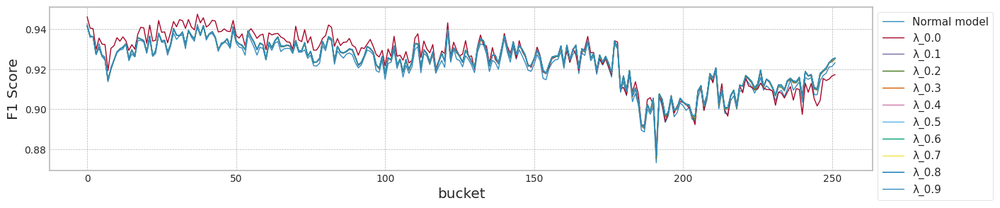

                     lambda   test_f1   init_f1   mean_f1   last_f1  MI(y^,z)
0   Loan data, Normal model  0.952941  0.942752  0.921633  0.923310  0.138852
1                       0.0  0.965116  0.946142  0.925045  0.917302  0.165507
2                       0.1  0.952941  0.941583  0.923220  0.925254  0.138852
3                       0.2  0.952941  0.941688  0.923232  0.925254  0.138852
4                       0.3  0.952941  0.941583  0.923320  0.925254  0.138852
5                       0.4  0.952941  0.941452  0.923473  0.925471  0.138852
6                       0.5  0.952941  0.941583  0.923393  0.925363  0.138852
7                       0.6  0.952941  0.941688  0.923461  0.925579  0.138852
8                       0.7  0.952941  0.941688  0.923532  0.925579  0.138852
9                       0.8  0.952941  0.941583  0.923512  0.925579  0.138852
10                      0.9  0.952941  0.941688  0.923554  0.925579  0.138852
max_mean_lambda= 0.0


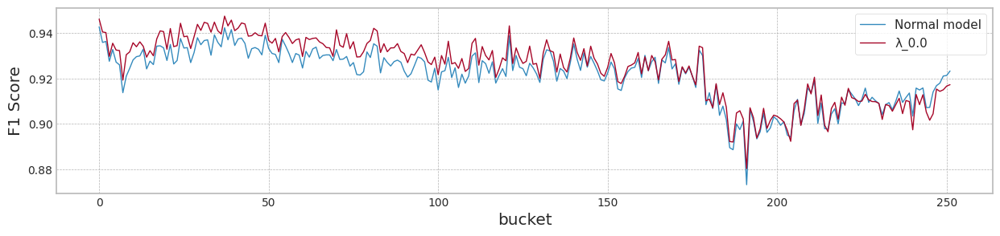

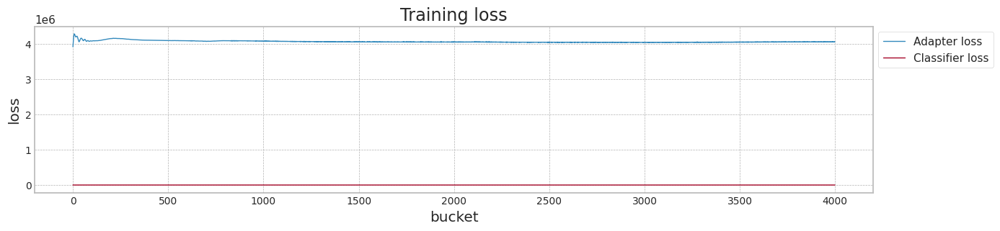

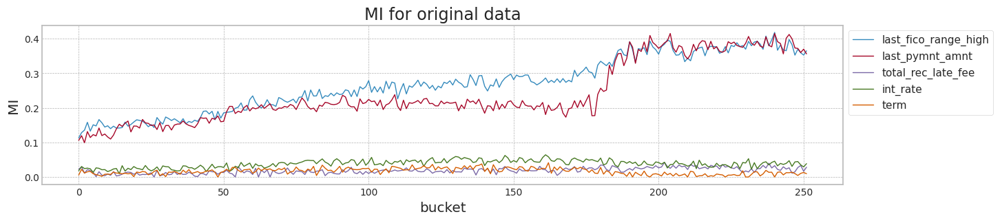

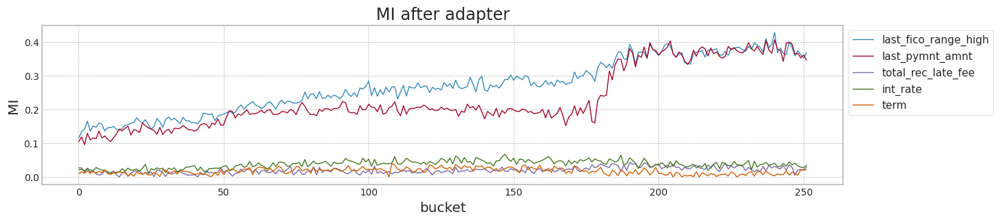

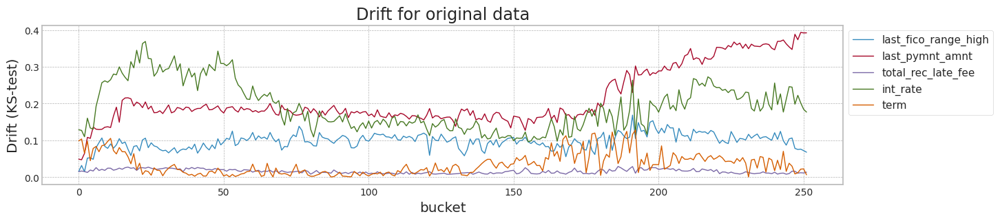

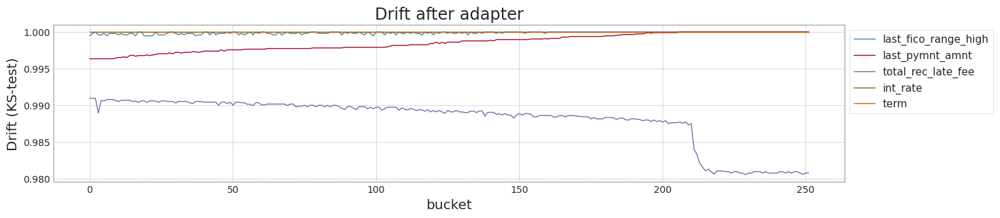

In [ ]:
avaible_range = max_b
seed = 1

LX = pd.DataFrame(X[2010],columns=list(COLUMNS) + ['b'])[top_columns+['b']].values

train_tensors = Namespace(XS_train = torch.tensor(LX[0:LX.shape[0] - 94], dtype=torch.float32),
                          y_train = torch.tensor(Y[2010][0:LX.shape[0] - 94], dtype=torch.float32))
test_tensors = Namespace(XS_test = torch.tensor(LX[LX.shape[0] - 94:LX.shape[0]], dtype=torch.float32),
                         y_test = torch.tensor(Y[2010][LX.shape[0] - 94:LX.shape[0]], dtype=torch.float32))

train_opt = Namespace(val=0, n_epochs=4000, k=5, lr_g=0.0001, lr_f=0.001, lr_r=0.001)
lambda_f_set = [-0.1,0.0,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9] #[-0.1,0.0,0.5] #
lambda_f_set2 = [1.2]
lambda_a2 = 0.0

columns = top_columns

train_df = pd.DataFrame(X[2010][:,top_columns_index],columns=columns)
live_df = pd.DataFrame(X2[:,top_columns_index+[81]],columns=columns+['b'])

for lambda_f2 in lambda_f_set2:
    #lambda_a2 = lambda_f2
    print('lambda_f2',lambda_f2)
    result_table = {}
    result_table2 = {}
    result_table2['lambda']=[]
    result_table2['test_f1']=[]
    result_table2['init_f1']=[]
    result_table2['mean_f1']=[]
    result_table2['last_f1']=[]
    result_table2['MI(y^,z)']=[]
    infos = {}
    for lambda_f in lambda_f_set:

        f1,mi,last_generator, last_adapter, df_loss = loan_train_model(train_tensors, test_tensors, train_opt, lambda_f = lambda_f, seed = seed, alpha= lambda_f2 )# 0.00057)
        tad,df_mis,df_drf = test_all_data(last_generator,last_adapter,
                                          train_df,
                                          live_df,
                                          Y2,
                                          bucket_size_array=[5000])
        if lambda_f < 0.0:
            result_table2['lambda'].append("Loan data, Normal model")
            result_table['Normal model'] = tad
        else:
            result_table2['lambda'].append(lambda_f)
            result_table[f'λ_{lambda_f}'] = tad

        infos[f'λ_{lambda_f}'] = (df_loss,df_mis,df_drf)
        result_table2['test_f1'].append(f1)
        result_table2['init_f1'].append(tad[0])
        result_table2['mean_f1'].append(np.mean(tad))
        result_table2['last_f1'].append(tad[-1])
        result_table2['MI(y^,z)'].append(mi)

    result_df = pd.DataFrame(result_table)
    result_df.plot(figsize=main_figsize,linewidth=1,ylabel='F1 Score',xlabel='bucket',fontsize=10)
    plt.legend(bbox_to_anchor=(1.0, 1.0))
    plt.show()

    result4_df = pd.DataFrame(result_table2)

    print(result4_df)

    max_mean_lambda = result4_df[result4_df['mean_f1']==np.max(result4_df['mean_f1'])]['lambda']

    print('max_mean_lambda=',max_mean_lambda.values[0])

    result_df[['Normal model',f'λ_{max_mean_lambda.values[0]}']].plot(figsize=main_figsize,linewidth=1,ylabel='F1 Score',xlabel='bucket',fontsize=10)
    plt.legend(bbox_to_anchor=(1.0, 1.0))
    plt.show()

    og_loss,og_mis,og_drf = infos['λ_-0.1']
    df_loss,df_mis,df_drf = infos[f'λ_{max_mean_lambda.values[0]}']

    df_loss.astype(np.float32).plot(figsize=main_figsize,linewidth=1,ylabel='loss',xlabel='bucket',title='Training loss',fontsize=10)
    plt.legend(bbox_to_anchor=(1.0, 1.0))
    plt.show()

    og_mis.astype(np.float32).plot(figsize=main_figsize,linewidth=1,ylabel='MI',xlabel='bucket',title='MI for original data',fontsize=10)
    plt.legend(bbox_to_anchor=(1.0, 1.0))
    plt.show()

    df_mis.astype(np.float32).plot(figsize=main_figsize,linewidth=1,ylabel='MI',xlabel='bucket',title='MI after adapter',fontsize=10)
    plt.legend(bbox_to_anchor=(1.0, 1.0))
    plt.show()

    og_drf.astype(np.float32).plot(figsize=main_figsize,linewidth=1,ylabel='Drift (KS-test)',xlabel='bucket',title='Drift for original data',fontsize=10)
    plt.legend(bbox_to_anchor=(1.0, 1.0))
    plt.show()

    df_drf.astype(np.float32).plot(figsize=main_figsize,linewidth=1,ylabel='Drift (KS-test)',xlabel='bucket',title='Drift after adapter',fontsize=10)
    plt.legend(bbox_to_anchor=(1.0, 1.0))
    plt.show()